In [26]:
import requests
from bs4 import BeautifulSoup
from urllib.request import urlopen
from urllib import parse
import pandas as pd
import numpy as np
import xlrd
import re
from openpyxl import Workbook
from collections import Counter
from tqdm import tqdm
import logging
import tensorflow as tf
import sklearn
import hanja
from konlpy.tag import Okt, Hannanum, Kkma, Komoran
from soynlp.word import WordExtractor
from soynlp.noun import LRNounExtractor
from soynlp.tokenizer import LTokenizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
from nltk import Text
import hanja
from hanja import hangul
import time
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.font_manager as fm
font_path = 'C:/Users/tjswn/tensorflow-ml-nlp-tf2/7.PRETRAIN_METHOD/data_in/KOR/NanumGothic.ttf'

from sklearn.datasets import make_classification
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler

In [396]:
data = pd.read_excel("original_data.xlsx", index_col = 0)
data.head()

,title,date,text
0,"검찰 ""유해용, 사법행정권 이탈해""…1심 무죄 작심 비판",등록 2020-10-08 13:41:57,"대법원 문건 무단으로 유출 혐의 등\r\n1심 ""인정증거·범죄고의 없다"" 무죄\r\..."
1,"안태근 무죄 확정…서지현 검사 ""검찰, 변하질 않는구나""",등록 2020-10-08 09:38:16,"""검찰 썩은내 나는 모습 알리기 위해 폭로""\r\n""변하지 않는 검찰과 세상에 고통..."
2,"만취 비정규직 성폭행 은행원, 징역형···1심에서는 무죄",등록 2020-10-08 06:00:00,[대구=뉴시스] 김정화 기자 = 회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의...
3,"4번 재판 끝에…안태근, '서지현 불이익 혐의' 무죄 확정",등록 2020-10-07 20:12:41,"직권남용해 서지현 인사에 불이익 준 혐의\r\n1심 ""인사 불이익"" 징역2년→2심,..."
4,"윤한홍 ""국정농단 사건 재판의 무죄율, 일반보다 5배 높아""",등록 2020-10-07 17:54:26,"""1심에서 무죄 판결 난 후 항소심 등 열지 않기도""\t\t\t\t\t\t\t\t\..."


In [343]:
data = pd.read_excel("original_data.xlsx", index_col = 0)
data.head(15)

,title,date,text
0,"검찰 ""유해용, 사법행정권 이탈해""…1심 무죄 작심 비판",등록 2020-10-08 13:41:57,"대법원 문건 무단으로 유출 혐의 등\r\n1심 ""인정증거·범죄고의 없다"" 무죄\r\..."
1,"안태근 무죄 확정…서지현 검사 ""검찰, 변하질 않는구나""",등록 2020-10-08 09:38:16,"""검찰 썩은내 나는 모습 알리기 위해 폭로""\r\n""변하지 않는 검찰과 세상에 고통..."
2,"만취 비정규직 성폭행 은행원, 징역형···1심에서는 무죄",등록 2020-10-08 06:00:00,[대구=뉴시스] 김정화 기자 = 회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의...
3,"4번 재판 끝에…안태근, '서지현 불이익 혐의' 무죄 확정",등록 2020-10-07 20:12:41,"직권남용해 서지현 인사에 불이익 준 혐의\r\n1심 ""인사 불이익"" 징역2년→2심,..."
4,"윤한홍 ""국정농단 사건 재판의 무죄율, 일반보다 5배 높아""",등록 2020-10-07 17:54:26,"""1심에서 무죄 판결 난 후 항소심 등 열지 않기도""\t\t\t\t\t\t\t\t\..."
5,결별전 애인 집에 수시로 들락날락…주거침입 1심 무죄,등록 2020-10-07 06:01:00,"8회 걸쳐 전 여친 집에 주거침입한 혐의\r\n1심서 무죄…""주거침입 고의 증명 안..."
6,"'천안함 좌초설' 신상철 前합조단 위원, 항소심서 무죄",등록 2020-10-06 16:43:38,"""침몰원인 은폐"" 軍관계자 명예훼손 혐의\r\n1심 ""자극적 표현으로 비방해"" 집행..."
7,"'구속수사 했는데 무죄' 매년 160명…""검찰 무리한 수사""",등록 2020-10-06 09:28:04,구속기소 뒤 무죄선고 현황 통계 공개\r\n무죄사건 중 검찰 과오 인정한 건 일부\...
8,'뇌전증' 의한 일시적 기억소실로 뺑소니…1심 무죄,등록 2020-10-05 09:00:00,"도로교통법 위반 혐의 등…1심 무죄\r\n교통사고처리특례법 위반 공소기각\r\n""뇌..."
9,"""법대교수다"" 속이고 '조국 사퇴' 허위서명…1심 무죄",등록 2020-10-01 13:01:00,"직업 교수라 속여 서명운동 참여\r\n업무방해 혐의로 기소…1심 무죄\r\n""허위서..."


In [345]:
data2 = pd.read_excel('preprocessing_data_af_rm_kw.xlsx', index_col=0)
data2.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄/벌금/집행유예,무죄,범죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄/벌금/집행유예,무죄,NaN


In [346]:
del data2['sentence3']

In [352]:
data2.head(10)

,title,date,text,sentence,sentence2,sentence4,crime
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄,범죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄,성추행
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄,성폭행
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄,성추행
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄,NaN
5,결별전 애인 집에 수시로 들락날락 주거침입 1심 무죄,2020-10-07,8회 걸쳐 전 여친 집에 주거침입한 혐의 1심서 주거침입 고의 증명 안 돼 사건 ...,무죄,무죄,무죄,NaN
6,천안함 좌초설 신상철 전합조단 위원 항소심서 무죄,2020-10-06,침몰원인 은폐 관계자 명예훼손 혐의 1심 자극적 표현으로 비방해 2심 비방 목적...,무죄,무죄,무죄,명예훼손
7,구속수사 했는데 무죄 매년 160명 검찰 무리한 수사,2020-10-06,구속기소 뒤 선고 현황 통계 공개 사건 중 검찰 과오 인정한 건 일부 최기상 더불어...,무죄,무죄,무죄,NaN
8,뇌전증 의한 일시적 기억소실로 뺑소니 1심 무죄,2020-10-05,도로교통법 위반 혐의 등 1심 교통사고처리특례법 위반 공소기각 뇌전증의한 의식소실...,무죄,무죄,무죄,상해
9,법대교수다 속이고 조국 사퇴 허위서명 1심 무죄,2020-10-01,직업 교수라 속여 서명운동 참여 업무방해 혐의로 기소 1심 허위서명 가능성 알 수...,무죄,무죄,무죄,사기


In [350]:
data2.iloc[200:215, :]

,title,date,text,sentence,sentence2,sentence4,crime
200,범행도구 없는 사건 관악구 모자살인 사형 vs 무죄 종합,2020-03-31,검찰 잔혹한 수법으로 아내와 아들 살해 변호인 직접증거 범행동기 없어 다 처자식 살...,무죄,무죄,무죄,살인
201,45년만에 무죄난 재일동포 간첩조작 법원 11억 보상,2020-03-30,박정희 정부 시절 육군보안사령부에 체포 확정 재심청구 만 법원 4310만원...,무죄,무죄,무죄,사기
202,이웃집에 썩은 가지 달걀 버린 혐의 20대 무죄,2020-03-29,검찰 증거만으로는 쓰레기 투척 단정 어려워 이웃집에 썩은 가지와 달걀 등의 쓰레기...,무죄,무죄,무죄,경범죄
203,강제추행때 잠자코 있었다고 무죄 대법 재판 다시해,2020-03-26,1심 유죄 2심 당시 가만히 있어 판단 대법 즉시 거부 안 했다고 단정해선 안 돼...,무죄,무죄,무죄,추행
204,신림동 주거침입 2심도 강간미수 무죄 법원 나무를 봐야,2020-03-24,신림동 주택가서 여성 뒤쫓은 혐의 1심 주거침입만 유죄 형 의심만으로 고의 인정할...,무죄,무죄,무죄,강간
205,길거리서 속옷 벗고 특정 부위 노출 50대 남성 무죄 왜,2020-03-24,성행위 자위행위로 볼 증거 없어 음란성 있다 보기 어렵다 판단 길거리와 공원에서 ...,무죄,무죄,무죄,공연음란죄
206,성완종리스트 무죄 이완구에 형사보상 검찰 사과하라 종합,2020-03-18,성완종에 불법 정치자금 받은 혐의 1심 집유 2심 대법원서 확정 서울고법 형사보상...,무죄,무죄,무죄,공연음란죄
207,서울시향 사태 박현정 전 대표 직원폭행 혐의 무죄 확정,2020-03-18,손가락으로 직원 찔러 폭행한 혐의 1심은 유죄 2심 입증 안 돼 박현정 전 서울시...,무죄,무죄,무죄,성추행
208,긴급조치 옥살이 60대 41년만 무죄 9700만원 형사보상,2020-03-18,긴급조치 풍자시 배포를 독려한 혐의 대법원서 자격정지 만 긴급조치 9호 위헌 ...,무죄,무죄,무죄,성추행
209,성완종리스트 무죄 이완구 형사보상금 619만원 받는다,2020-03-18,성완종에 불법 정치자금 받은 혐의 1심 집유 2심 대법원서 확정 서울고법 형사보상...,무죄,무죄,무죄,성추행


In [241]:
preData = pd.read_excel("tokenization.xlsx", index_col = 0)
preData.head()

,Okt,Hannanum,Kkma
0,대법원 문건 무단 유출 혐의 등 심 인정 증거 범죄 고의 검찰 심 임종헌 번복 진술...,대법원 문건 무단 유출 혐의 등 1심 인정증거 범죄고의 검찰 1심 임종헌 번복 술 ...,대법원 문건 무단 유출 혐의 등 1 1심 심 인정 인정증거 증거 범죄 범죄고의 고의...
1,검찰 나 모습 위해 폭로 검찰 세상 후배 검사 성추행 인사 불이익 준 혐의 재판 안...,검찰 내 나 모습 폭 검찰 세상 고통 후배 검사 성추행 인사 불이익 혐의 재판 안태...,검찰 내 모습 폭로 세상 고통 후배 검사 성 성추행 추행 인사 불이익 혐의 재판 안...
2,회식 후 술 취한 비정규직 여직원 성폭행 혐의 재판 전 은행원 대법원 실형 확정 대...,회식 후 술 정규직 여직원 성폭행한 혐의 재판 30대 전 은행원 대법원 실형 확정 ...,회식 후 술 정규직 여직원 성폭행 혐의 재판 진 30 30대 대 전 은행원 대법원 ...
3,직권남용 서지현 인사 불이익 준 혐의 심 인사 불이익 심 항소 기각 대법 취지 환송...,직권남용 서지현 인사 불이익 혐의 1심 인사 불이익 2심 항소기각 대법 취지 환송 ...,직권 직권남용 남용 지현 인사 불 불이익 이익 혐의 1 1심 심 2 2심 항소 항소...
4,심 판결 난 후 항소심 등 윤한 홍 국민 힘 의원 오후 서울 여의도 국회 법제사 법...,1심 판결 후 항소심 등 윤한홍 국민의힘 의원 7일 오후 서울 여의 국회 법제사법위...,1 1심 심 판결 후 항소심 등 윤 홍 국민 힘 의원 7 7일 일 오후 서울 여의도...


In [ ]:
def GetSentence(titleNews):
    sentences = []
    for title in titleNews:
        r = re.compile("무죄|무기징역|집행유예|벌금")
        sentence = r.search(title)
        if sentence == None:
            r = re.compile("징역")
            sentence = r.search(title)
        
        if sentence == None:         # 제목에 키워드 없는 경우
            sentences.append(None)
            print(title)
        else:
            sentences.append(sentence.group())

    return sentences

## 범죄 이름

In [13]:
def CrimeName(textNews):
    crimes = []
    for text in textNews:
        r = re.compile("성폭행|성추행|성착취|폭행|탈세|횡령|강간|살인|강도|사기|절도|\w+죄")
        crime = r.search(str(text))
        if crime == None:
            crimes.append(None)
        else:
            crimes.append(crime.group())
    return crimes

In [105]:
def CrimeName(textNews):
    crimes = []
    for text in textNews:
        r = re.compile("성폭행|성추행|성착취|탈세|횡령|강간|살인|강도|사기|절도|아동학대|상해|방화|공갈|배임|장물|신용|명예훼손")
        crime = r.search(str(text))
        if crime == None:
            r = re.compile("아동\r\w+|폭행|학대|추행|협박|감금")
            crime = r.search(str(text))
            if crime == None:
                r = re.compile("\w+죄")
                crime = r.search(str(text))
        
        if crime == None:
            crimes.append(None)
        else:
            crimes.append(crime.group())
    return crimes

In [8]:
han = preData['Hannanum']

In [106]:
crime = CrimeName(han)

In [107]:
print(crime)

['범죄', '성추행', '성폭행', '성추행', None, None, '명예훼손', None, '상해', '사기', '면죄', '성추행', '성추행', '면죄', '성추행', None, '성추행', '범죄', '사기', '유죄', '범죄', None, '범죄', '사기', '추행', '사기', '배임', '명예훼손', '사기', '사기', '사기', '사기', '폭행', '성폭행', None, '폭행', '성추행', None, '강간', '명예훼손', '유죄', '사기', '범죄', '명예훼손', '명예훼손', '유죄', '살인', '주거침입죄', '횡령', '병역법위반죄', None, '아동학대', None, '유죄', '사기', '유죄', '유죄', '감금', None, '배임', '학대', '범죄', '성폭행', '폭행', '성추행', '유죄', '범죄', None, None, '살인', '유죄', '범죄', None, '유죄', None, '협박', '범죄', '유죄', '성추행', '절도', None, '살인', None, '유죄', '횡령', '유죄', '성추행', None, None, '추행', None, '폭행', '특정범죄', '명예훼손', '유죄', '유죄', '사기', '유죄', '횡령', None, '성폭력범죄', None, '살인', None, '신용', '상해', '범죄', '주거침입죄', '성폭행', None, '횡령', None, '명예훼손', '성폭행', '배임', '강간', '폭행', '성폭행', '성폭행', '강간', '유죄', '상해', '강간', '협박', '폭행', '살인', '범죄', None, '유죄', '단죄', '유죄', '유죄', None, None, None, '명예훼손', '사기', '강간', '유죄', '유죄', '유죄', '감금', '주거침입죄', '명예훼손', '성폭행', '신용', '사기', '성폭행', None, '아동학대', None, '재벌범죄', None, '유죄', '특정범죄', '특정범죄'

In [37]:
crime.index("아동학대")

51

In [22]:
len(crime)

90141

In [21]:
crime.count(None)

34427

In [27]:
crime.count(None)

33197

In [39]:
crime.count(None)

28665

In [89]:
crime.count(None)

29728

In [97]:
crime.count(None)

30108

In [40]:
preData.head()

,Okt,Hannanum,Kkma
0,대법원 문건 무단 유출 혐의 등 심 인정 증거 범죄 고의 검찰 심 임종헌 번복 진술...,대법원 문건 무단 유출 혐의 등 1심 인정증거 범죄고의 검찰 1심 임종헌 번복 술 ...,대법원 문건 무단 유출 혐의 등 1 1심 심 인정 인정증거 증거 범죄 범죄고의 고의...
1,검찰 나 모습 위해 폭로 검찰 세상 후배 검사 성추행 인사 불이익 준 혐의 재판 안...,검찰 내 나 모습 폭 검찰 세상 고통 후배 검사 성추행 인사 불이익 혐의 재판 안태...,검찰 내 모습 폭로 세상 고통 후배 검사 성 성추행 추행 인사 불이익 혐의 재판 안...
2,회식 후 술 취한 비정규직 여직원 성폭행 혐의 재판 전 은행원 대법원 실형 확정 대...,회식 후 술 정규직 여직원 성폭행한 혐의 재판 30대 전 은행원 대법원 실형 확정 ...,회식 후 술 정규직 여직원 성폭행 혐의 재판 진 30 30대 대 전 은행원 대법원 ...
3,직권남용 서지현 인사 불이익 준 혐의 심 인사 불이익 심 항소 기각 대법 취지 환송...,직권남용 서지현 인사 불이익 혐의 1심 인사 불이익 2심 항소기각 대법 취지 환송 ...,직권 직권남용 남용 지현 인사 불 불이익 이익 혐의 1 1심 심 2 2심 항소 항소...
4,심 판결 난 후 항소심 등 윤한 홍 국민 힘 의원 오후 서울 여의도 국회 법제사 법...,1심 판결 후 항소심 등 윤한홍 국민의힘 의원 7일 오후 서울 여의 국회 법제사법위...,1 1심 심 판결 후 항소심 등 윤 홍 국민 힘 의원 7 7일 일 오후 서울 여의도...


In [41]:
data = pd.read_excel('preprocessing_data_af_rm_kw.xlsx', index_col = 0)
data.head()

,title,date,text,sentence,sentence2,sentence3,sentence4
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄/벌금/집행유예,무죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예,무죄
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예,무죄
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄/벌금/집행유예,무죄


In [108]:
data['crime'] = crime

In [115]:
data.to_excel('preprocessing_data_af_rm_kw.xlsx')

# seoulnews

In [12]:
data = pd.read_excel('original_data_s.xlsx', index_col = 0)
data.head()

,title,date,text
0,김경수 “도정에 한 치 흔들림 없도록 임하겠다”,2020-11-09 22:52,“대법 상고심 통해 진실 밝힐 것” \r\n\t\t\t 김경수 경남도지사는 9일 ...
1,23년 돌본 조현병 딸에 흉기 든 母… 재판부도 흔들렸다,2020-11-09 22:52,[의료 사각지대 방치된 중증 정신질환자] ‘간병살인 비극’ 감안해 징역 4년 선고 ...
2,트럼프 ‘셀프 사면’ 카드까지 꺼내나,2020-11-09 22:32,대통령 면제특권으로 탈세 등 소송 방어닉슨처럼 부통령 통해 사면권 얻을 수도 \n\...
3,반려견 목줄 지적했다고 뺨 때리고 안경 밟고…집행유예 선고,2020-11-09 22:55,반려견에 목줄을 채우지 않았다고 지적하는 행인을 마구 폭행한 개 주인이 징역형의 집...
4,"‘웰컴투비디오’ 손정우, 구속 기각…법원 “도주 우려 없다”(종합)",2020-11-09 21:49,▲ 세계 최대 아동 성착취물 웹사이트 ‘웰컴투비디오’ 운영자 손정우가 9일 오전 서...


In [13]:
dateNews = data['date'].copy()
titleNews = data['title'].copy()
textNews = data['text'].copy()

# 1. 결측값 처리

In [196]:
data.shape

(24245, 3)

In [197]:
data.dropna(subset = ['text']).shape

(22648, 3)

In [198]:
data.dropna(subset = ['date']).shape

(22649, 3)

In [199]:
data.dropna(subset = ['title']).shape

(24245, 3)

In [200]:
(data.shape[0] - data.dropna(subset = ["text"]).shape[0]) / data.shape[0]

0.0658692513920396

# ===============seoulnews

In [4]:
data.shape

(72615, 3)

In [5]:
data.dropna(subset = ['text']).shape

(67646, 3)

In [6]:
data.dropna(subset = ['title']).shape

(72615, 3)

In [7]:
data.dropna(subset = ['date']).shape

(30097, 3)

In [8]:
(data.shape[0] - data.dropna(subset = ["text"]).shape[0]) / data.shape[0]

0.06842938786752048


# 기사 본문이 없는 경우 제거

In [9]:
data.dropna(subset = ['text'], inplace = True)
data.reset_index(drop = True, inplace = True)

In [10]:
data.shape

(67646, 3)

<b>DataFrame 복사</b><br>
1. 얕은 복사: 원본이 변하면 똑같이 변함<br>
a = b<br><br>
2. 깊은 복사: 복사본만의 index, 데이터 가짐<br>
a = b.copy()

In [14]:
preData = data.copy()

In [15]:
preData.shape

(72615, 3)

# 2. 날짜

In [16]:
dateNews = preData['date'].copy()
titleNews = preData['title'].copy()
textNews = preData['text'].copy()

In [206]:
dateNews

0                                   등록 2020-10-08 13:41:57
1                                   등록 2020-10-08 09:38:16
2                                   등록 2020-10-08 06:00:00
3                                   등록 2020-10-07 20:12:41
4                                   등록 2020-10-07 17:54:26
                               ...                        
22643    등록 2010-01-08 12:25:44  |  수정 2017-01-11 11:03:38
22644    등록 2010-01-08 11:21:54  |  수정 2017-01-11 11:03:36
22645    등록 2010-01-08 10:44:14  |  수정 2017-01-11 11:03:33
22646    등록 2010-01-08 10:42:51  |  수정 2017-01-11 11:03:33
22647    등록 2010-01-04 19:48:24  |  수정 2017-01-11 11:01:51
Name: date, Length: 22648, dtype: object

In [29]:
def DatePreprocess(dateNews):
    # 뉴시스 날짜 데이터 전처리
    dateList = []
    for date in dateNews:
        try:
            if '등록' in str(date):
                tmp = date[3:13]
            else:
                tmp = date[:10]
            tmp = re.sub('\W', '-', tmp)
            dateList.append(tmp)
        except Exception as e:
            print(e, date)
            dateList.append(None)
    return dateList

In [208]:
preDate = DatePreprocess(dateNews)
print(preDate)

['2020-10-08', '2020-10-08', '2020-10-08', '2020-10-07', '2020-10-07', '2020-10-07', '2020-10-06', '2020-10-06', '2020-10-05', '2020-10-01', '2020-09-29', '2020-09-29', '2020-09-29', '2020-09-29', '2020-09-29', '2020-09-28', '2020-09-27', '2020-09-27', '2020-09-25', '2020-09-24', '2020-09-24', '2020-09-23', '2020-09-23', '2020-09-21', '2020-09-21', '2020-09-18', '2020-09-18', '2020-09-18', '2020-09-18', '2020-09-18', '2020-09-18', '2020-09-18', '2020-09-17', '2020-09-17', '2020-09-16', '2020-09-16', '2020-09-15', '2020-09-13', '2020-09-09', '2020-09-09', '2020-09-09', '2020-09-08', '2020-09-08', '2020-09-07', '2020-09-07', '2020-09-07', '2020-09-04', '2020-08-30', '2020-08-29', '2020-08-29', '2020-08-28', '2020-08-27', '2020-08-26', '2020-08-25', '2020-08-23', '2020-08-21', '2020-08-21', '2020-08-21', '2020-08-20', '2020-08-19', '2020-08-14', '2020-08-14', '2020-08-14', '2020-08-14', '2020-08-13', '2020-08-13', '2020-08-13', '2020-08-12', '2020-08-12', '2020-08-10', '2020-08-10', '2020

In [209]:
print(len(preDate))
print(data.shape[0])

22648
22648


In [210]:
preData['date'] = preDate

In [211]:
preData.head()

,title,date,text
0,"검찰 ""유해용, 사법행정권 이탈해""…1심 무죄 작심 비판",2020-10-08,"대법원 문건 무단으로 유출 혐의 등\r\n1심 ""인정증거·범죄고의 없다"" 무죄\r\..."
1,"안태근 무죄 확정…서지현 검사 ""검찰, 변하질 않는구나""",2020-10-08,"""검찰 썩은내 나는 모습 알리기 위해 폭로""\r\n""변하지 않는 검찰과 세상에 고통..."
2,"만취 비정규직 성폭행 은행원, 징역형···1심에서는 무죄",2020-10-08,[대구=뉴시스] 김정화 기자 = 회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의...
3,"4번 재판 끝에…안태근, '서지현 불이익 혐의' 무죄 확정",2020-10-07,"직권남용해 서지현 인사에 불이익 준 혐의\r\n1심 ""인사 불이익"" 징역2년→2심,..."
4,"윤한홍 ""국정농단 사건 재판의 무죄율, 일반보다 5배 높아""",2020-10-07,"""1심에서 무죄 판결 난 후 항소심 등 열지 않기도""\t\t\t\t\t\t\t\t\..."


# seoulnews

In [17]:
dateNews = preData['date'].copy()
titleNews = preData['title'].copy()
textNews = preData['text'].copy()

In [18]:
dateNews

0        2020-11-09 22:52
1        2020-11-09 22:52
2        2020-11-09 22:32
3        2020-11-09 22:55
4        2020-11-09 21:49
               ...       
72610                 NaN
72611                 NaN
72612                 NaN
72613                 NaN
72614                 NaN
Name: date, Length: 72615, dtype: object

In [31]:
preDate = DatePreprocess(dateNews)
print(preDate)

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [32]:
print(len(preDate))

72615


# 3. 제목

## 1) 불용어 확인

In [33]:
# 불용어 확인
def GetStopword(data, regexCompile):
    r = re.compile(regexCompile)
    stopwordSet = set()
    for elem in data:
        stopword = r.search(str(elem))
        # 불용어 집합에 추가
        if stopword != None:
            stopwordSet.add(stopword.group())

    return stopwordSet

In [213]:
stopwordTitle1 = GetStopword(titleNews, "\(\w*\)")
stopwordTitle2 = GetStopword(titleNews, "\[\w*\]")
stopwordTitle3 = GetStopword(titleNews, "<\w*>")
stopwordTitle4 = GetStopword(titleNews, "{\w*}")

In [214]:
print(stopwordTitle1)
print(stopwordTitle2)
print(stopwordTitle3)
print(stopwordTitle4)

{'(故)', '(2보)', '(老)', '(酒暴)', '(집유)', '(상)', '(종합2보)', '(氣)', '(종합)', '(大盜)', '(1보)', '(IS)', '(反)', '(母子)'}
{'[분데스리가]', '[창사기획]', '[재송]', '[김영란법]', '[6보]', '[국감]', '[기획]', '[3보]', '[8보]', '[브라질WC]', '[SPL]', '[2보]', '[밤사이주요뉴스]', '[유로파리그]', '[프로농구]', '[이건희복귀]', '[속보]', '[4보]', '[나침반]', '[올댓차이나]', '[영상]', '[트렌드]', '[사법연감]', '[정정속보]', '[초점]', '[리듬체조]', '[죄와벌]', '[뉴시스아이즈]', '[아동성범죄]', '[고침]', '[특징주]', '[국제핫이슈]', '[기자수첩]', '[NBA]', '[축구]', '[일문일답]', '[국감쟁점]', '[상보]', '[프로축구]', '[종합2]', '[이시간주요뉴스]', '[종목톡톡]', '[WC최종예선]', '[K리그]', '[표]', '[국감현장]', '[종합3보]', '[7보]', '[사건분석]', '[1보]', '[해외축구]', '[수원소식]', '[단독]', '[WKBL]', '[탄핵2년]', '[해설]', '[긴급]', '[법대로]', '[MLB]', '[2016국감]', '[종합]', '[유로2012]', '[5보]', '[공시]', '[일지]', '[종합2보]', '[2015국감]', '[EPL]', '[프로필]', '[MSI급락주]', '[일본야구]', '[스케치]', '[런던2012]', '[프로야구]', '[리뷰]', '[풀영상]', '[팩트체크]'}
{'<표>', '<속보>', '<종합3보>', '<종합2보>', '<고침>', '<5보>', '<7보>', '<6보>', '<일지>', '<종합>', '<1보>'}
set()


In [215]:
stopwordTitle = stopwordTitle1 | stopwordTitle2 | stopwordTitle3
print(stopwordTitle)

{'(故)', '<표>', '[프로축구]', '(집유)', '[분데스리가]', '[종합2]', '[창사기획]', '[이시간주요뉴스]', '[종목톡톡]', '[재송]', '[WC최종예선]', '<속보>', '[김영란법]', '[K리그]', '[6보]', '[국감]', '[기획]', '[3보]', '[표]', '[국감현장]', '[종합3보]', '(老)', '[7보]', '<종합3보>', '[8보]', '[사건분석]', '[브라질WC]', '[1보]', '<5보>', '<6보>', '[SPL]', '<종합>', '[2보]', '(2보)', '[해외축구]', '[수원소식]', '[단독]', '[WKBL]', '[탄핵2년]', '[해설]', '[긴급]', '(상)', '[밤사이주요뉴스]', '(氣)', '[유로파리그]', '[프로농구]', '(反)', '[법대로]', '<1보>', '[이건희복귀]', '[속보]', '(酒暴)', '[MLB]', '[2016국감]', '<종합2보>', '[종합]', '[유로2012]', '[5보]', '(大盜)', '(종합2보)', '(IS)', '[4보]', '[나침반]', '[올댓차이나]', '[공시]', '[영상]', '[일지]', '[종합2보]', '[트렌드]', '[2015국감]', '[EPL]', '[사법연감]', '[프로필]', '<7보>', '[정정속보]', '[MSI급락주]', '[초점]', '[일본야구]', '[리듬체조]', '(母子)', '[죄와벌]', '[뉴시스아이즈]', '[스케치]', '[아동성범죄]', '[고침]', '[런던2012]', '[특징주]', '<고침>', '[프로야구]', '[리뷰]', '(1보)', '[국제핫이슈]', '[기자수첩]', '[NBA]', '[축구]', '[일문일답]', '[풀영상]', '<일지>', '(종합)', '[국감쟁점]', '[팩트체크]', '[상보]'}


# seoulnews

In [34]:
stopwordTitle1 = GetStopword(titleNews, "\(\w*\)")
stopwordTitle2 = GetStopword(titleNews, "\[\w*\]")
stopwordTitle3 = GetStopword(titleNews, "<\w*>")
stopwordTitle4 = GetStopword(titleNews, "{\w*}")

In [35]:
print(stopwordTitle1)
print(stopwordTitle2)
print(stopwordTitle3)
print(stopwordTitle4)

{'(의정초점)', '(52)', '(中)', '(29)', '(殺犬)', '(박갑천칼럼)', '(3회)', '(의정중계)', '(45)', '(소비자상담실)', '(ISS)', '(獄)', '(42)', '(5부)', '(변호사)', '(속)', '(연구)', '(외언내언)', '(평민)', '(속보)', '(黑孩子)', '(母情)', '(禁)', '(동영상)', '(2)', '(古木)', '(67)', '(24)', '(43)', '(안)', '(11)', '(18)', '(경제살롱)', '(특파원코너)', '(474)', '(殺人犯)', '(인터뷰)', '(전감사관)', '(新婦)', '(28)', '(국감초점)', '(진단)', '(파렴치)', '(9일)', '(23)', '(16)', '(은방울)', '(13)', '(종합)', '(31일)', '(2일)', '(10회)', '(9)', '(下)', '(47)', '(美人計)', '(矯導官)', '(網紅)', '(故)', '(시론)', '(이윤지)', '(3부)', '(68)', '(정경문화포럼)', '(사설)', '(썰동)', '(상편)', '(外言內言)', '(법학박사)', '(성남중부경찰서)', '(8)', '(특별기고)', '(청와대)', '(限)', '(非)', '(II)', '(判)', '(기고)', '(亡國)', '(20)', '(4)', '(35)', '(斷罪)', '(公義)', '(발언대)', '(51)', '(조약돌)', '(57)', '(66)', '(正義)', '(通禁)', '(생활정보)', '(Gin)', '(新)', '(白衣天使)', '(宣言)', '(社說)', '(2보)', '(羊)', '(1보)', '(서울논단)', '(師弟)', '(14회)', '(중국표준어)', '(영상)', '(하)', '(정책기류)', '(6일)', '(過恭非禮)', '(22)', '(입법예고)', '(특파원수첩)', '(굄돌)', '(천안갑)', '(7)', '(현장)', '(48)', '(30)'

In [36]:
stopwordTitle = stopwordTitle1 | stopwordTitle2 | stopwordTitle3
print(stopwordTitle)

{'[대한칼럼]', '(의정초점)', '[남미통신]', '[세상속으로]', '(殺犬)', '(3회)', '(의정중계)', '(45)', '[법률정보]', '(소비자상담실)', '[PODS챔피언십]', '[외언내언]', '[일요영화]', '[정보마당]', '(변호사)', '(속)', '[길섶에서]', '[사진설명]', '[1보]', '[국감초점]', '(속보)', '[SSEN시선]', '[문제전문]', '(禁)', '(2)', '(古木)', '[공연리뷰]', '[여행수첩]', '(67)', '(안)', '(11)', '[영화프리뷰]', '(경제살롱)', '(474)', '[현장]', '[마당]', '(인터뷰)', '(전감사관)', '[여의도산책]', '[법서라]', '[파파라치]', '[의회]', '[프로농구]', '[노원경찰서]', '(28)', '(진단)', '[모닝브리핑]', '[토막소식]', '(파렴치)', '(9일)', '(23)', '(16)', '[르포]', '[환경플러스]', '(2일)', '[사건Inside]', '(9)', '[카드뉴스]', '(47)', '(美人計)', '(網紅)', '[탐사보도]', '[챔피언스리그]', '[마주보기]', '[NFL]', '(故)', '[온라인]', '(시론)', '(이윤지)', '[월요포커스]', '[종합]', '[시론]', '(썰동)', '(법학박사)', '(外言內言)', '(성남중부경찰서)', '[판깨스트]', '(8)', '[여담여담]', '[발언대]', '(청와대)', '(限)', '(非)', '[최태환칼럼]', '[Local]', '[서울광장]', '(判)', '[이사람]', '[女談餘談]', '[이용철의만화경]', '(기고)', '(4)', '[폭설대란]', '(斷罪)', '[새해특집]', '(발언대)', '[애니멀구조대]', '(66)', '(正義)', '[의열독립투쟁]', '[프로야구]', '[공식입장]', '(생활정보)', '[마니아]', '(Gin)', '(新)', '[뉴스AS]', '(白

# 의미 있는 내용 아니므로 제거

## 2) 전처리

In [37]:
def TitlePreprocess(titleNews, stopwords):
    titleList = titleNews.copy()
    for idx, title in enumerate(titleList):
        # 불용어 제거
        for stopword in stopwords:
            if stopword in title:
                titleList[idx] = title.replace(stopword, "")
                break; 
        title = re.sub('\([一-龥]+\)', '', title)                    # 괄호 안에 한자 있는 경우는 보충 설명이므로 제거
        title = hanja.translate(title, 'substitution')               # 한자어 한글로 변환
        title = re.sub("[^가-힣ㄱ-ㅎㅏ-ㅣ0-9a-z\\s]", " ", title)    # 특수문자 제거
        title = title.strip()
        titleList[idx] = re.sub(r"\s+", ' ', title)                  # 개행문자 제거
        
    return titleList

In [217]:
preTitle = TitlePreprocess(titleNews, stopwordTitle)

In [218]:
print(preTitle)

0          검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판
1          안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나
2          만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄
3         4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정
4        윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아
                      ...              
22643          종합 박연차 돈 수수 박관용 항소심서 벌금형
22644      종합 박연차 항소심서 징역 2년6월 벌금 300억원
22645         박연차 항소심서 징역 2년6월 벌금 300억원
22646             박연차 돈 수수 박관용 항소심서 벌금형
22647            교도소서 동료 수감자 폭행한 30대 벌금
Name: title, Length: 22648, dtype: object


In [219]:
print(preTitle[0])
print(preTitle[10])
print(preTitle[15])
print(preTitle[20])
print(preTitle[25])

검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판
야 추미애 모자 무혐의에 반발 친문무죄 반문유죄 종합
박근혜 퇴진 국회 인근 집회 집시법 위반 무죄 확정
여경 능욕 가해 경찰관 2심서 난 무죄다 태도 돌변
검찰 사법농단 또 무죄 반발 항소해 재판단 구할 것


In [221]:
preData['title'] = preTitle
preData.head()

,title,date,text
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,"대법원 문건 무단으로 유출 혐의 등\r\n1심 ""인정증거·범죄고의 없다"" 무죄\r\..."
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,"""검찰 썩은내 나는 모습 알리기 위해 폭로""\r\n""변하지 않는 검찰과 세상에 고통..."
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,[대구=뉴시스] 김정화 기자 = 회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의...
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,"직권남용해 서지현 인사에 불이익 준 혐의\r\n1심 ""인사 불이익"" 징역2년→2심,..."
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,"""1심에서 무죄 판결 난 후 항소심 등 열지 않기도""\t\t\t\t\t\t\t\t\..."


# seoulnews

In [38]:
preTitle = TitlePreprocess(titleNews, stopwordTitle)

In [39]:
print(preTitle)

0                  김경수 도정에 한 치 흔들림 없도록 임하겠다
1            23년 돌본 조현병 딸에 흉기 든 모 재판부도 흔들렸다
2                        트럼프 셀프 사면 카드까지 꺼내나
3          반려견 목줄 지적했다고 뺨 때리고 안경 밟고 집행유예 선고
4           웰컴투비디오 손정우 구속 기각 법원 도주 우려 없다 종합
                        ...                
72610                  사노맹 간부에 무기징역 구형 서울지검
72611              고소취하된 강간범 4명 특가법 첫 적용 기소
72612    집권 후반기 화합차원서 은전 노대통령 취임 3주년 특사의 의미
72613                        청부살인 연예계 대부 구속
72614            70년 피살 정인숙양 오빠 나는 안죽였다 조약돌
Name: title, Length: 72615, dtype: object


In [40]:
preData['date'] = preDate
preData['title'] = preTitle
preData.head()

,title,date,text
0,김경수 도정에 한 치 흔들림 없도록 임하겠다,2020-11-09,“대법 상고심 통해 진실 밝힐 것” \r\n\t\t\t 김경수 경남도지사는 9일 ...
1,23년 돌본 조현병 딸에 흉기 든 모 재판부도 흔들렸다,2020-11-09,[의료 사각지대 방치된 중증 정신질환자] ‘간병살인 비극’ 감안해 징역 4년 선고 ...
2,트럼프 셀프 사면 카드까지 꺼내나,2020-11-09,대통령 면제특권으로 탈세 등 소송 방어닉슨처럼 부통령 통해 사면권 얻을 수도 \n\...
3,반려견 목줄 지적했다고 뺨 때리고 안경 밟고 집행유예 선고,2020-11-09,반려견에 목줄을 채우지 않았다고 지적하는 행인을 마구 폭행한 개 주인이 징역형의 집...
4,웰컴투비디오 손정우 구속 기각 법원 도주 우려 없다 종합,2020-11-09,▲ 세계 최대 아동 성착취물 웹사이트 ‘웰컴투비디오’ 운영자 손정우가 9일 오전 서...


# 중복 확인

In [43]:
preData.duplicated(['text'], keep = 'last')

35248

## 3) 형량 추출

In [222]:
def GetSentence(titleNews):
    sentences = []
    for title in titleNews:
        r = re.compile("무죄|무기징역|집행유예|벌금")
        sentence = r.search(title)
        if sentence == None:
            r = re.compile("징역")
            sentence = r.search(title)
        
        if sentence == None:         # 제목에 키워드 없는 경우
            sentences.append(None)
            print(title)
        else:
            sentences.append(sentence.group())

    return sentences

In [223]:
sentence = GetSentence(preTitle)

코로나피해 버스업계 지원 국토부 예산 조기집행 보험료 유예
장기미집행 도시공원 자료 누설 시청 사무관 선고유예
인권위 문대통령이 사형 집행 유예 선언토록 추진
감비아 사형제 폐지 수순 대통령 집행 유예 선언
할리우드 명예거리 트럼프 별 파손 50대 남성 집행 유예
여성 속옷 190여벌 훔친 절도범 집행 유예기간 중 재범 저질러
인도네시아 마약 사범 8명 사형집행 필리핀 여성 사형수만 집행 유예
이춘석 공무원범죄 집행 선고유예 평균의 2배
해기사 징계집행 유예제도 활성화 된다
이란 간통혐의 여성 투석 사형집행 유예


In [224]:
print(sentence)

['무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '벌금', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '벌금', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무기징역', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '집행유예', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄', '무죄',

In [225]:
preData['sentence'] = sentence.copy()

# 형량 결측값 제거

In [271]:
preData.dropna(inplace = True)
preData.reset_index(drop = True, inplace = True)

In [46]:
sentences = []
for i in range(len(preData)):
    if i < 30013:
        sentences.append('징역')
    elif i < 44805:
        sentences.append('집행유예')
    elif i < 54769:
        sentences.append('무죄')
    elif i < 70514:
        sentences.append('벌금')
    else:
        sentences.append('무기징역')
print(len(sentences))

72615


In [48]:
preData['sentence'] = sentences.copy()

# 4. 본문

In [274]:
textNews = preData['text'].copy()

## 1) 불용어 확인

In [275]:
stopwordText1 = GetStopword(textNews, "\[\w*.\w*\]")
stopwordText2 = GetStopword(textNews, "【\w*.\w*】")
stopwordText3 = GetStopword(textNews, "\(\w*\)")
stopwordText4 = GetStopword(textNews, "\[\w*\]")
stopwordText5 = GetStopword(textNews, "<\w*>")
stopwordText6 = GetStopword(textNews, "{\w*}")
stopwordText7 = GetStopword(textNews, r"\s+")
stopwordText8 = GetStopword(textNews, "\[\w*.\w*.\w*\]")
stopwordText9 = GetStopword(textNews, "\【\w*.\w*.\w*\】")
stopwordText10 = GetStopword(textNews, "\d+\.\d+\.\d+")
stopwordText11 = GetStopword(textNews, "\w*=\w*")

In [276]:
print(stopwordText1)
print(stopwordText2)
print(stopwordText3)
print(stopwordText4)
print(stopwordText5)
print(stopwordText6)
print(stopwordText7)
print(stopwordText8)
print(stopwordText9)
print(stopwordText10)
print(stopwordText11)

{'[바로 잡습니다]', '[수원=뉴시스]', '[김천=뉴시스]', '[제천=뉴시스]', '[창원=뉴시스]', '[괴산=뉴시스]', '[여수=뉴시스]', '[홍성=뉴시스]', '[과천=뉴시스]', '[성남=뉴시스]', '[진천=뉴시스]', '[광주=뉴시스]', '[여론조사]', '[거창=뉴시스]', '[나주=뉴시스]', '[정읍=뉴시스]', '[제주=뉴시스]', '[파주=뉴시스]', '[전주=뉴시스]', '[안양=뉴시스]', '[평택=뉴시스]', '[춘천=뉴시스]', '[밀양=뉴시스]', '[그래픽]', '[청주=뉴시스]', '[런던=뉴시스]', '[여주=뉴시스]', '[홍본좌무죄]', '[울산=뉴시스]', '[서울=뉴시스]', '[뉴시스]', '[의성=뉴시스]', '[강릉=뉴시스]', '[무안=뉴시스]', '[영광=뉴시스]', '[진주=뉴시스]', '[양양=뉴시스]', '[그래픽=뉴시스]', '[천안=뉴시스]', '[연평도=뉴시스]', '[서귀포=뉴시스]', '[세종=뉴시스]', '[인천공항=뉴시스]', '[의정부=뉴시스]', '[군산=뉴시스]', '[부천=뉴시스]', '[남원=뉴시스]', '[대구=뉴시스]', '[용인=뉴시스]', '[인천=뉴시스]', '[남해=뉴시스]', '[단독]', '[단독보도]', '[부산=뉴시스]', '[목포=뉴시스]', '[충주=뉴시스]', '[오산=뉴시스]', '[대전=뉴시스]', '[안동=뉴시스]', '[고양=뉴시스]', '[심재철]', '[AP/뉴시스]', '[포항=뉴시스]', '[증평=뉴시스]', '[하남=뉴시스]', '[순천=뉴시스]', '[원주=뉴시스]'}
{'【성남=뉴시스】', '【김해=뉴시스】', '【옥천=뉴시스】', '【서천=뉴시스】', '【전주=뉴시스】', '【구미=뉴시스】', '【대구=뉴시스】', '【인제=뉴시스】', '【진안=뉴시스】', '【청양=뉴시스】', '【고양=뉴시스】', '【통영=뉴시스】', '【공주=뉴시스】', '【인천공항=뉴시스】', '【삼척=뉴시스】', '【마드리드=뉴시스】', '【인천=뉴시스】

# seoulnews

In [49]:
stopwordText1 = GetStopword(textNews, "\[\w*.\w*\]")
stopwordText2 = GetStopword(textNews, "【\w*.\w*】")
stopwordText3 = GetStopword(textNews, "\(\w*\)")
stopwordText4 = GetStopword(textNews, "\[\w*\]")
stopwordText5 = GetStopword(textNews, "<\w*>")
stopwordText6 = GetStopword(textNews, "{\w*}")
stopwordText7 = GetStopword(textNews, r"\s+")
stopwordText8 = GetStopword(textNews, "\[\w*.\w*.\w*\]")
stopwordText9 = GetStopword(textNews, "\【\w*.\w*.\w*\】")
stopwordText10 = GetStopword(textNews, "\d+\.\d+\.\d+")
stopwordText11 = GetStopword(textNews, "\w*=\w*")

In [50]:
print(stopwordText1)
print(stopwordText2)
print(stopwordText3)
print(stopwordText4)
print(stopwordText5)
print(stopwordText6)
print(stopwordText7)
print(stopwordText8)
print(stopwordText9)
print(stopwordText10)
print(stopwordText11)

{'[한국기독교교회협의회 모니터팀]', '[미국]', '[픽사베이 제공]', '[통한의 실종문인]', '[국정원 개혁]', '[방콕 연합]', '[공조체제도 미흡]', '[뉴스를 부탁해]', '[사례]', '[이시간 핫이슈]', '[거주자 우선주차제]', '[3]', '[속보]', '[도쿄 황성기특파원]', '[WHO&WHAT]', '[법무·경찰]', '[어떻게 유혹해오나]', '[극과극]', '[정권 평가]', '[정운현기자]', '[베이징 외신종합]', '[고양경찰서 제공]', '[알림]', '[핫뉴스]', '[사건 Inside]', '[노무현재단제공]', '[문제점]', '[연합뉴스]', '[연합뉴스 자료]', '[몸살앓는 관계당국]', '[임영숙 논설위원]', '[판결 이유]', '[오늘의 핫이슈]', '[이상록기자]', '[경제분야]', '[스토킹은 중범죄다]', '[執行猶豫]', '[런던 연합]', '[광_고]', '[연합뉴스 PG]', '[강충식기자]', '[김형진 변호사]', '[경기도 평택시]', '[AP=연합뉴스자료사진]', '[특파원 생생리포트]', '[전문가 제언]', '[브라질리아 이도운특파원]', '[贊]', '[미디어법 통과]', '[경선전략은.]', '[글로벌 인사이트]', '[명사]', '[RSPCA]', '[서울신문]', '[프로필]', '[반론보도문]', '[방송캡처]', '[중노위 중재]', '[해외안전정보]', '[뉴욕 김성곤특파원]', '[사정 현황]', '[이시각 핫토픽]', '[대상]', '[도쿄 연합]', '[레저세 신설]', '[任軒永 문학평론가]', '[향후 전망]', '[세상의 밑변]', '[시론]', '[뉴스1 자료사진]', '[용어 클릭]', '[통진당 해산]', '[온라인 핫토픽]', '[베이징 연합]', '[연합뉴스 독자제공]', '[용접폭발]', '[공권력의 피해자들]', '[사진=연합뉴스]', '[변호사법]', '[상무보]', '[포토]', '[뉴스 분석]', '[용처찾는 교통범칙금]', '[EPA=

# (한글)는 특수문자만 제거

## 2) 전처리

In [64]:
def TextPreprocess(textNews):
    textList = textNews.copy()
    for idx, text in enumerate(textList):
        try:
            text = re.sub("\[\w*.\w*\]|【\w*.\w*】", '', str(text))
            text = re.sub("[a-zA-Z0-9_.+-]+@[a-zA-Z0-9-]+\.[a-zA-Z0-9-.]+", '', text)    # 이메일 제거
            text = re.sub("\w* 기자\s*=*", '', text)                                     # 00기자 제거
            text = re.sub("◎공감언론", '', text)
            text = re.sub("뉴시스", '', text)
            text = re.sub("\w*뉴스\w*", '', text)
            text = re.sub('DB', '', text)
            text = re.sub('\(\d+\)', '', text)                                           # () 안에 숫자만 있는 경우 제거
            text = re.sub('\([一-龥]+\)', '', text)                                      # () 안에 한자만 있는 경우 제거
            text = re.sub('\[\w*.\w*.\w*\]', ' ', text)                                  # [=/] 제거
            text = re.sub('\【\w*.\w*.\w*\】', ' ', text)                                # 【=/】제거
            text = re.sub('\d+\.\d+\.\d+', ' ', text)                                    # 날짜 제거
            text = re.sub('\w*=\w*', ' ', text)                                          # 사진=00 제거
            text = re.sub("\w+씨", ' ', text)                                            # 0모씨 제거
            text = re.sub("[^가-힣ㄱ-ㅎㅏ-ㅣ0-9a-z\\s]", " ", text)                      # 특수문자 제거
            textList[idx] = re.sub(r"\s+", ' ', text)                                    # 개행문자 제거
        except TypeError as error:
            print(error)
        
    return textList

In [278]:
preText = TextPreprocess(textNews)

In [360]:
preData['text'] = preText.copy()

In [287]:
preData.head()

,title,date,text,sentence,sentence2
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 무죄 검찰 1심 임...,무죄,무죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 징역2년 2심 항소기각 ...,무죄,무죄
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 무죄 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오...,무죄,무죄


In [1]:
tmpData = pd.read_excel("preprocessing_data_bf_rm_kw.xlsx", index_col = 0)

NameError: name 'pd' is not defined

In [100]:
def TextPreprocess2(titleNews, textNews):
    # 속보인 경우 제목을 본문으로 복사
    tmpText = []
    for title, text in zip(titleNews, textNews):
        if text == np.nan:
            tmpText.append(title)
        else:
            tmpText.append(text)
    return tmpText

In [68]:
tmpTitle = tmpData['title']
tmpText = tmpData['text']

In [69]:
tmpTitle

0          검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판
1          안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나
2          만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄
3         4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정
4        윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아
                      ...              
22613          종합 박연차 돈 수수 박관용 항소심서 벌금형
22614      종합 박연차 항소심서 징역 2년6월 벌금 300억원
22615         박연차 항소심서 징역 2년6월 벌금 300억원
22616             박연차 돈 수수 박관용 항소심서 벌금형
22617            교도소서 동료 수감자 폭행한 30대 벌금
Name: title, Length: 22618, dtype: object

In [70]:
tmpText

0        대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 무죄 검찰 1심 임...
1         검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...
2         회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...
3        직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 징역2년 2심 항소기각 ...
4         1심에서 무죄 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오...
                               ...                        
22613     창원지법 제3형사부 재판장 박형준 부장판사 는 3일 차세대소재성형기술개발사업단 단...
22614     청주지법 형사5단독 손천우 판사는 모 협회 간부로 활동하면서 협회비 등을 가로채 ...
22615     대법원 3부 주심 박시환 대법관 는 설을 앞두고 유권자들에게 멸치 선물세트를 돌린...
22616     양배추 매취사업 과정에서 보조금을 횡령한 조합장에게 벌금형이 선고됐다 제주지방법원...
22617     킹 르브론 제임스 26 클리블랜드 캐벌리어스 가 벌금 2만5000달러를 물게 됐다...
Name: text, Length: 22618, dtype: object

In [71]:
tmp = TextPreprocess2(tmpTitle, tmpText)

In [72]:
tmpData['text'] = tmp

In [73]:
tmpData.isna().sum()

title          0
date           0
text         122
sentence       0
sentence2      0
dtype: int64

In [75]:
tmpData.to_excel("preprocessing_data_bf_rm_kw2.xlsx")

In [77]:
tmpData2 = pd.read_excel("preprocessing_data_bf_rm_kw2.xlsx", index_col = 0)

# seoulnews

In [61]:
preText = TextPreprocess(textNews)

In [65]:
preText

0         대법 상고심 통해 진실 밝힐 것 김경수 경남도지사는 9일 도정에 한 치 흔들림이 ...
1         의료 사각지대 방치된 중증 정신질환자 간병살인 비극 감안해 징역 4년 선고 가정에...
2        대통령 면제특권으로 탈세 등 소송 방어닉슨처럼 부통령 통해 사면권 얻을 수도 도널드...
3        반려견에 목줄을 채우지 않았다고 지적하는 행인을 마구 폭행한 개 주인이 징역형의 집...
4         세계 최대 아동 성착취물 웹사이트 웰컴투비디오 운영자 손정우가 9일 오전 서울 서...
                               ...                        
72610    서울지검 공안1부 이상형검사는 28일 남한사회주의 노동자동맹 사노맹 사건으로 구속기...
72611     서울지검 남부지청피해자와 합의해 고소가 취하된 단순강간범에게 검찰이 지난 1월 신...
72612     일반 형사범 행형성적 고려 선별구제 가정파괴범 일벌백계 로 대상서 제외법무부가 2...
72613     삼호기획 대표 공범 4명에 도피자금 4억주고 주류도매상 살해교사서울지검 강력부 강...
72614     미국에 사는 동생 아들은 소생 지난 70년 정인숙양을 살해한 죄로 기소돼 무기징역...
Name: text, Length: 72615, dtype: object

In [66]:
preData['text'] = preText.copy()

In [73]:
preData.head()

,title,date,text,sentence
0,김경수 도정에 한 치 흔들림 없도록 임하겠다,2020-11-09,대법 상고심 통해 진실 밝힐 것 김경수 경남도지사는 9일 도정에 한 치 흔들림이 ...,징역
1,23년 돌본 조현병 딸에 흉기 든 모 재판부도 흔들렸다,2020-11-09,의료 사각지대 방치된 중증 정신질환자 간병살인 비극 감안해 징역 4년 선고 가정에...,징역
2,트럼프 셀프 사면 카드까지 꺼내나,2020-11-09,대통령 면제특권으로 탈세 등 소송 방어닉슨처럼 부통령 통해 사면권 얻을 수도 도널드...,징역
3,반려견 목줄 지적했다고 뺨 때리고 안경 밟고 집행유예 선고,2020-11-09,반려견에 목줄을 채우지 않았다고 지적하는 행인을 마구 폭행한 개 주인이 징역형의 집...,징역
4,웰컴투비디오 손정우 구속 기각 법원 도주 우려 없다 종합,2020-11-09,세계 최대 아동 성착취물 웹사이트 웰컴투비디오 운영자 손정우가 9일 오전 서울 서...,징역


In [75]:
preData.reset_index(drop = True, inplace = True)
preData.to_excel('preprocessing_data_s_bf_rm_kw.xlsx')

In [101]:
preText2 = TextPreprocess2(preTitle, preText)

In [102]:
preData['text'] = preText2.copy()

In [103]:
preData.isna().sum()

title           0
date        42518
text         4970
sentence        0
dtype: int64

In [104]:
preData.dropna(subset = ['text'], inplace = True)
preData.reset_index(drop = True, inplace = True)

In [114]:
preData.isna().sum()

title           0
date        37549
text            0
sentence        0
dtype: int64

In [118]:
preData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67645 entries, 0 to 67644
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   title     67645 non-null  object
 1   date      30096 non-null  object
 2   text      67645 non-null  object
 3   sentence  67645 non-null  object
dtypes: object(4)
memory usage: 2.6+ MB


In [119]:
preData.to_excel('preprocessing_data_s_bf_rm_kw.xlsx')

## 3) 형량 추출: 구체적

In [344]:
def GetSentence2(titleNews, textNews, sentenceNews):
    sentences = []
    cnt = 0
    for title, text, sentence in zip(titleNews, textNews, sentenceNews):
        # 제목에서 구체적인 형량 추출
        r = re.compile("\d+년\s*\d+개월")
        tmp= r.search(title)
        if sentence == "징역":
            if tmp == None:
                r = re.compile("\d+년|\d+개월|\d+월")
                tmp = r.search(title)
                
                # 제목에 없으므로 본문에서 추출
                if tmp == None:
                    r = re.compile("무기징역")
                    tmp = r.search(text)
                    if tmp == None:
                        r = re.compile("\d+년\s*\d+개월")
                        tmp = r.search(text)
                        if tmp == None:
                            r = re.compile("\d+년|\d+개월|\d+월")
                            tmp = r.search(text)
                            if tmp == None:
                                sentences.append(None)
                                print("[title]")
                                print(title)
                                print("[text]")
                                print(text)
                                cnt += 1
                                continue
            sentences.append(tmp.group())
        # '징역'이 아닌 경우 그대로
        else:
            sentences.append(sentence)
    print(cnt)
    return sentences

In [339]:
preSentence = preData['sentence']

In [349]:
sentence2 = GetSentence2(preTitle, preText, preSentence)

[title]
개물림 사고 보호자 징역형 제1회 개정상회담 개최
[text]
 2 예능 프로그램 개는 훌륭하다 제44회 2 개는 훌륭하다 제공 2 예능 프로그램 개는 훌륭하다 에서 개 물림 사고에 대한 토론이 펼쳐진다 7일 밤 10시 40분에 방송되는 개는 훌륭하다 에서는 글로벌 특집 제1회 개정상회담이 열린다 최근 급증하는 개 물림 사고를 주제로 성시경 오마이걸 승희 타일러 다니엘 오오기가 각국을 대표해 찬반 논쟁을 펼칠 예정이다 녹화 당일 개정상회담 대표로 나선 성시경 승희 타일러 라쉬 다니엘 린데만 오오기 히토시는 개가 사람을 물어 상해를 입힐 경우 보호자도 징역형 선고를 받아야 한다는 논제에 의문을 제기한다 대표들은 대한민국에서도 개물림 사고 시 사안에 따라 법적 처벌을 받을 수도 있다는 현행법에 놀라워했다 이에 동물보호 전문 박주연 변호사는 개가 사람을 물었을 경우와 개를 물었을 경우 등 개 물림 사고의 처벌 규정을 설명했고 이를 이해한 대표들은 본격적인 토론에 나섰다 특히 오오기와 동물 보호 활동가 김나연은 징역이 근본적 해결책은 아니지만 강력한 법적 규제가 있어야 책임에 대한 경각심을 줄 수 있다며 찬성했다 반면 타일러와 다니엘은 징역은 최선의 방법이 아니며 예방 교육이나 세련되고 구체적 법적 제도를 고민해봐야 한다며 반대했다 이경규는 징역을 받게 하면 오히려 반려 문화가 후퇴할 것이라며 반대쪽에 힘을 실어줌은 물론 개물림 사고를 줄일 아이디어를 제시해 모두가 이를 인정했다는 후문이다 이날 개정상회 담에서는 개 물림 사고뿐 아니라 아파트 빌라 다세대 주택 등 집합 건물에서 국가가 지정한 맹견 5종을 키워도 되는지에 대해서도 토론이 이뤄진다 
[title]
속보 아동 성착취물 보기만 해도 징역형 본회의 통과
[text]

[title]
속보 대법 불법 정치자금 엄용수 징역형 확정 의원직 상실
[text]
 지난달 8일 오전 서울 여의도 국회 기획재정위원회에서 열린 한국은행 국정감사에서 엄용수 자유한국당 의원이 질의하고 있다 
[title]
보이스피싱

# 대부분 뉴스 본문이 존재하지 않는 경우이므로 제거함

In [351]:
preData['sentence2'] = sentence2.copy()

In [355]:
preData.dropna(inplace = True)
preData.reset_index(drop = True, inplace = True)

In [390]:
preData.to_excel("preprocessing_data_bf_rm_kw.xlsx")

In [3]:
data1 = pd.read_excel('preprocessing_data_bf_rm_kw.xlsx', index_col = 0)
data2 = pd.read_excel('preprocessing_data_s_bf_rm_kw.xlsx', index_col = 0)

In [4]:
data1.head()

,title,date,text,sentence,sentence2
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 무죄 검찰 1심 임...,무죄,무죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 징역2년 2심 항소기각 ...,무죄,무죄
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 무죄 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오...,무죄,무죄


In [5]:
data2.head()

,title,date,text,sentence
0,김경수 도정에 한 치 흔들림 없도록 임하겠다,2020-11-09,대법 상고심 통해 진실 밝힐 것 김경수 경남도지사는 9일 도정에 한 치 흔들림이 ...,징역
1,23년 돌본 조현병 딸에 흉기 든 모 재판부도 흔들렸다,2020-11-09,의료 사각지대 방치된 중증 정신질환자 간병살인 비극 감안해 징역 4년 선고 가정에...,징역
2,트럼프 셀프 사면 카드까지 꺼내나,2020-11-09,대통령 면제특권으로 탈세 등 소송 방어닉슨처럼 부통령 통해 사면권 얻을 수도 도널드...,징역
3,반려견 목줄 지적했다고 뺨 때리고 안경 밟고 집행유예 선고,2020-11-09,반려견에 목줄을 채우지 않았다고 지적하는 행인을 마구 폭행한 개 주인이 징역형의 집...,징역
4,웰컴투비디오 손정우 구속 기각 법원 도주 우려 없다 종합,2020-11-09,세계 최대 아동 성착취물 웹사이트 웰컴투비디오 운영자 손정우가 9일 오전 서울 서...,징역


In [6]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22618 entries, 0 to 22617
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   title      22618 non-null  object
 1   date       22618 non-null  object
 2   text       22496 non-null  object
 3   sentence   22618 non-null  object
 4   sentence2  22618 non-null  object
dtypes: object(5)
memory usage: 1.0+ MB


In [7]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67645 entries, 0 to 67644
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   title     67645 non-null  object
 1   date      30096 non-null  object
 2   text      67645 non-null  object
 3   sentence  67645 non-null  object
dtypes: object(4)
memory usage: 2.6+ MB


In [8]:
data = pd.concat([data1, data2])
data.reset_index(drop = True, inplace = True)
data.head()

,title,date,text,sentence,sentence2
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 무죄 검찰 1심 임...,무죄,무죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 징역2년 2심 항소기각 ...,무죄,무죄
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 무죄 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오...,무죄,무죄


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90263 entries, 0 to 90262
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   title      90263 non-null  object
 1   date       52714 non-null  object
 2   text       90141 non-null  object
 3   sentence   90263 non-null  object
 4   sentence2  22618 non-null  object
dtypes: object(5)
memory usage: 3.4+ MB


In [10]:
data.to_excel('preprocessing_data.xlsx')

# 본문에서 키워드 제거

In [11]:
def tmpRemoveKeyword(text, removeWord):
    result = []
    for t in text:
        try: 
            words = t.split()
            words = [w for w in words if not w in removeWord]
            words = ' '.join(words)
            words = re.sub("\d+년\s*\d+개월", '', words)
            words = re.sub("\d+년|\d+개월|\d+월", '', words)
            words = re.sub("\w+만원|\w+억|\d+조", '', words)
            result.append(words)
        except Exception as e:
            print(e, t)
            result.append(t)
    return result

# ===========================아래 함수 씀

In [13]:
preData = data.copy()

In [14]:
preData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90263 entries, 0 to 90262
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   title      90263 non-null  object
 1   date       52714 non-null  object
 2   text       90141 non-null  object
 3   sentence   90263 non-null  object
 4   sentence2  22618 non-null  object
dtypes: object(5)
memory usage: 3.4+ MB


In [17]:
preData.isna().sum()

title            0
date         37549
text           122
sentence         0
sentence2    67645
dtype: int64

In [18]:
preData.dropna(subset = ['text'], inplace = True)
preData.reset_index(drop = True, inplace = True)

In [19]:
preData.isna().sum()

title            0
date         37549
text             0
sentence         0
sentence2    67645
dtype: int64

In [20]:
preData.to_excel('preprocessing_data.xlsx')

In [12]:
def RemoveKeyword(text, removeWord):
    result = []
    for t in text:
        words = t
        for rm in removeWord:
            try:
                words = re.sub(rm, '', words)
            except Exception as e:
                print(e, t)
                break;
        try:
            words = re.sub('\d+년\s*\d+개월', '', words)
            words = re.sub('\d+년|\d+개월|\d+월', '', words)
            words = re.sub('"\w+만원|\w+억|\d+조', '', words)
            result.append(words)
        except Exception as e:
            print(e, t)
            result.append(t)
            
    return result

In [21]:
preText = preData['text'].copy()

In [22]:
rmText = RemoveKeyword(preText, ['무죄', '벌금', '집행유예', '징역', '무기징역'])

In [23]:
print(preData.shape)
print(len(rmText))

(90141, 5)
90141


In [24]:
preData['text'] = rmText.copy()

In [25]:
preData.to_excel("preprocessing_data_af_rm_kw.xlsx")

# seoulnews

In [120]:
preData = pd.read_excel('preprocessing_data_s_bf_rm_kw.xlsx', index_col = 0)

In [121]:
preData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67645 entries, 0 to 67644
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   title     67645 non-null  object
 1   date      30096 non-null  object
 2   text      67645 non-null  object
 3   sentence  67645 non-null  object
dtypes: object(4)
memory usage: 2.6+ MB


In [122]:
preData.isna().sum()

title           0
date        37549
text            0
sentence        0
dtype: int64

In [123]:
preText = preData['text'].copy()

In [124]:
preText

0         대법 상고심 통해 진실 밝힐 것 김경수 경남도지사는 9일 도정에 한 치 흔들림이 ...
1         의료 사각지대 방치된 중증 정신질환자 간병살인 비극 감안해 징역 4년 선고 가정에...
2        대통령 면제특권으로 탈세 등 소송 방어닉슨처럼 부통령 통해 사면권 얻을 수도 도널드...
3        반려견에 목줄을 채우지 않았다고 지적하는 행인을 마구 폭행한 개 주인이 징역형의 집...
4         세계 최대 아동 성착취물 웹사이트 웰컴투비디오 운영자 손정우가 9일 오전 서울 서...
                               ...                        
67640    서울지검 공안1부 이상형검사는 28일 남한사회주의 노동자동맹 사노맹 사건으로 구속기...
67641     서울지검 남부지청피해자와 합의해 고소가 취하된 단순강간범에게 검찰이 지난 1월 신...
67642     일반 형사범 행형성적 고려 선별구제 가정파괴범 일벌백계 로 대상서 제외법무부가 2...
67643     삼호기획 대표 공범 4명에 도피자금 4억주고 주류도매상 살해교사서울지검 강력부 강...
67644     미국에 사는 동생 아들은 소생 지난 70년 정인숙양을 살해한 죄로 기소돼 무기징역...
Name: text, Length: 67645, dtype: object

In [126]:
rmText = RemoveKeyword(preText, ['무죄', '벌금', '집행유예', '징역', '무기징역'])

In [127]:
preData['text'] = rmText.copy()

In [128]:
preData.to_excel("preprocessing_data_af_rm_kw.xlsx")

# ===토큰화, 형량별 워드클라우드, 형량별 뉴스 개수, 

# 5. 토큰화

In [4]:
preData = pd.read_excel('preprocessing_data_af_rm_kw.xlsx')

In [5]:
preData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90141 entries, 0 to 90140
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  90141 non-null  int64 
 1   title       90141 non-null  object
 2   date        52592 non-null  object
 3   text        90141 non-null  object
 4   sentence    90141 non-null  object
 5   sentence2   22496 non-null  object
dtypes: int64(1), object(5)
memory usage: 4.1+ MB


In [6]:
preData.isna().sum()

Unnamed: 0        0
title             0
date          37549
text              0
sentence          0
sentence2     67645
dtype: int64

In [12]:
preTitle = preData['title'].copy()
preText = preData['text'].copy()
texts = []
for title, text in zip(preTitle, preText):
    if text == ' ':
        texts.append(title)
    else:
        texts.append(text)

In [16]:
preData['text'] = texts

In [18]:
preData.to_excel('preprocessing_data_af_rm_kw.xlsx')

In [19]:
okt = Okt()
oktTokenText = []
for text in tqdm(preData['text'], total = len(preData['text'])):
    token = okt.nouns(str(text))
    oktTokenText.append(' '.join(token))

100%|██████████| 90141/90141 [56:31<00:00, 26.58it/s]  


In [20]:
dfToken = pd.DataFrame(np.array(oktTokenText).T, columns = ['Okt'])
dfToken.to_excel('tokenization.xlsx')
dfToken.head()

,Okt
0,대법원 문건 무단 유출 혐의 등 심 인정 증거 범죄 고의 검찰 심 임종헌 번복 진술...
1,검찰 나 모습 위해 폭로 검찰 세상 후배 검사 성추행 인사 불이익 준 혐의 재판 안...
2,회식 후 술 취한 비정규직 여직원 성폭행 혐의 재판 전 은행원 대법원 실형 확정 대...
3,직권남용 서지현 인사 불이익 준 혐의 심 인사 불이익 심 항소 기각 대법 취지 환송...
4,심 판결 난 후 항소심 등 윤한 홍 국민 힘 의원 오후 서울 여의도 국회 법제사 법...


In [21]:
hannanum = Hannanum()
hanTokenText = []
for text in tqdm(preData['text'], total = len(preData['text'])):
    token = hannanum.nouns(str(text))
    hanTokenText.append(' '.join(token))

100%|██████████| 90141/90141 [1:14:10<00:00, 20.26it/s]


In [22]:
dfToken['Hannanum'] = hanTokenText

In [24]:
dfToken.to_excel('tokenization.xlsx')

In [26]:
dfToken.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90141 entries, 0 to 90140
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Okt       90141 non-null  object
 1   Hannanum  90141 non-null  object
dtypes: object(2)
memory usage: 1.4+ MB


In [27]:
preData = pd.read_excel('preprocessing_data_af_rm_kw.xlsx', index_col = 0)

In [28]:
preData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90141 entries, 0 to 90140
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Unnamed: 0.1  90141 non-null  int64 
 1   title         90141 non-null  object
 2   date          52592 non-null  object
 3   text          90141 non-null  object
 4   sentence      90141 non-null  object
 5   sentence2     22496 non-null  object
dtypes: int64(1), object(5)
memory usage: 4.8+ MB


In [426]:
kkma = Kkma()
kkmaTokenText = []
num = 0;
for text in preData['text']:
    token = kkma.nouns(str(text))
    kkmaTokenText.append(' '.join(token))
    print(num, token)
    num += 1
print(kkmaTokenText)

0 ['대법원', '문건', '무단', '유출', '혐의', '등', '1', '1심', '심', '인정', '인정증거', '증거', '범죄', '범죄고의', '고의', '검찰', '임종', '번복', '진술', '수용', '재판', '재판연구관', '연구관', '재직', '시절', '기록', '자료', '반출', '유해', '전', '수석', '수석재판연구관', '13', '13일', '일', '오전', '서울', '서초', '서초구', '구', '서울중앙지방법원', '중앙', '지방', '법원', '직권', '직권남용', '남용', '권리', '권리행사방해', '행사', '방해', '선고', '공판', '출석', '기소', '변호사', '항소심', '유', '사법', '사법행정권', '행', '정권', '한계', '이탈', '판결', '작심', '비판', '서울고법', '고법', '형사', '형사5부', '5', '부', '부장', '부장판사', '판사', '윤', '윤강열', '강', '열', '8', '8일', '이날', '프', '프레젠테', '레', '젠', '테', '션', '을', '통해', '구체적', '항소', '이유', '법원행정처', '행정처', '차장', '파일', '이름', '기재', '임', '사람', '저장', '이', '공소', '공소사실', '사실', '일방적', '고', '송부', '후', '관여', '면', '지시', '당시', '박모', '재판연구관이', '연구', '관이', '사안', '요약', '작성', '설명', '추가', '심리', '증인', '신청', '지원', '관련', '일반적', '직무', '권한', '공정성', '그', '국민', '신뢰', '훼손했다', '직권남용죄', '남용죄', '유죄', '판단', '주장', '공공', '공공기록물', '물', '관리', '법률', '위반', '개인', '개인정보', '정보', '보호법', '변호사법', '법', '절도', '모두', '2', '2차', '차', '다음

7 ['구속', '구속기소', '기소', '뒤', '무죄', '무죄선고', '선고', '현황', '통계', '공개', '무죄사건', '사건', '중', '검찰', '과오', '인정', '건', '일부', '최', '최기상', '기상', '민주당', '의원', '11', '11일', '일', '서울', '여의도', '국회', '영입', '영입인재', '인재', '환영', '참석', '인사말', '상태', '재판', '피고인', '최근', '간', '연평균', '160', '160명', '명', '이상', '6', '6일', '의원실', '실', '대법원', '자료', '터', '지난해', '연', '180', '180명', '182', '182명', '209', '209명', '132', '132명', '142', '142명', '판결', '실시', '검찰청', '평정', '전체', '3', '3만2007건', '만', '2007', '법원', '견해차', '2', '2만7396건', '7396', '검사', '4611', '4611건', '수사', '미진', '2432', '2432건', '법리', '오해', '1812', '1812건', '증거', '증거판단', '판단', '103', '103건', '무리', '국민', '발생', '자체', '문제', '라', '경우', '최소화', '공판', '공판검사', '공판업무', '업무', '역량', '강화', '그', '책임', '확정', '태도']
8 ['도로', '도로교통법', '교통법', '위반', '혐의', '등', '1', '1심', '심', '교통', '교통사고처리특례법', '사고', '처리', '특례법', '공소', '공소기각', '기각', '뇌전', '뇌전증', '증', '의식', '의식소실', '소실', '여지', '충', '일시적', '교통사고', '조치', '50', '50대가', '대가', '뺑소니', '무죄', '선고', '5', '5일', '일', '법원', '서울', '서울중앙지법', '

14 ['지현', '인사', '불', '불이익', '이익', '혐의', '1', '1심', '심', '2', '2심', '엄벌', '불가', '불가피해', '피해', '항소', '항소기각', '기각', '대법', '원심', '무죄', '무죄취지', '취지', '환송', '서', '서지현', '검사', '성', '성추행', '추행', '재판', '안태', '안태근', '근', '전', '검사장', '서울', '송파', '송파구', '구', '동부', '구치소', '석방', '취재진', '질문', '이날', '대법원', '2부', '부', '직권', '직권남용권리행사', '남용', '권리', '행사', '방해', '상고심', '을', '선고', '사건', '서울중앙지법', '중앙', '지법', '후배', '54', '사법', '사법연수원', '연수원', '20', '20기', '기', '법무부', '검찰', '검찰국장', '국장', '29', '29일', '일', '4', '4번째', '번째', '가운데', '파기', '파기환송심도', '심도', '판단', '주목', '법원', '형사', '형사항소4', '부', '부장', '부장판사', '판사', '반', '반정모', '정모', '차', '차은경', '은', '경', '김', '김양섭', '양섭', '오전', '10', '10시30분', '시', '30', '분', '직권남용', '권리행사방해', '기소', '안', '파기환송심', '공판', '지난달', '열린', '결심', '구형', '당시', '주위', '공소', '공소사실', '사실', '재판부', '요청', '파기환송', '내용', '상대방', '인사담당', '담당', '47', '33', '33기', '기', '예비적', '추가', '공소장', '변경', '신청', '이', '경우', '판결', '보고', '일부', '해석', '최후', '최후진술', '진술', '제가', '저', '통', '통영지청', '영', '지청', '배치', '영향', '증거'

21 ['검사', '검사방법', '방법', '주치의', '판단', '영역', '환자', '증상', '재발', '직접', '증거', '기사', '중', '특정', '특정내용', '내용', '무관', '치료', '유방암', '혐의', '재판', '의사', '합리적', '범위', '안', '과실', '책임', '수', '법원', '광주', '광주지법', '지법', '형사', '형사1단독', '1', '단', '독', '류', '류종명', '종명', '부장', '부장판사', '판사', '업무상', '과실치사', '치사', '기소', '모', '대학', '대학병원', '병원', '무죄', '선고', '23', '23일', '일', '외과의', '외과의사인', '사인', '터', '사이', '강구', '주의', '의무', '위반', '를', '사망', '의', '당시', '유방', '약간', '열감', '불편감', '발생', '이야기', '진단', '진단방사선', '방사선', '자기', '공명', '공명영상', '영상', '촬영', '조직', '진', '요함', '판', '판독', '결과', '전달', '이후', '2', '2차례', '차례', '초음파', '약물', '처방', '판정', '암', '전이', '검찰', '이상', '걱정', '며', '점', '등', '재판장', '추가', '정밀', '인정', '면', '진료', '기록', '감정', '종합', '통상', '질환', '직접적', '주치의인', '인', '인과', '인과관계', '관계', '판시', '제한', '소견', '경우', '여부', '확인', '근거', '위치', '기존', '병변', '동반', '특성', '시행', '단정', '과정']
22 ['법원', '헌법', '보장', '국민', '기본권', '침해', '대구', '대구지방법원', '지방', '전경', '박정희', '전', '대통령', '시절', '유신', '발효', '비상', '비상계엄령', '계엄령', '당시', '사전', '사전허가', 

29 ['이태', '이태종', '종', '전', '서부', '서부지법원장', '지법', '원장', '1', '1심', '심', '직권', '직권남용', '남용', '중대', '검', '구형', '사법', '사법농단', '농단', '4', '4번째', '번째', '판결', '수사', '수사기밀', '기밀', '유출', '혐의', '재판', '이', '태종', '60', '사법연수원', '연수원', '15', '15기', '기', '서울', '서울서부지법원장', '현', '수원', '수원고법', '고법', '부장', '부장판사', '판사', '무죄', '선고', '사건', '연루', '진', '현직', '가운데', '이번', '대열', '합류', '서울중앙지법', '중앙', '형사', '형사합의26부', '합의', '26', '부', '김래', '18', '18일', '일', '권리', '권리행사방해', '행사', '방해', '등', '기소', '이', '공판', '재판부', '수사확대', '확대', '저지', '목적', '지시', '사실', '공모', '인정', '공무상', '기밀누설', '누설', '증명', '판단', '보고', '보고문건', '문건', '하급', '하급직원', '직원', '직무', '취득', '일부', '포함', '면', '임종', '법원', '법원행정처', '행정처', '차장', '부탁', '점', '자료', '조치', '실행', '마련', '확인', '법원장', '철저', '감사', '뿐', '가능성', '존재', '않는다', '영장', '영장전담', '전담', '영장청구서', '청구서', '사본', '확보', '관련자', '진술', '파악', '며', '종합', '기획', '기획법관', '법관', '요청', '해당', '임', '작성', '작성지시', '중', '의문', '당시', '정확한', '지적', '이', '정', '업무', '여지', '나머지', '위법', '위법부당', '부당', '지시사실', '이상', '의무', '일', '

36 ['여고', '목사', '강제', '학생', '혐의', '1', '1심', '심', '뒷받침', '객관적', '자료', '2', '2심', '개별적', '증명', '선고', '교사', '형', '고등', '고등학교', '학교', '종교', '수업', '중', '여학생', '성', '성추행', '추행', '재판', '목', '목사가', '사가', '항소심', '무죄', '상습적', '성희롱', '기소', '2명', '명', '벌금형', '서울', '서울고법', '고법', '형사', '형사12부', '12', '부', '부장', '부장판사', '판사', '윤', '윤종구', '종', '구', '15', '15일', '일', '아동', '청소년', '성보호', '보호', '법률', '위반', '강제추행', '소속', '아동학대범죄', '학대', '범죄', '처벌', '등', '특례법', '아동복지시설', '복지', '시설', '종사자', '아동학대', '가중', '가중처벌', '각', '을', '40', '40시간', '시간', '치료', '치료프로그램', '프로그램', '이수', '명령', '재판부', '대해', '구체적', '한다', '추가', '확인', '수', '상황', '공소', '공소사실', '사실', '부합', '가능성', '검사', '항소', '판단', '수업시간', '행위', '과정', '이후', '이', '사과', '사정', '때', '설명', '사이', '소재', '교실', '어깨', '몸', '밀착', '발언', '피해자', '진술', '의심', '된다', '증거', '유일', '저', '3', '3자', '자', '제출', '고', '지도', '성적', '수치심', '말', '죄질', '않다']
37 ['1', '1일', '일', '24', '24시', '시', '0', '0시', '당일', '낮', '외출', '재판부', '격리', '격리조치', '조치', '위반', '고의', '인정', '격리통지서', '통지서', '만료', '만료시

44 ['디지털', '교도소', '게시', '고대', '사망', '측', '유족', '경찰', '입증', '라', '주장', '누명', '피해자', '2', '2차', '차', '가해', '전문가', '유죄', '안', '해', '허위', '허위사실', '사실', '여부', '증명', '운영', '운영자가', '자가', '지적', '일명', '디지털교도소', '대학생', '호소', '목숨', '사건', '사이트', '헌법', '형법', '대원칙', '무시', '7', '7일', '일', '공지', '최근', '디지털교도소가', '교도', '소가', '신상', '고려대', '재학생', '관련', '운영자', '관계자', '관계자분', '분', '면', '고인', '생각', '스마트', '스마트폰', '폰', '디지털포렌식', '음성', '음성파일', '파일', '성문', '성문대조', '대조', '진실', '증거', '제시', '채', '뿐', '법적', '원칙', '건국', '건국대학교', '대학교', '법학', '법학전문대학원', '전문대', '학원', '상희', '교수', '무죄', '불가능', '무죄입증', '책임', '고', '공소', '제기', '검사', '때문', '신상공개', '공개', '경우', '사적', '사적처벌', '처벌', '해당', '수', '한', '형벌권', '인정', '국가', '국가형벌권', '형벌', '권', '이', '복수', '사회', '사회질서', '질서', '엉망', '취지', '설명', '자체', '얘기', '범행', '증거라', '텔', '텔레그램', '레', '그램', '대화', '장면', '정', '법정', '일방', '채택', '참여', '사람', '학생', '자신', '진술', '검증', '능력', '공인', '제출', '의', '문제', '홈페이지', '캡', '갈무리', '의견', '한국', '한국외국어대', '외국어', '대', '이', '이창현', '창현', '확정적', '글', '단순', '모욕', '

53 ['여성', '여성모델', '모델', '사진', '사진두고', '두고', '육덕', '등', '표현', '댓', '댓글', '글', '1', '1심', '심', '인격', '가치', '저하', '2', '2심', '욕망', '대상', '폄하', '유죄', '인터넷', '고', '성적', '게재', '모욕', '항소심', '1심의', '심의', '판단', '25', '25일', '일', '법원', '서울', '서울중앙지법', '중앙', '지법', '형사', '형사항소2부', '항소', '부', '부장', '부장판사', '판사', '이관', '혐의', '기소', '무죄', '선고', '을', '12', '12일', '일간', '일간베스트', '베스트', '일', '일베', '베', '게시판', '피트', '피트니스', '니스', '6', '육', '덕', '게시', '약식', '약식기소', '중', '손', '정도', '의미', '사용', '주장', '애초', '검찰', '를', '법리', '필요', '필요하다', '하다', '직권', '정식', '정식재판', '재판', '회부', '사전', '몸', '살이', '모양', '매력', '며', '후자', '이', '사회적', '평가', '해당', '수', '설명', '과거', '노출', '여배우', '둘', '누구', '적', '맞춤법', '혼동', '면', '성관계', '단정', '지적', '외모', '자신', '심리', '상태', '언급', '정보', '정보통신망', '통신망', '법률', '음란', '문언', '별', '의', '판결', '몸매', '신체', '부위', '지목', '행위', '욕구', '치부', '피해자', '위험', '전체', '문맥', '선정', '강조', '미', '미실현', '실현', '아쉬움', '이모', '이모티콘', '티', '콘', '노골적', '내용', '보일', '공연', '사실', '인정']
54 ['화학', '화학회사', '회사', '제조', '제조공정', '공정', 

62 ['생리', '조퇴', '확인', '확인증', '증', '발언', '성적', '굴', '굴욕', '욕', '혐오감', '인정', '법원', '성', '감수성', '부족', '경솔', '행동', '지적', '광주', '광주지방법원', '지방', '남녀', '학생', '가운데', '보건', '보건실', '실', '내가', '성희롱', '거', '성폭행', '말', '등', '학대', '고교', '교사', '무죄', '선고', '14', '14일', '일', '법조계', '광주지법', '지법', '형사', '형사9단독', '9', '단', '독', '김', '김두희', '두희', '판사', '아동', '아동학대', '범죄', '처벌', '특례법', '위반', '아동복지시설', '복지', '시설', '종사자', '가중', '가중처벌', '혐의', '기소된', '지역', '모', '교', '교사인', '사인', '지난해', '교실', '여학생', '남학생', '일부', '상황', '사춘기', '소녀', '단어', '차례', '언급', '학대행위', '행위', '사이', '4', '4명', '명', '군', '이름', '중', '씨', '뒤', '나', '거', '고', '수치심', '재판장', '여성', '월경', '의미', '용어', '일상적', '사용', '담임', '담임선생', '선생', '학기', '초의', '조회', '조회시간', '시간', '종례', '종례시간', '출결', '관리', '관련', '생리통', '한', '악용', '취지', '교육', '활동', '생활', '생활지도', '지도', '차원', '이', '판단', '초', '이후', '반복', '요구', '신뢰', '인상', '불쾌감', '사건', '성립', '여부', '비위', '비위행위', '성범죄', '유형', '표현', '굴욕감', '전체적', '맥락', '전후', '수업', '농담', '해당', '며', '상대', '변화', '시대', '상태', '평가', '수', '선량', '도의'

71 ['삼성', '노조', '해', '공작', '기획', '혐의', '1', '1심', '심', '이상', '이상훈', '훈', '강경', '강경훈', '2', '2심', '문건', '증거', '증거능력', '능력', '삼성전자', '삼성전자서비스', '전자', '서비스', '노동조합', '와해', '주도', '재판', '이사회', '의장', '지난해', '17', '17일', '일', '오후', '서울', '서초', '서초구', '구', '서울중앙지방법원', '중앙', '지방', '법원', '선고', '공판', '출석', '옥', '구', '실형', '전', '항소심', '무죄', '서울고법', '고법', '형사', '형사3부', '3', '부', '부장', '부장판사', '판사', '배준', '배준현', '현', '10', '10일', '노동', '노동관계조정법', '관계', '조정법', '위반', '등', '기소', '이', '을', '미래', '미래전략실', '전략', '실', '협력', '협력업체', '업체', '로', '부당', '부당노동행위', '행위', '공모', '인정', '사건', '압수', '압수수색', '수색', '상당수', '위법', '수', '판결', '판결헀', '헀', '재판부', '보고', '위법수집증거', '수집', '바람', '면', '만약', '결론', '설명', '최종적', '이', '가담', '무', '죄', '명심', '고', '당부', '부사장', '목장', '목장균', '균', '전무', '최', '최모', '모', '각', '관계자', '인사', '인사지원팀', '지원', '팀', '그린', '이', '설립', '움직임', '본격화', '종합', '종합상황실', '상황실', '신속', '신속대응팀', '대응', '운영', '검찰', '과정', '폐업', '조합원', '재취업', '방해', '차별', '차별대우', '대우', '심성', '심성관리', '관리', '빙자', '개별', '면담', '노조탈퇴', '탈퇴'

80 ['임', '임플란트', '플란트', '치과', '합금', '패키지', '판매', '최대', '80', '할인', '법원', '리베이트', '평가', '가이드', '제공', '사진', '기사', '관련', '급여', '항목', '임플란트', '방식', '치과의사', '의사', '원대', '의혹', '업체', '1', '1심', '심', '무죄', '28', '28일', '일', '서울', '서울중앙지법', '중앙', '지법', '형사', '형사24단독', '24', '단', '독', '이기홍', '판사', '최근', '의료기', '의료기기법', '기법', '위반', '혐의', '기소', '사', '이모', '대표', '대표이사', '이사', '선고', '터', '총', '3222', '3222회', '회', '여', '여원', '원', '상당', '보험', '재판', '검찰', '시장', '내', '후발', '후발주자', '주자', '사의', '촉진', '건강', '건강보험', '환급', '가능', '상한가', '가격', '통상', '62', '5', '구성', '의심', '행위', '해당', '이', '의약품', '정', '경쟁', '비정상', '방법', '이용', '독과점', '이윤', '추구', '의료', '의료기기', '기기', '제조', '판매사', '의료인', '불법적', '음성적', '이익', '피고인', '부족', '부족하다', '하다', '판단', '인정', '자료', '고', '위', '기존', '의료기자재', '기자재', '홍보', '형식', '차이', '않는다', '판촉', '판촉대상', '대상', '물색', '판촉행위', '개별적', '접촉', '추가', '점', '등', '사가', '경제적', '혜택', '소수', '귀속', '지출', '비용', '결과적', '반영', '다수', '환자', '전가', '우려', '발생', '단정', '힘들다']
81 ['자료', '자료사진', '사진', '3', '3일', '일', '태국', '금

88 ['새해', '인사', '빙자', '육성', '육성녹음', '녹음', '4', '4만3000명', '만', '3000', '명', '발송', '당선', '도모', '목적', '의사', '객관적', '인정', '안', '광주', '광주지방법원', '지방', '법원', '자신', '전화로', '선거구', '선거구민', '민', '대량', '저', '21', '21대', '대', '국회의원', '국회의원선거', '선거', '예비', '예비후보자', '후보자', '무죄', '선고', '광주지법', '지법', '제', '제12형사부', '12', '형사부', '재판장', '노', '호', '부장', '부장판사', '판사', '24', '24일', '일', '공직', '공직선거법', '선거법', '위반', '혐의', '기소된', '구을', '민주당', '등록', '26', '26일', '전화', '이중', '1', '1만9508명', '9508', '수신', '기소', '예비후보', '후보', '이남', '이남재', '재', '성탄', '건강', '행복', '이남재가', '재가', '기원', '라', '내용', '출연', '지역', '지역방송', '방송', '시사', '시사프로그램', '프로그램', '재판부', '총선', '당내', '경선', '관련', '인지도', '긍정적', '이미지', '의도', '전송', '행위', '설명', '사람', '관점', '때', '전송행위', '행위임', '임', '인식', '사정', '단정', '결국', '사가', '수', '판단']
89 ['1', '1심', '심', '재판부', '손', '성적', '수치심', '신체', '신체부위', '부위', '항소심', '피해자', '사실', '인정', '수원', '수원법원종합청사', '법원', '종합', '청사', '술자리', '부하', '여직원', '거부', '불구', '혐의', '기소', '무죄', '30', '30대', '대', '회사원', '벌금형', '선고', '수원고법', '고

97 ['이재명', '의도적', '사실', '왜곡', '허위', '허위사실', '공표', '강제', '강제입원', '입원', '지시', '관여', '관여안해', '안해', '취지', '발언', '대법관', '의견', '7', '7대', '대', '5', '서', '김', '택', '택기자', '기자', '직권', '직권남용', '남용', '공직', '공직선거법', '선거법', '위반', '혐의', '기소', '항소심', '당선', '당선무효', '무효', '선고', '경기', '경기도', '경기도지사', '도', '지사', '대법원', '판결', '16', '16일', '일', '오전', '경기', '수원', '수원시', '시', '팔달', '팔달구', '구', '청', '출근', '친형', '과', '관련', '등', '재판', '진', '전원', '전원합의체가', '합의', '체가', '판단', '반대', '반대의견', '이날', '이', '권리', '권리행사', '행사', '방해', '상고심', '박', '박상옥', '상옥', '이기', '이기택', '철상', '이동', '노태', '노태악', '악', '5명', '명', '측', '상고', '기각', '이번', '김선수', '선수', '제외', '12', '12명', '참여', '가운데', '김명수', '대법원장', '6', '6명', '원심', '유죄', '부분', '다수', '다수의견', '나머지', '유지', '셈', '13', '지방', '지방선거', '선거', '토론회', '정신', '정신병원', '병원', '시도', '의혹', '답', '부인', '공직선거법상', '법상', '행위', '해당', '선거인', '공정', '정확', '정도', '전체적', '진실', '경우', '토론', '질문', '답변', '주장', '반론', '공방', '제한', '시간', '내', '즉흥적', '계속적', '표현', '명확성', '한계', '토론과정', '과정', '정치적', '일률적', '법적', '책임',

105 ['경비원', '운전기사', '상습', '폭행', '폭언', '혐의', '검', '구형', '추가', '추가고소', '고소', '영향', '집', '집유', '유', '사회', '사회봉사', '봉사', '80', '80시간', '시간', '이명', '전', '일우', '일우재단', '재단', '이사장', '14', '14일', '일', '서초', '서초동', '동', '서울', '서울중앙지법', '중앙', '지법', '상습폭행', '관련', '선고', '공판', '출석', '고가', '고가혜', '혜', '운전', '기사', '등', '상습적', '재판', '고', '조', '조양호', '양호', '한진', '한진그룹', '그룹', '회장', '부인', '1', '1심', '심', '징역형', '집행', '집행유예', '유예', '형사', '형사합의25', '합의', '25', '3', '3부', '부', '부장', '부장판사', '판사', '권', '권성수', '성수', '김', '김선희', '선희', '임정', '임정엽', '엽', '이', '전', '상습특수상해', '특수', '상해', '대해', '재판부', '일부', '인정', '무죄', '판단', '검찰', '지난달', '9', '9일', '진행', '결심', '을', '바', '이', '7', '7일', '형', '변론', '종결', '이후', '고소장', '접수', '공소장', '변경', '변론재개', '재개', '신청', '법원', '6', '6일', '예정', '기일', '지정', '열린', '구기', '구기동', '자택', '관리소장', '고소인', '터', '사이', '특수폭행', '작성', '며', '당시', '현장', '사진', '피해자', '진술', '법정', '현출', '결심공판', '최후', '최후진술', '내일', '8', '8일', '일', '은', '저희', '남편', '사망', '1주기가', '주', '기가', '날', '조사', '시작', '저', '후', '잠',

114 ['아내', '상표권', '주고', '사용료', '지급', '혐의', '1', '1심', '심', '2', '2심', '선고', '허영', '그룹', '회장', '2일', '일', '서울', '서초', '서초구', '구', '본사', '신년', '신년식', '식', '신년사', '발표', '제공', '계열사', '파리', '상', '지분', '뒤', '원대', '재판', '대법원', '무죄', '확정', '2부', '부', '주심', '김', '김상환', '상환', '대법관', '9', '9일', '오전', '특정', '특정경제범죄', '경제', '범죄', '가중', '가중처벌', '처벌', '등', '법률', '위반', '배임', '기소', '허', '상고심', '판결', '원심', '재판부', '고의', '부정', '판단', '논리', '경험', '법칙', '자유', '자유심증주의', '심증', '주의', '한계', '배임죄', '법리', '오해', '잘못', '검찰', '측', '기각', '상과', '부인', '소유', '회사', '원', '손해', '을', '당시', '보유', '포기', '상당', '재산', '점', '합리적', '의심', '배제', '정도', '증명', '며', '대부분', '일부', '의무', '체결', '유죄', '인정', '상황', '고려', '고려해보면', '해보', '해보면', '면', '상표', '상표사용계약', '사용', '계약', '어렵다', '사업', '창시자', '관련', '실질적', '취득', '이익', '이전', '면', '장기간', '권리', '권리변동', '변동', '과정', '임직원', '귀속', '인식', '회', '회사가', '사가', '로', '상표사용료', '취지', '불', '불기소', '결정', '단독', '권리관계', '관계', '지분권', '대신', '사용계약', '설명']
115 ['재판부', '검찰', '제출', '증거', '유죄', '입증', '안', '피해자', '시신', '발견

121 ['피해자', '가해자', '상황', '이', '자주', '발생', '검찰', '무성의', '공소', '공소유지', '유지', '때문', '지적', '최근', '강력', '강력사건', '사건', '제주', '제주지검', '지검', '재판', '피고인', '법원', '무죄', '선고', '피해', '주장', '목소리', '대변', '의도', '상반', '판결', '이유', '태도', '6', '6일', '일', '법조계', '제주지법', '지법', '제', '제2형사부', '2', '형사부', '장', '장찬수', '찬수', '부장', '부장판사', '판사', '임금', '요구', '뺨', '차례', '한쪽', '손과', '발', '마비', '마비시', '시', '혐의', '중', '중상해', '상해', '기소', '재판부', '자의', '의', '폭행', '사이', '인과', '인과관계', '관계', '인정', '통상', '경우', '수준', '고의', '필요', '적용', '수', '판단', '1', '1회', '회', '강도', '평소', '술', '마', '마시기', '시기', '건강', '이상', '상태', '점', '고려', '치료', '의료진', '법정', '뇌경색', '원인', '타격', '타격행위', '행위', '가능성', '이', '드믄', '고', '진술', '간', '100', '100건', '건', '정도', '사례', '사실', '취지', '설명', '빰', '1차례', '자리', '후유증', '손', '사고', '예견', '예견가능성', '유무', '죄', '만큼', '벌', '형법', '대', '대원칙', '원칙', '가운데', '하나', '하나인', '인', '책임', '책임주의', '주의', '조화', '대법원', '기조', '2일', '동포', '흉기', '위협', '성폭행', '특수', '특수강간', '강간', '로', '불법', '불법체류', '체류', '중국인', '불성실', '공소제기', '제기', '이후', '조

128 ['채', '채동', '동', '혼', '혼외자', '외자', '정보', '확인', '혐의', '1', '1심', '심', '남', '남재준', '재준', '천호', '집', '집유', '유', '2', '2심', '공모', '공모관계', '관계', '인정', '전', '국정원', '차장', '국장', '등', '개인', '개인정보', '유출', '과', '관련', '불법', '정보조회', '조회', '과정', '개입', '재판', '국정원장', '지난해', '4', '4일', '일', '오후', '서초', '서초구', '구', '서울', '서울중앙지법', '중앙', '지법', '선고', '공판', '출석', '채', '채동', '검찰', '검찰총장', '총장', '국가', '국가정보원', '정보원', '무죄', '서울고법', '고법', '형사', '형사12부', '12', '부', '부장', '부장판사', '판사', '윤', '윤종구', '종', '구', '30', '30일', '개인정보보호법', '보호법', '위반', '기소', '원장', '항소심', '재판부', '서', '서천호', '2차장', '원심', '같은', '을', '문', '문모', '모', '3', '3명', '명', '유죄', '어렵다', '이', '사건', '수집', '목적', '다양', '사정', '때', '판단', '부분', '정', '이날', '주문', '설명', '혼인', '혼인외', '외', '자의', '동일', '헌법', '법률', '보호', '원칙', '며', '임명', '절차', '완료', '후', '추가', '미', '미공개', '공개', '직무', '대상인', '가족', '때문', '범죄', '수', '요건', '측면', '위증', '조', '조오영', '오', '영', '청와대', '총무', '총무비서관실', '비서관', '실', '행정관', '법정', '진술', '질문', '답', '본인', '첩보', '인지', '학교생활', '학교생활기록부', '기록', '

135 ['대사관', '공사', '직원', '관계', '글', '명예', '명예훼손죄', '훼손죄', '기소', '1', '2', '2심서', '심서', '벌금형', '선고', '대법', '고위', '공무원', '비위', '행위', '검증', '대상', '인터넷', '인터넷매체', '매체', '외교관', '폭로', '폭로해', '해', '40', '40대', '대', '대법원', '공공', '이익', '해당', '처벌', '수', '판단', '2부', '부', '주심', '노', '노정희', '정희', '대법관', '정보', '정보통신망', '통신망', '이용', '이용촉진', '촉진', '정보보호', '보호', '등', '법률', '위반', '명예훼손', '훼손', '혐의', '의', '상고심', '을', '원심', '사건', '서울', '서울동부지법', '동부', '지법', '25', '25일', '일', '주영', '주영대사관', '근무', '재직', '성', '성추행', '추행', '내용', '재판', '1심', '심', '소문', '외', '측', '진위', '여부', '확인', '기관', '등에', '사실', '사실확인', '조치', '라', '등', '징계', '반면', '2심', '로', '구체적', '피해', '도', '이유', '감찰', '점', '일부', '무죄', '당시', '직장', '교민', '교민사회', '사회', '내', '제공', '관해', '그', '인정', '행동', '공적', '영역', '여지', '작성', '허위', '허위사실', '단정', '면', '희롱', '지에', '절차', '며', '인물', '때문', '재판부', '강제', '입', '보도', '감봉', '인터넷신문', '신문', '성적', '경징계', '후', '취임', '권력', '반복', '취지', '설명', '외교부', '소속', '국민', '비판', '개인적', '감정', '경제적', '이해관계', '비방', '동기', '파기', '파기환송', '환송']

144 ['세금', '세금계산서', '계산서', '2', '2번', '번', '위조', '소송', '사용', '1', '2심', '심', '사문서', '사문서위조', '행', '행사죄', '사죄', '유죄', '판단', '대법', '부분', '성립', '성립안해', '안해', '번', '내용', '조작', '행위', '위조죄', '처벌', '수', '대법원', '1부', '부', '주심', '권', '권순일', '순일', '대법관', '사문서변조', '변조', '변', '변조사문서행사', '조사', '문서', '행사', '등', '혐의', '기소', '의', '상고심', '을', '선고', '원심', '사건', '서울', '서울중앙지법', '중앙', '지법', '18', '18일', '일', '한', '가구', '가구업체', '업체', '발행', '타인', '이름', '자신', '내용증명', '증명', '재판', '양수', '양수금', '금', '반환', '반환소송', '지시', '밖', '자동차', '목적', '구치소', '접견', '접견표', '표', '모', '변호사', '성폭행', '현수막', '명예', '훼손', '1심', '권한', '자가', '변경', '증명력', '작', '해', '신용', '위험성', '때', '라', '작성', '위', '기재', '삭제', '결국', '원래', '명의', '결과', '초래', '면', '평가', '언급', '제출', '상대', '명예훼손', '보고', '처음', '사실', '주장', '항소', '업무', '처리', '이익', '첨부', '것이다', '기각', '사문서변조죄', '죄', '해당', '재판부', '의미', '설명', '방법', '임의', '않는다', '파기', '파기환송', '환송']
145 ['윤', '윤중천', '중', '천', '등에', '뇌물', '뇌물수수', '수수', '혐의', '1', '1심', '심', '공소', '공소시효', '시효', '만료', '등', '이유', '수사', '수

152 ['시험', '시험문제', '문제', '일', '일베', '베', '무단', '게재', '혐의', '법원', '방송사', '저작', '저작재산권', '재산권', '인정', '영리', '목적', '가치', '감소', '감소안해', '안해', '채용', '일간', '일간베스트저장소', '베스트', '저장소', '무', '단', '재판', '진', '40', '40대', '대', '남성', '항소심', '무죄', '선고', '해당', '저작권법', '보호', '저작물', '점', '게시', '행위', '자체', '침해', '판단', '6', '6일', '일', '서울', '서울중앙지법', '중앙', '지법', '형사', '형사항소8', '항소', '8', '2', '2부', '부', '부장', '부장판사', '판사', '이원', '이원신', '신', '김', '김우정', '우정', '김예영', '예', '영', '최근', '위반', '기소', '1', '1심', '심', '18', '18일', '자신', '집', '신입', '신입사원', '사원', '공개', '공개채용', '필기', '필기시험', '중', '3', '3문항', '문항', '게시판', '조사', '결과', '당일', '공채', '뒤', '수준', '제목', '논술', '객관식', '한국', '한국직업능력개발원', '직업', '능력', '개발원', '출제', '일부', '채택', '경우', '현행', '헌법상', '국회', '권한', '등', '남북', '올림픽', '단일팀', '비판', '견해', '의미', '평가', '질문', '표현', '제시', '답안', '최소한', '창', '창작성', '작성', '있음', '며', '사건', '내용', '이용자', '제공', '데', '면', '직접', '수익', '수요', '대체', '보유', '임의', '임의변형', '변형', '보유자', '누구', '혼동', '발생', '설명', '종료', '후', '사람', '비방', '통상', '이용', '방

160 ['부하', '성', '성추행', '추행', '혐의', '보복', '업무', '업무시지도', '시', '지도', '1', '2', '2심', '심', '피해자', '장난', '위력', '위력행사', '행사', '안', '대법', '우울증', '파기', '파기환송', '환송', '신입', '신입사원', '사원', '상대', '재판', '무죄', '선고', '40', '40대', '대', '대법원', '하라', '판결', '3', '3부', '부', '주심', '노태', '노태악', '악', '대법관', '성폭력', '성폭력범죄', '범죄', '처벌', '등', '특례법', '위반', '업무상', '추', '행', '기소된', '원심', '사건', '서울', '서울서부지법', '서부', '지법', '31', '31일', '일', '재판부', '논리', '경험', '법칙', '자유', '자유심증주의', '심증', '주의', '한계', '법리', '오해', '잘못', '며', '터', '해', '신입사', '신입사원인', '원인', '의', '머리카락', '어깨', '거부감', '표시', '행위', '계속', '컴퓨터', '음란물', '성적', '농담', '조사', '1심', '입사', '정도', '정도여', '여', '지시', '위치', '위치이기', '이기', '수행', '수', '영향', '라', '자신', '대응', '팀장', '성희롱', '태도', '두려움', '신체', '접촉', '의사가', '사가', '제압', '상태', '침해', '재직', '회사', '직원', '로', '구성', '직장', '분위기', '측면', '위계', '질서', '조직', '면', '를', '의도', '아니다', '유지', '보호', '감독', '관계', '인정', '막', '상', '상사인', '사인', '옆', '옆자리', '자리', '근무', '하', '처리했다', '후', '얼마', '때', '수시', '언동', '설명', '수면', '병원', '진단', '약', 

167 ['법원', '해당', '도로', '실질적', '자동차', '자동차전용도로', '전용', '유사', '환경', '운전자', '사람', '역', '역주행', '주행', '예견', '운전', '의무', '판단', '26', '26일', '일', '법조계', '제주', '제주지법', '지법', '형사', '형사4단독', '4', '단', '독', '서', '서근찬', '근', '찬', '부장', '부장판사', '판사', '최근', '교통', '교통사고처리특례법', '사고', '처리', '특례법', '위반', '치사', '혐의', '기소', '무죄', '선고', '지난해', '시내', '한', '교차로', '편', '피해자', '사망', '사망당시', '당시', '55', '55세', '세', '여', '씨', '운행', '중이', '자신', '차량', '충격', '재판', '일행', '마라톤', '연습', '주장', '보행자', '발견', '예상', '수', '방향', '전환', '속도', '등', '주의', '주의의무', '충돌', '직전', '현장', '현장조사', '조사', '진행', '피고인', '변호인', '지정', '제주', '제주도', '도', '내', '전용도로', '운용', '점', '고려', '경우', '즉시', '급', '급정지', '정지', '조치', '설명', '무단', '무단횡당', '횡', '당', '교통사고', '형사책임', '책임', '일반적', '부정', '비교', '때', '사건', '무단횡단', '횡단', '판결', '후', '유족', '측은', '입장', '입장문', '문', '반발', '일명', '애조', '로', '불리', '해당도로', '관련', '법령', '행정상', '고시', '바', '재판부', '인정', '측', '실제', '육지부', '고속도로', '관리', '면', '통행', '금지', '안내판', '단속', '횡단보도', '교통섬', '섬', '등', '안전', '시설물', '설치', '거리', '목소리

176 ['법원', '사용처', '제한', '규정', '지급', '지급처', '처', '기망', '운동부', '학생', '격려금', '장학금', '일부', '유용', '혐의', '재판', '충북', '충북대', '대', '교수', '2', '2명', '명', '무죄', '선고', '청주', '청주지법', '지법', '형사', '형사5단독', '5', '단', '독', '정', '정연주', '연주', '판사', '사기', '불구속', '기소', '9', '9일', '일', '위임', '인식', '하', '운영비', '사용', '보인다', '돈', '피고인', '행위', '수', '고', '이유', '선수', '회계', '운영', '적극적', '의사', '피력', '점', '회계처리', '처리', '운영방식', '방식', '별개', '부연', '학교', '체육', '체육진흥원', '진흥원', '원장', '재직', '터', '전국', '전국체전', '체전', '출전', '5명', '체육회', '을', '도', '체육진흥원장', '진흥', '재임', '시절', '측이', '체육진흥공로장학금', '공로', '목적', '이', '자체', '감사', '등', '교', '교직원', '직원', '14', '14명', '경고', '주의', '처분']
177 ['2', '2심', '심', '재판부', '도박죄', '위법성', '조각', '판결', '판돈', '을', '속칭', '게임', '충북', '증', '증평군', '평', '군', '공무원', '무죄', '선고', '청주', '청주지법', '지법', '형사', '형사항소2부', '항소', '부', '부장', '부장판사', '판사', '오', '오창섭', '창섭', '도박', '혐의', '불구속', '기소', '6', '6급', '급', '원심', '파기', '9', '9일', '일', '시간', '장소', '경위', '재물', '액수', '가담자', '친분', '친분관계', '관계', '등', '종합', '때', '사건', 

184 ['대진', '대진연', '연', '회원', '지난해', '대사', '대사관저', '관저', '월담', '분담금', '인상', '절대', '반대', '등', '구호', '당시', '구속', '김', '김유진', '유진', '4', '4명', '명', '선고', '예고', '여론', '대신', '전달', '무', '외', '관련', '관련학생', '학생', '16', '16명', '검찰', '수사', '수사중', '중', '한국', '한국대학생진보연합', '대학생', '진보', '연합', '18', '18일', '일', '오후', '서울', '중구', '주한', '미국', '미국대사관저', '방위비', '방위비분담금', '협상', '기습', '농성', '담벼락', '미', '사다리', '침입', '1', '1심', '심', '형량', '29', '29일', '결정', '결심', '결심공판', '공판', '사이', '징역형', '구형', '이', '무죄', '주장', '서울중앙지법', '중앙', '지법', '형사', '형사18단독', '단', '독', '양', '상', '부장', '부장판사', '판사', '은', '이날', '오전', '11', '11시', '시', '업무', '업무방해', '방해', '건조물', '혐의', '15', '총선', '민중당', '비례', '비례대표', '대표', '후보', '앞', '22', '22일', '을', '재판', '해리스는', '땅', '분담', '금', '경찰', '19', '19명', '집회', '시위', '법률', '위반', '폭력', '행위', '처벌', '연행', '가운데', '달', '21', '21일', '이번', '법원', '이때', '남대문', '남대문경찰서', '경찰서', '이후', '이', '15명', '해당', '사건', '배후자', '지목', '공동', '공동대표', '말', '송치', '진행', '단체', '대표인', '포함', '7', '7명', '200', '200여', '여', '차례'

192 ['1', '1심', '심', '사회적', '비난', '가능성', '2', '2심', '제출', '증거', '살인죄', '인정', '수', '검증', '결과', '차량', '배제', '교통', '교통사고처리특례법', '사고', '처리', '특례법', '위반', '금고', '선고', '여수', '여수해양경찰서', '해양', '경찰서', '서장', '장', '장인식', '인식', '지난해', '거액', '보험금', '아내', '자동차', '고의', '바다', '추락', '살해', '혐의', '박모', '씨', '구속', '6', '6일', '일', '사진', '여수', '여수시', '시', '금오도', '내', '모', '선착장', '승용차', '인양', '모습', '제공', '무기', '무기징역', '징역', '50', '50대', '대', '남편', '항소심', '살인', '무죄', '재판부', '남성', '실수', '점', '금고형', '형', '광주', '광주고법', '고법', '제', '제2형사부', '형사부', '김', '김무신', '무신', '김동완', '위', '위광하', '광하', '자동차매몰', '매몰', '구속기소', '기소', '원심', '을', '22', '22일', '의', '대신', '재판', '막바지', '검찰', '예비적', '공소', '공소사실', '사실', '추가', '교통사고', '치사', '판단', '31', '31일', '오후', '10', '10시', '시', '남', '자신', '차', '안', '수사', '수사기관', '기관', '조사', '주변', '후진', '이동', '중', '방지', '난간', '상태', '확인', '뒤', '당시', '사건', '진행', '여', '여수해경과', '수해', '경과', '페달', '페달식', '식', '주차', '브레이크', '기어', '중립', '조수석', '창문', '약', '7', '가량', '있는', '등', '고의성', '성', '의심', '발생', '전', '보험

200 ['검찰', '잔혹', '수법', '아내', '아들', '살해', '변호인', '직접', '직접증거', '증거', '범행', '범행동기', '동기', '무', '처자식', '용의자', '지목', '당사자', '부인', '변론', '변론절차', '절차', '종결', '내달', '24', '24일', '일', '1', '1심', '심', '선고', '선고예정', '예정', '그것', '관악', '관악구', '구', '모자', '살인', '살인사건', '사건', '예고편', '캡', '캡처', '처', '6', '6살', '살', '혐의', '재판', '도예가', '남편', '사형', '재판부', '요청', '계획', '하', '잔혹하', '판단', '반면', '수', '범인', '직접적', '존재', '무죄', '주장', '이날', '마무리', '말', '진행', '진행키', '키', '31', '31일', '서울', '서울중앙지법', '중앙', '지법', '형사', '형사합의33부', '합의', '33', '부', '부장', '부장판사', '판사', '손', '손동환', '동환', '심리', '의', '결심', '공판', '구형', '간의', '전자', '전자발찌', '발찌', '부착', '부착명령', '명령', '경제적', '지원', '지원처', '불과', '부담', '짐', '며', '피해자', '목숨', '후', '철저', '은폐', '궁색', '변명', '일관', '반성', '참회', '미안', '면', '인간', '인면', '인면수심', '수심', '행위', '그', '상응', '책임', '수사', '수사기관', '기관', '사법부', '유족', '아픔', '근거', '제시', '바', '저', '3', '3자', '자', '가능성', '과학적', '고', '과정', '대부분', '담담', '자세', '유지', '유지해온', '해', '온', '최후', '최후진술', '진술', '자리', '눈물', '을', '뒤', '가슴', '의심', '자백'

208 ['긴급', '긴급조치', '조치', '풍자시', '배포', '독려', '혐의', '대법원', '징역', '자격', '자격정지', '정지', '만', '9', '9호', '호', '위헌', '영향', '공문서', '공문서위조', '위조', '유죄', '박정희', '정권', '당시', '이유', '옥살이', '만', '재심', '무죄', '60', '60대', '대', '법원', '의', '형사', '형사보상', '보상', '결정', '18', '18일', '일', '서울', '서울고법', '고법', '형사7부', '7', '부', '부장', '부장판사', '판사', '성수', '5', '5일', '대통령', '위반', '등', '선고', '구금', '9752', '9752만8000원', '만', '8000', '원', '지급', '초', '재수생', '신분', '대학', '입시', '준비', '시내', '학원', '등', '비방', '유', '유인물', '인물', '배포하라', '하라', '기소', '타인', '주민', '주민등록증', '등록증', '1', '1심', '심', '과', '을', '이', '불복', '2', '2심', '판결', '결국', '형', '확정', '검찰', '헌재', '사건', '직접', '청구', '대해', '재심사유', '사유', '인정', '징역형', '유예']
209 ['성', '종', '불법', '정치', '정치자금', '자금', '혐의', '1', '1심', '심', '집', '집유', '유', '2', '2심', '대법원', '확정', '서울', '서울고법', '고법', '형사', '형사보상금', '보상금', '지급', '이', '이완구', '완구', '전', '국무총리', '22', '22일', '일', '서초', '서초구', '구', '앞', '리스트', '의혹', '무죄', '선고', '뒤', '입장', '중', '미소', '경남', '경남기업', '기업', '회장', '재판', '을', '18', '18일'

216 ['전기', '전기자격증', '자격증', '소유', '50', '50대', '대', '회사', '기술자', '채용', '마찰', '거래처', '귀사', '전력', '시스템', '손상', '우려', '법원', '과장', '중요', '부분', '객관적', '사실', '법인', '법인장님', '장님', '우리', '부사장', '문외한', '공', '공사업', '사업', '자격자', '전기공사회사', '공사', '직원', '올해', '법인장', '장', '상사', '부정적', '내용', '이메일', '명예', '명예훼손', '훼손', '혐의', '기소', '1', '1심', '심', '무죄', '선고', '사연', '한국', '전기공사기사', '기사', '1급', '급', '관련', '소유자', '인도', '전기공사', '평소', '자신', '사람', '주장', '이', '일로', '끝', '결국', '귀국', '내', '한국회사', '수주', '배제', '해당', '건설', '건설회사', '불만', '책임', '책임자인', '자인', '전력설비공사', '설비', '의문', '황', '어이', '전기부장', '부장', '문의', '판넬', '설치', '소장', '부', '사장', '진행', '며', '시공', '시공경력', '경력', '분전반', '자체', '납품', '소', '부품', '사', '외', '조립', '별', '탈', '만', '하나', '설명', '검찰', '허위', '허위사실', '유포', '업무', '방해', '서울', '서울동부지법', '동부', '지법', '형사', '형사8단독', '8', '단', '독', '김', '은', '판사', '지난달', '19', '19일', '일', '업무방해', '정보', '촉진', '정보통신망이용', '통신망', '이용', '정보보호등', '보호', '등', '법률', '법률위반', '위반', '의견', '제시', '증거', '때', '표현', '순', '필요', '필요하다', '하다', '적법', '적

226 ['개인', '개인정보', '정보', '누설', '고의', '특정인', '구체적', '인적', '인적사항', '사항', '정보공개', '공개', '청구인', '제공', '혐의', '기소', '공공', '공공기관', '기관', '담당', '직원', '무죄', '선고', '광주', '광주지법', '지법', '형사', '형사9단독', '9', '단', '독', '김', '환', '판사', '개인정보보호법', '보호법', '위반', '근무', '전', '전남', '남', '나', '주', '혁신', '혁신도시', '도시', '내', '23', '23일', '일', '31', '31일', '사무실', '의', '동의', '성명', '주민', '주민등록번호', '등록', '번호', '사진', '학력', '등', '포함', '서면', '청구', '청구인인', '인인', '행위', '방지', '주의', '주의의무', '의무', '감독', '재판', '고소인', '사이', '재판장', '해당', '고위', '고위간부', '간부', '근로', '근로계약', '계약', '체결', '만큼', '수사', '대응', '뿐', '수집', '설명', '업무', '수행', '과정', '과실', '판단', '수', '인정', '증거']
227 ['업무', '업무방해', '방해', '등', '혐의', '재판', '1', '2', '2심', '심', '판결', '검찰', '불복', '상고', '권', '권성동', '성동', '자유', '자유한국당', '한국', '당', '국회의원', '13', '13일', '일', '오전', '서울', '서초', '서초구', '구', '서울고법', '고법', '강원', '강원랜드', '랜드', '채용', '채용청탁', '청탁', '사건', '항소심', '선고', '공판', '무죄', '후', '법정', '취업', '미래', '미래통합', '통합', '의원', '대법원', '판단', '20', '20일', '법조계', '이날', '기소', '상고장', '제

234 ['검찰', '임성', '임성근', '근', '부장', '부장판사', '판사', '1', '1심', '심', '판결', '항소', '신광', '신광렬', '렬', '조의', '조의연', '연', '성', '성창호', '창호', '민변', '사법', '사법농단', '농단', '법관', '제', '식구', '가운데', '당시', '서울', '서울중앙지법', '중앙', '지법', '형사', '형사수석부장판사', '수석', '서울구치소', '구치소', '교도관', '간담회', '제공', '사법행정권', '행', '정권', '남용', '재판', '개입', '혐의', '56', '사법연수원', '연수원', '17', '17기', '기', '서울고법', '고법', '무죄', '선고', '불복', '항소장', '제출', '19', '19일', '일', '법원', '이날', '직권', '직권남용권리행사', '권리', '행사', '방해', '기소', '임', '법', '법원인', '원인', '형사25부', '25', '부', '송', '송인권', '인권', '14', '14일', '항소심', '선고공판', '공판', '상대', '관여', '행위', '사실', '인정', '애초', '자체', '때문', '직권남용죄', '남용죄', '성립', '취지', '시절', '임종', '전', '법원행정처', '행정처', '차장', '지시', '가토', '다쓰', '산케이', '산케이신문', '신문', '서울지국장', '지국장', '세월', '세월호', '호', '7', '7시간', '시간', '관련', '박근', '박근혜', '혜', '대통령', '명예', '명예훼손', '훼손', '3', '해', '해당', '당', '청와대', '입장', '적극', '반영', '민주', '민주사회', '사회', '변호사', '변호사모임', '모임', '체포', '체포치상', '치상', '사건', '판결문', '양형', '이유', '수정', '도박', '프로', '프로야구', '야구', '선수', 

243 ['전', '도심', '재개발', '대가', '르', '정권', '정권반대', '반대', '시위', '검찰', '시민', '시민활동가', '활동가', '최고', '종신형', '구형', '의외', '판결', '18', '18일', '일', '터키', '시민사회', '사회', '지도자', '반정부', '혐의', '재판', '법원', '앞', '군인', '경계', '2020', '2', '이스', '이스탄불9', '탄불', '9', '키', '이스탄불', '반', '정부', '연루', '테러', '관련', '기소', '명망가', '9명', '명', '시민운동가', '운동가', '피고인', '16', '16명', '레', '프', '타이', '반체제', '체제', '세력', '탄압', '대규모', '형사', '형사범죄', '범죄', '동기', '비판', '존경', '기업가', '기업가이자', '이자', '박애', '자선', '자선가인', '가인', '오스만', '카발라', '포함', '전복', '시도', '조직', '이날', '유일', '구속', '중인', '석방', '명령', '7', '7명', '계속', '일부', '외국', '탈주', '안이', '총리', '재직', '당시', '문제', '소재', '공원', '오토만', '스타일', '쇼핑몰', '계획', '출발', '전역', '확산', '얼마', '후', '안', '실권', '대통령', '대통령직', '직', '자리', '쿠데타', '분쇄', '뒤', '대통령제의', '제의', '헌법', '개정', '성사', '건축가', '가석방', '독방', '구금', '요청', '기도', '거짓', '주장', '부인', '권리', '행사', '항의', '데모', '뿐', '영화', '영화감독', '감독', '변호사', '도시', '도시개발', '개발', '기획', '기획가', '등', '6', '6명의', '명의', '징역형', '체포', '840', '840일', '동안', '63', '63세', '세', '그',

251 ['재판', '재판개입', '개입', '혐의', '전직', '부장', '부장판사', '판사', '1', '1심서', '심서', '법원', '징계', '징계사유', '사유', '직권', '직권남용', '남용', '검찰', '관여', '처벌', '수', '사법', '사법행정권', '행', '정권', '기소', '임성', '임성근', '근', '56', '사법연수원', '연수원', '17', '17기', '기', '서울', '서울고법', '고법', '1심', '심', '무죄', '선고', '수긍', '며', '항소', '방침', '14', '14일', '일', '서울중앙지검', '중앙', '지검', '임', '직권남용권리행사', '권리', '행사', '방해', '판결', '직권남용죄', '남용죄', '법리', '판단', '예정', '관계자', '전', '위헌', '고도', '불법적', '사실', '인정', '라', '하지', '수석', '수석부장', '권한', '성립', '사건', '재판장', '영향', '등', '이유', '설명', '직무', '직무권한', '유무', '법령', '제도', '종합적', '실질적', '해석', '한다', '경우', '상대방', '사실상', '의무', '일', '권리행사', '면', '일반적', '이', '그동안', '확립', '판례', '인과', '인과관계', '관계', '지시', '요청', '결정', '번복', '진술', '입증', '위', '독립', '원칙상', '존재', '결과적', '인사권', '인사권자', '자', '상급자', '보호', '법익', '국가', '국가기능', '기능', '공정성', '은', '중요', '영역', '주장', '이날', '서울중앙지법', '지법', '형사', '형사합의25부', '합의', '25', '부', '송', '송인권', '인권', '시도', '처음', '재판부', '수석부장판사', '지위', '이용', '불법', '행위', '해당', '여지', '고', '형사수석부장판사', '시절'

258 ['민주당', '강원', '강원도', '강원도당', '도', '당', '13', '13일', '일', '권', '권성동', '성동', '3', '3선', '선', '자유', '자유한국당', '한국', '국회의원', '강원', '강원랜드', '랜드', '채용', '채용비리', '비리', '사건', '항소심', '무죄', '선고', '데', '논평', '우려', '표명', '사법부', '공정', '정의', '사회', '추구', '걱정', '수', '혐의', '실형', '염', '염동열', '동', '열', '의원', '1', '1심', '심', '판', '판결과', '결과', '반복', '검찰', '사법', '사법부의', '부의', '판결', '의구심', '지적', '김성태', '도덕적', '해이', '뿐', '국민적', '불신', '초래', '국회', '분노', '분노감', '감', '기준', '노력', '지위', '권한', '이용', '청탁', '개입', '일', '국민', '수사', '처벌', '요구', '면', '청년', '취준생들', '부모', '심리적', '박탈감', '상실감', '법적', '책임', '책임의식', '의식', '당부']
259 ['신광', '신광렬', '렬', '조의', '조의연', '연', '성', '성창호', '창호', '판사', '1', '1심', '심', '정운', '정운호', '호', '게이트', '수사', '수사기록', '기록', '유출', '혐의', '검찰', '법리', '판단', '등', '예정', '사건', '관련', '기소', '현직', '부장', '부장판사', '무죄', '선고', '납득', '며', '항소', '13', '13일', '일', '서울', '서울중앙지검', '중앙', '지검', '공무상', '비밀', '비밀누설', '누설', '판결', '사실', '사실관계', '관계', '외부', '공개', '수사기밀', '기밀', '법원', '법원행정처', '행정처', '영장', '영장재판', '재판', '가이

267 ['정운', '정운호', '호', '게이트', '수사', '수사기록', '기록', '유출', '혐의', '검찰', '국민', '신뢰', '각', '실형', '구형', '법원', '언론', '언론브리핑', '브리핑', '비밀', '신광', '신광렬', '렬', '서울', '서울고등법원', '고등', '부장', '부장판사', '판사', '서초', '서초구', '구', '서울중앙지방검찰청', '중앙', '지방', '검찰청', '당시', '영장', '영장심사', '심사', '개입', '의혹', '관련', '피의자', '신분', '조사', '사건', '재판', '현직', '1', '1심', '심', '무죄', '선고', '사법', '사법행정권', '행', '정권', '남용', '판단', '이번', '처음', '서울중앙지법', '지법', '형사', '형사합의23부', '합의', '23', '부', '유영', '유영근', '근', '13', '13일', '일', '공무상', '비밀누설', '누설', '기소', '55', '사법연수원', '연수원', '19', '19기', '기', '조의', '조의연', '연', '54', '24', '24기', '기', '성', '성창호', '창호', '48', '25', '25기', '공판', '3', '3명', '명', '모두', '재판부', '활용', '수사정보', '정보', '적극적', '법관', '징계', '인사', '인사조치', '조치', '등', '사법행정', '행정', '수사상황', '상황', '주기도', '했다', '법원행정처', '행정처', '관계자', '로', '인해', '보호', '증거', '수사확대', '확대', '저지', '목적', '영향', '정도', '압박', '압박방안', '방안', '마련', '실행', '며', '신', '형사수석부장', '수석', '사법행정차원', '차원', '비리', '사항', '뿐', '공소', '공소사실', '사실', '인정', '조', '전담', '전담판사', '보고', '별

276 ['업무', '업무방해', '방해', '등', '혐의', '불구속', '기소', '1', '1심', '심', '입증', '판단', '검찰', '불복', '객관적', '자료', '구형', '권', '권성동', '성동', '목표', '증거', '증거무시', '무시', '강압', '강압수사', '수사', '강원', '강원랜드', '랜드', '채용', '청탁', '의혹', '자유', '자유한국당', '한국', '당', '의원', '지난달', '9', '9일', '일', '오전', '서울', '서초', '서초구', '구', '서울고등법원', '고등', '법원', '항소심', '결심', '결심공판', '공판', '을', '뒤', '취업', '재판', '무죄', '선고', '이번', '이번주', '주', '차례', '서울고법', '고법', '형사', '형사13부', '13', '부', '부장', '부장판사', '판사', '구회', '구회근', '근', '오', '13일', '선고공판', '간의', '법정', '싸움', '끝', '지난해', '당시', '적용', '2', '2차', '차', '교육생', '선발', '관련', '비서관', '저', '3', '3자', '자', '뇌물', '수수', '사외', '사외이사', '이사', '선임', '직권', '직권남용', '남용', '권리', '권리행사방해', '행사', '채용청탁', '부정', '부정청탁', '납득', '결과', '라', '항소', '신규', '신규채용', '경력', '경력채용', '관여', '사실', '고도', '국회', '국회의원', '책무', '망각', '지위', '공공', '공공기관', '기관', '자율성', '공공성', '훼손', '대', '처벌', '우리', '사회', '특권', '반칙', '공정', '공정사회', '못한다', '의', '실형', '재판부', '요청', '반면', '내용', '수도', '주장', '궤변이다', '비판', '구속', '구속기소', '증거법칙', '법칙', '사건', 

284 ['1', '1심', '심', '라', '라정찬', '정찬', '회장', '선고', '검찰', '결심', '결심공판', '공판', '구형', '등', '네이', '네이처셀', '처', '셀', '대표', '퇴행성', '관절염', '줄기', '줄기세포', '세포', '치료제', '조인트', '조인트스템', '스템', '과', '관련', '허위', '과장', '광고', '주가', '조작', '혐의', '재판부', '무죄', '7', '7일', '일', '서울', '서울남부지법', '남부', '지법', '형사', '형사합의13부', '합의', '13', '부', '부장', '부장판사', '판사', '신', '신혁재', '혁', '재', '자본', '금융', '자본시장', '금융투자업', '시장', '투자', '업', '법률', '위반', '최고', '최고재무책임자', '재무', '책임자', '3', '3명', '명', '원', '추징금', '5016', '5016만5646원', '만', '5646', '나머지', '원', '이', '식품', '식품의약품안전처', '의약품', '안전', '조인트스템', '조건부', '품목', '품목허가', '허가', '승인', '승인신청', '신청', '뒤', '이', '보도', '보도자료', '자료', '배포', '부당', '부당이득', '이득', '설립', '인터넷', '언론사', '동원', '조사', '해당', '지난해', '검찰수사', '수사', '전화', '전화위복', '위복', '제목', '기사', '결백', '주장', '오너', '옹호', '처셀', '주식', '대량', '매도', '매도해', '해', '취득', '자금', '개발비', '공시', '자체', '창간', '과장기사', '허위공시', '수법', '총', '원의', '판단', '한편', '당시', '최후', '최후변론', '변론', '나', '조작범', '범', '우리', '회사', '목적', '난치병', '치료', '치료위', '위', '개발', '며'

293 ['2', '2심', '심', '재판부', '원심', '선고', '해당', '댓', '댓글', '글', '모욕적', '언사', '명', '공인', '맹목적', '욕설', '감수', '하나', '딸', '채용', '청탁', '뇌물', '뇌물수수', '수수', '혐의', '불구속', '기소', '김성태', '자유', '자유한국당', '한국', '당', '의원', '지난달', '17', '17일', '일', '오전', '1', '1심', '공판', '무죄', '뒤', '서울', '신정', '신정동', '동', '서울남부지방법원', '남부', '지방', '법원', '들', '질문', '비난', '50', '50대', '대', '남성', '파기', '벌금형', '서울북부지법', '북부', '지법', '형사', '형사항소2부', '항소', '부', '부장', '부장판사', '판사', '홍', '홍창우', '창우', '모욕', '재판', '진', '31', '31일', '을', '5', '5일', '14', '14일', '한', '포털', '사이트', '김', '관련', '기사', '웅시', '나', '쓰레기', '혼수상태', '거', '정치', '기재', '표현', '신', '등', '단어', '변용', '보인다', '피해자', '의', '사회적', '평가', '훼손', '고', '판시', '이', '작성', '행위', '사회', '사회상규', '상규', '정당', '정당행위', '며', '적시', '뿐', '사실', '사실관계', '관계', '그', '논리적', '의견', '부분', '수', '판단', '자가', '국회의원', '국회의원이자', '이자', '정도', '비판', '지위', '점', '인정', '사정', '위', '지난해', '사건', '동기', '경위', '법리', '피고인', '위배', '위법성', '조각', '바']
294 ['서울', '서울변회', '변', '회', '법관', '법관평가', '평가', '발표', '우수', '우수법관', '7'

302 ['목포', '목포지원', '지원', '헌법', '헌법존립', '존립', '헌정', '헌정질서', '질서', '수호', '위', '정당', '정당행위', '행위', '광주', '광주지법', '지법', '전경', '5', '18', '민주화', '민주화운동', '운동', '당시', '전', '전남지역', '남', '지역', '시위', '참가', '실형', '선고', '11', '11명이', '명이', '만', '재심', '무죄', '제', '제1형사부', '1', '형사부', '부장', '부장판사', '판사', '이', '이영남', '영남', '내란', '내란선동', '선동', '소요', '계엄법', '위반', '등', '혐의', '징역형', '11명', '명', '31', '31일', '일', '재판부', '판결문', '전두환', '12', '12일', '군사', '군사반란', '반란', '군의', '지휘권', '장악', '후', '18민주화운동', '관련', '일련', '군', '군형법', '형법', '반란죄', '내란죄', '헌정질서파괴범죄', '파괴', '범죄', '해당', '피고인', '전후', '발생', '파괴범죄', '범행', '저지', '반대', '무죄판결', '판결', '배경', '설명', '이', '참여', '이유', '기소', '보통', '전교사계엄', '교사', '계엄', '군법', '군법회의', '회의']
303 ['강원', '강원랜드', '랜드', '채용', '청탁', '혐의', '법원', '부당', '결과', '초래', '1', '1차', '차', '교육생', '업무', '업무방해', '방해', '유죄', '염', '염동', '동', '항소심', '확신', '채용비리', '비리', '의혹', '재판', '자유', '자유한국당', '한국', '당', '의원', '30', '30일', '일', '오전', '서울', '서초', '서초구', '구', '서울중앙지방법원', '중앙', '지방', '1심', '심', '을', '선고', '후

312 ['순천', '순천대학교', '대학교', '여', '여순연구소', '순', '연구소', '발생', '여순사건', '사건', '의', '진실', '국가', '국가폭력', '폭력', '실상', '기록', '증언', '증언록', '록', '여순', '10', '19', '한번', '이름', '아버지', '편찬', '20', '20일', '일', '제공', '가담', '이유', '사형', '선고', '고', '만', '재심', '무죄', '가운데', '이', '채록', '채록집이', '집이', '출간', '책', '중', '비참', '심각', '희생자', '유족', '이야기', '이날', '재심재판', '재판', '주역', '부인', '고통', '삶', '내력', '당시', '철도원', '근무', '근무하다', '하다', '군법', '군법회의', '회의', '무기', '무기징역', '징역', '마포', '마포형무소', '형무소', '복역', '복역하다', '실종', '비극', '수', '순천대', '대', '관계자', '무고', '법정', '처음', '명예', '명예회복', '회복', '길이', '생겼다', '특별법', '제정', '한', '조금', '계기', '초점', '한편', '제주', '4', '3', '3항쟁', '항쟁', '대한', '대한민국', '민국', '정부', '수립', '과정', '비극적', '19일', '여수', '주둔', '국군', '제', '제14연대', '14', '연대', '병사', '제주4', '3사건', '진압', '진압명령', '명령', '거부', '단독', '단독정부', '수립반대', '반대', '미군', '철수', '주장', '등', '전라', '전라남', '전라남도', '남도', '도', '동부', '동부지역', '지역', '점령', '소요', '소요사태', '사태', '군', '민간인', '희생', '광주', '광주지법', '지법', '순천지원', '지원', '내란', '문란', '혐의', '기소']
313 ['여', 

320 ['당시', '교장', '교감', '특정인', '채용', '위', '점수', '점수조작', '조작', '지시', '1', '1심', '심', '집행', '집행유예', '유예', '직무', '직무대리', '대리', '벌금형', '서울', '서울북부지법', '북부', '지법', '전경', '기간', '교원', '임용', '과정', '채용비리', '비리', '혐의', '강', '강학교', '학교', '전', '2', '2심', '재판부', '무죄', '선고', '형사', '형사항소4부', '항소', '4', '부', '부장', '부장판사', '판사', '강혁성', '혁', '성', '17', '17일', '일', '오후', '인', '인강학교', '의', '업무', '업무방해', '방해', '항소심', '선고공판', '공판', '원심', '파기', '기소', '교감직무대리', '을', '이날', '2차', '차', '면접', '가능성', '며', '응시자', '긍정적', '평가', '점', '외', '시험', '수정', '3', '3차', '대상자', '결과', '본질적', '역', '기능적', '행위', '행위지배', '지배', '인정', '부족', '증거', '고', '판시', '면접시험', '주도', '특정', '의견', '피력', '이', '자신', '바람', '진의', '면접위원', '위원', '양해', '오인', '무지', '이', '이용', '다', '특수', '특수중등기간', '중등', '방식', '응시', '불합격', '사람', '불', '불이익', '이익', '관련', '사회적', '폐해', '심각', '때문', '엄벌', '필요', '인강재단', '재단', '처벌', '의사', '피고인', '사건', '범행', '개인적', '양형', '이유', '설명', '특수중등', '합격', '과']
321 ['과도', '친절', '권력자', '부정', '부정채용', '채용', '황', '주장', '딸', '청탁', '뇌물', '뇌물수수', '수수',

328 ['채', '전', '회', '회장도', '장도', '딸', '채용', '청탁', '뇌물', '뇌물수수', '수수', '혐의', '불구속', '기소', '김성태', '자유', '자유한국당', '한국', '당', '의원', '17', '17일', '일', '오전', '1', '1심', '심', '선고', '공판', '출석', '서울', '신정', '신정동', '동', '서울남부지방법원', '남부', '지방', '법원', '검찰', '대가', '회장', '국회', '국정', '국정감사', '감사', '증인', '김', '을', '구형', '특혜', '특혜채용', '관여', '재판부', '무죄', '서울남부지법', '지법', '형사', '형사합의13부', '합의', '13', '부', '부장', '부장판사', '판사', '신', '신혁재', '혁', '재', '이', '뇌물공여', '공여', '선고공판', '지난해', '결심', '결심공판', '계약', '계약직', '직', '뒤', '정규직', '조사', '과정', '전환', '그해', '환경', '환경노동위원회', '노동', '위원회', '환', '환노위', '노', '위', '채택', '무산', '받았다', '가운데', '상반기', '대졸', '신입', '신입사원', '사원', '공채', '3', '3명', '명', '하반기', '5', '5명', '홈', '홈고객부문', '고객', '부문', '4', '4명', '부정', '경우', '경영', '경영지원실', '지원', '실', '스포츠', '스포츠단', '단', '공개', '공개채용', '입사', '입사지원서', '지원서', '적성', '적성검사', '검사', '응시']
329 ['딸', '특혜', '채용', '개입', '혐의', '김성태', '자유', '자유한국당', '한국', '당', '의원', '지난달', '20', '20일', '일', '오후', '서울', '양천', '양천구', '구', '서울남부지법', '남부', '지법', '4', '4차'

337 ['유해', '1', '1심서', '심서', '법원', '증거', '검찰', '항소', '입장', '혐의', '대체', '인정', '전', '대법원', '수석', '수석재판연구관', '재판', '연구관', '변호사', '13', '13일', '일', '오전', '서울', '서초', '서초구', '구', '서울중앙지법', '중앙', '지법', '1심', '심', '선고', '공판', '출석', '승', '승태', '태', '대법원장', '시절', '사법', '사법농단', '농단', '의혹', '사건', '판결', '54', '사법연수원', '연수원', '19', '19기', '기', '무죄', '관련', '사실', '사실오인', '오인', '법리', '오해', '형사', '형사합의28부', '합의', '28', '부', '부장', '부장판사', '판사', '박', '박남천', '남천', '직권', '직권남용', '남용', '권리', '권리행사방해', '행사', '방해', '등', '기소', '유', '재판부', '범죄', '고의', '이유', '판단', '반박', '관계자', '임종', '법원행정처', '행정처', '차장', '조사', '청와대', '관심', '특허', '진행', '상황', '향후', '계획', '유출', '누설', '며', '사무실', '압수', '압수수색', '수색', '과정', '기밀', '재판연구관', '검토', '검토보고서', '보고서', '출력물', '파일', '다수', '발견', '자료', '경위', '법관', '진술', '했다', '수석선임재판연구관', '선임', '재임', '중', '상고심', '행정', '접수', '지휘', '배당', '심층', '고', '설명', '퇴임', '후', '해당', '수임', '불법', '전관예우', '근절', '변호', '변호사법', '위반', '지적', '조서', '증거능력', '능력', '배척', '관행', '범행', '의도', '측', '법리오해', '터', '근무', '의견', '등'

345 ['대법', '9', '9일', '일', '취지', '파기', '파기환송', '환송', '직권', '직권남용', '남용', '해석', '미', '미투', '투', '운동', '을', '촉발', '서', '서지현', '지현', '검사', '지난해', '24', '24일', '일', '오전', '서울', '서초', '서초구', '구', '회견', '안태', '안태근', '근', '전', '검사장', '선고', '관련', '입장', '대법원', '54', '사법', '사법연수원', '연수원', '20', '20기', '기', '직권남용권리행사', '권리', '행사', '방해', '혐의', '상고심', '47', '33', '33기', '기', '측', '반발', '대리인', '기호', '변호사', '판결', '문자', '문자메시지', '메시지', '상의', '공식', '범위', '면죄부', '납득', '며', '구체적', '입장표명', '표명', '판결문', '입수', '검토', '분석', '뒤', '결정', '이날', '안', '원심', '사건', '서울중앙지법', '중앙', '지법', '여주', '여주지청', '지청', '근무', '통', '통영지청', '영', '전보', '인사', '제도', '본질', '원칙', '단정', '수', '기준', '위반', '직권남용죄', '남용죄', '해당', '판단', '구속', '상태', '보석', '형사', '형사소송법', '소송법', '경우', '피고인', '석방', '점', '고려', '검찰', '동부', '동부구치소', '구치소', '수감', '집행', '지휘', '한편', '내부', '내부망', '망', '글', '과거', '성', '성추행', '추행', '피해', '불이익', '폭로', '이', '각계', '각계각층', '각층', '투', '나도', '시발점']
346 ['아내', '상표권', '사용료', '지급', '1', '1심', '심', '혐의', '대부분', '집', '집유', '유', '2', '

355 ['브로커', '통해', '가족', '가족관계등록부', '관계', '등록부', '이용', '입국', '검찰', '위장', '북', '부정', '지원금', '혐의', '기소', '1', '2', '2심서', '심서', '모두', '판결', '대법원', '확정', '탈북자', '50', '50대', '대', '무죄', '3', '3부', '부', '주심', '민', '민유숙', '유숙', '대법관', '의', '북한', '북한이탈주민', '이탈', '주민', '보호', '정착', '정착지원', '지원', '법률', '위반', '상고심', '선고', '원심', '24', '24일', '일', '법원', '등', '중국', '이주', '생활', '그', '이전', '여권', '발급', '뒤', '한국', '국적', '정착지원금', '지급', '사실', '신분', '4', '4차례', '차례', '적용', '재판', '법', '은', '후', '외국', '취득', '사람', '정의', '해당', '방법', '처벌', '1심', '심', '2심', '이후', '정당', '국적회복', '회복', '절차', '지에', '주목', '사정', '법적', '효과', '발생', '판단', '중', '상당수', '저', '3국', '국', '대한', '대한민국', '민국', '현실', '체류', '신분증명서', '증명서', '신청', '수', '여부', '설명', '잘못', '이']
356 ['치마', '길가', '여성', '신체', '부위', '휴대', '휴대전화', '전화', '카메라', '혐의', '기소', '50', '50대', '대', '무죄', '선고', '수원', '수원지법', '지법', '형사', '형사11단독', '11', '단', '독', '최', '최혜승', '혜', '승', '판사', '처벌', '성폭력', '처벌등', '성폭력범죄', '등', '범죄', '특례법', '위반', '이용', '촬영', '폭행', '기소된', '24', '24일', '일', 

363 ['학원', '제자', '강제', '강제추행', '추행', '강간', '혐의', '1', '1심', '심', '진술', '신빙성', '2', '2심', '의심', '미성년', '남학생', '2명', '명', '차례', '을', '선고', '여성', '항소심', '무죄', '문제', '판단', '사실', '인정', '서울', '서울고법', '고법', '형사', '형사8부', '8', '부', '부장', '부장판사', '판사', '정종', '정종관', '관', '20', '20일', '일', '성폭력', '성폭력범죄', '범죄', '처벌', '등', '특례법', '위반', '13', '13세', '세', '미만', '성년자', '기소', '재판부', '부상', '결석', '날', '성', '성관계', '관계', '객관적', '부합', '피해', '위력', '사정', '법정', '정면', '배치', '해명', '질문', '일관', '노력', '모습', '며', '시간', '경과', '자연', '소실', '치부', '지적', '주요', '부분', '면', '검찰', '증거', '공소', '공소사실', '여지', '증명', '고', '설명', '내용', '당시', '상황', '구체적', '증언', '대체', '실제', '폭행', '협박', '존재', '스스로', '아이', '선', '잘못', '포함', '학생', '상대', '스킨십', '성기', '키스', '그', '터', '다음해', '경기', '양주', '시내', '운영', '보습', '보습학원', '초등학교', '5', '5학년', '학년', '군', '중학교', '1학년', '재판', '중학생', '후', '상담', '중', '의', '성폭행', '학교', '신고', '경찰', '수사', '착수', '송치', '구속', '구속기소', '범행', '부인', '피해자', '분석', '높다']
364 ['관계자', '선고', '법원', '전산', '전산조작', '조작', '해당', '조세', '조세포탈', '

372 ['마약', '관리법', '위반', '혐의', '1', '1심', '심', '징역형', '선고', '20', '20대', '대', '여성', '항소심', '재판부', '무죄', '증거', '수집', '수집과정', '과정', '위법성', '경찰', '증거물', '증거능력', '능력', '인정', '취지', '의정부', '의정부지법', '지법', '형사', '형사4', '4', '3', '3부', '부', '한', '한정석', '정석', '부장', '부장판사', '판사', '기소', '원심', '을', '선고공판', '공판', '파기', '16', '16일', '일', '지난해', '경기', '의정부시', '시', '택시', '요금', '문제', '시비', '택시기사', '기사', '지구대', '이동', '상태', '이상', '경찰관', '전과', '확인', '옷', '향정신', '의약품', '발견', '사범', '입건', '의', '모친', '경찰서', '소변', '모발', '제출', '요구', '투약', '사실', '부인', '이후', '설득', '이', '변기', '물', '결국', '임의', '임의동행', '동행', '12', '12시간', '시간', '오후', '10', '10시', '시', '영장', '입', '입회하', '회하', '채취', '결과', '양성', '이', '검사', '토대', '수사', '주장', '항소', '일리', '현행법', '범죄', '의사자', '체포', '체포영장', '경우', '거부권', '동했했더라', '6', '6시간', '초과', '수', '때문', '뒤', '경과', '자의적', '체류', '여부', '불법', '불법구금', '구금', '해당', '위법', '부정', '유죄', '고', '판시', '피고인', '임의제출', '의사', '번복', '정신', '혼미', '의미', '효과', '이해', '심신', '심신상태', '증언', '만큼', '거부', '거부의사', '소지', '일부', '처방전', '만큼'

380 ['대법원', '악성', '프로그램', '대', '판단', '판단기준', '기준', '제시', '용도', '작동', '방식', '영향', '등', '종합', '고려', '루', '루킹', '킹', '사건', '별개', '별도', '필요', '자동', '글', '댓', '댓글', '기능', '개발', '판매', '포털', '포털사이트', '사이트', '운영', '방해', '혐의', '재판', '진', '개발자', '무죄', '확정', '해당', '기술적', '구성', '정보', '정보통신시스템', '통신', '시스템', '종합적', '이유', '이는', '처음', '2', '2부', '부', '주심', '김', '김상환', '상환', '대법관', '12', '12일', '일', '판매자', '의', '정보통신망', '통신망', '이용', '촉진', '정보보호', '보호', '법률', '위반', '정보통신망침해', '침해', '상고심', '선고', '원심', '재판부', '인터넷', '커뮤니티', '등에', '업체', '상품', '광고', '데', '사용', '등록', '쪽지', '발송', '작업', '반복', '수행', '뿐', '기본적', '일반', '사용자', '직접', '동일', '경로', '방법', '설명', '중', '일부', '차단', '수', '설계', '훼손', '변경', '물리적', '아니다', '서버', '다운', '장애', '발생', '볼만', '증거', '고', '정보통신망법', '법', '단정', '법원', '등', '터', '1', '1만대', '만', '대', '이상', '여', '여원', '원', '사람', '대량', '내용', '조사', '수사', '수사기관', '기관', '이', '악성프로그램', '전달', '유포', '적용', '1심', '심', '유죄', '인정', '과', '을', '2심', '부담', '점', '통상', '경우', '부하', '유발', '운용', '보기', '동시', '극단적', '가정', '아래',

388 ['계엄', '포고령', '당초', '위헌', '위법', '시국', '걱정', '내용', '서신', '등기', '등기우편', '우편', '발송', '군법', '군법회의', '회의', '진', '60', '60대', '대', '만', '재심', '무죄', '선고', '광주', '광주지법', '지법', '제', '제2형사부', '2', '형사부', '재판장', '염기', '염기창', '창', '계엄법', '위반', '혐의', '기소', '유죄', '원심', '8', '8일', '일', '1', '1일', '전', '전남', '남', '지역', '자신', '집', '나라', '어디', '국', '국민', '민', '정부', '형태', '도', '구상', '일', '등', '작성', '달', '2일', '유언비어', '날조', '유포', '전교', '전교사보통군법', '사보', '통', '을', '항소', '육군', '고등', '고등군법회의', '뒤', '검사', '28', '28일', '사건', '청구', '법원', '이', '재판부', '당시', '17', '17일', '대통령', '특별', '특별선언', '선언', '기존', '헌정', '헌정질서', '질서', '중단', '유신', '유신체제', '체제', '이행', '그', '저항', '사전', '봉쇄', '하다', '판단', '국가', '기본적', '인권', '최대한', '보장', '구', '헌법', '규정', '언론', '출판', '집회', '결사', '자유', '침해', '영장', '영장주의', '주의', '원칙', '위배', '자유도', '설명', '일체', '행위', '범죄', '구성', '구성요건', '요건', '추상적', '뿐', '적용', '범위', '광범위', '포괄적', '통상', '판단능력', '능력', '법률', '금지', '무엇', '예견', '죄형', '죄형법정주의', '법정', '명확성', '지적', '재판', '전제', '무효다']
389 ['서울시', '서울시당', '당',

397 ['작년', '종교', '종교활동', '활동', '중단', '병역', '병역거부자', '거부', '자', '재판부', '신념', '유지', '살상', '무기', '게임', '도', '적', '술', '단정', '선', '안', '대법원', '양심', '종교적', '병역거부', '정', '사유', '인정', '무죄', '선고', '지난해', '1', '1일', '일', '서울', '서초', '서초구', '구', '앞', '국제', '국제앰네스티', '앰', '네스', '티', '한국', '한국지부', '지부', '군', '군인권센터', '인권', '센터', '민주', '민주사회', '사회', '변호사', '변호사모임', '모임', '전쟁', '세상', '참여', '참여연대', '연대', '등', '회견', '김정현', '수습', '수습기자', '기자', '상태', '병역거부자일지라', '자일', '지라', '과거', '2', '2심', '심', '법원', '판단', '2일', '서울남부지법', '남부', '지법', '형사', '형사항소1부', '항소', '부', '부장', '부장판사', '판사', '이대', '이대연', '연', '병역법', '위반', '혐의', '기소된', '항소심', '지난달', '28', '28일', '원심', '파기한다', '현역', '입영', '입영통지서', '통지서', '전달', '여호와', '증인', '교리', '이유', '입대', '기소', '재판', '정식', '신도', '이후', '부친', '사망', '미래', '고민', '상황', '조사', '당시', '법정', '진술', '감안', '계속', '진실', '공판', '지금', '많기', '때문', '때', '을', '외', '유아', '시절', '점', '수사', '수사기관', '기관', '의사', '일관', '사용', '내용', '파악', '이', '의', '수', '현실', '가상', '세계', '기반', '특성', '고려', '사정', '피고인', '폭력적', '성

407 ['법원', '김', '모든', '혐의', '판단', '직무', '관련성', '입증', '검찰', '기소', '공소', '공소시효', '시효', '도과', '뇌물', '뇌물수수', '수수', '성', '성접대', '접대', '전', '법무부', '차관', '1', '1심', '심', '무죄', '선고', '22', '22일', '일', '오후', '송파', '송파구', '구', '동부', '동부구치소', '구치소', '원대', '재판', '63', '사법', '사법연수원', '연수원', '14', '14기', '기', '배경', '관심', '이유', '증거', '부족', '부족하다', '하다', '결국', '별장', '의혹', '제기', '진실', '규명', '수사', '발목', '23', '23일', '서울', '서울중앙지법', '중앙', '지법', '형사', '형사합의27부', '합의', '27', '부', '부장', '부장판사', '판사', '정계', '전날', '특정', '특정범죄', '범죄', '가중', '가중처벌', '처벌', '등', '법률', '위반', '재판부', '2006', '건설업자', '13', '13차례', '차례', '부분', '일부', '인정', '께', '여성', '지속적', '성관계', '성적', '접촉', '수', '기회', '로', '사실', '사업', '사업가인', '가인', '2000', '신용', '신용카드', '카드', '방식', '총', '가량', '제공', '저축', '저축은행', '은행', '회장', '을', '송금', '이', '때', '금액', '원', '이', '특가', '특가법상', '법상', '이상', '원', '미만', '이지만', '점', '소', '만료', '그', '책임', '발생', '결과', '무혐의', '처분', '야', '수사단', '사단', '뒤늦게', '구속', '이때', '이때문', '문', '제기된', '관련', '인정한', '등', '향응', '유죄', '분석', '일반',

413 ['윤', '윤중천', '중', '천', '등에', '원', '뇌물', '수수', '혐의', '별장', '성', '성접대', '접대', '의혹', '만', '사법', '판단', '직무', '관련성', '대가', '대가성', '부족', '검찰', '구형', '뇌물수수', '김', '전', '법무부', '차관', '16', '16일', '일', '오전', '오전후', '후', '서울', '서초', '서초구', '구', '서울중앙지방법원', '중앙', '지방', '법원', '구속', '피의자', '심문', '영장', '영장실질심사', '실질', '심사', '법정', '원대', '재판', '63', '사법연수원', '연수원', '14', '14기', '기', '1', '1심', '심', '무죄', '선고', '만', '공소', '공소시효', '시효', '만료', '등', '이유', '처벌', '서울중앙지법', '지법', '형사', '형사합의27부', '합의', '27', '부', '부장', '부장판사', '판사', '정계', '22', '22일', '특정', '특정범죄', '범죄', '가중', '가중처벌', '법률', '위반', '기소', '모든', '이날', '석방', '재판부', '2006', '건설업자', '13', '13차례', '차례', '금액', '미만', '이', '터', '금품', '향응', '면소', '설명', '초', '성폭력', '피해', '주장', '여성', '사이', '보증금', '분쟁', '개입', '포기', '저', '3', '3자뇌물수수', '자', '인정', '의사', '표현', '고소', '취지', '당시', '채무', '단정', '어렵다', '제출', '증거', '상당', '변제', '면제', '부정', '청탁', '가능성', '입증', '진술', '일', '말', '시점', '이후', '면', '도', '경제적', '사정', '증명', '고', '사망', '저축', '저축은행', '은행', '회장', '로', '의', '추가

422 ['경쟁', '업체', '기업', '기업설명회', '설명회', '자료', '도용', '혐의', '1', '2', '2심', '심', '모두', '창', '창작성', '작성', '인정', '대법원', '확정', '원심', '경쟁사', '재판', '영어', '영어회화', '회화', '교육', '교육업체', '야', '나', '대해', '무죄', '1부', '부', '주심', '박정', '대법관', '야', '회사', '부', '부대표', '대표', '의', '저작권법', '위반', '상고심', '선고', '15', '15일', '일', '재판부', '논리', '경험', '법칙', '자유', '자유심증주의', '심증', '주의', '한계', '법리', '오해', '잘못', '고', '판시', '표로', '설명', '제작', '지시', '배포', '입수', '뒤', '이', '등', '표현', '동일', '유사', '내용', '조사', '1심', '보호', '판단', '업계', '통상', '사용', '방식', '등', '특별', '취지', '대상', '정도', '며', '실질적', '유사성', '어렵다', '유지']
423 ['출판', '출판기념회', '기념회', '통해', '허위', '허위사실', '사실', '유포', '혐의', '1', '2', '2심', '심', '입증', '판결', '19', '19일', '일', '춘천', '춘천지법', '지법', '조인', '조인묵', '묵', '양구', '양구군', '양구군수가', '군', '수가', '법정', '공직', '공직선거법', '선거법', '위반', '재판', '진', '대법원', '조', '군수', '군', '군수직', '수직', '가게', '1부', '부', '주심', '김', '김선수', '선수', '대법관', '15', '15일', '상고심', '무죄', '선고', '원심', '확정', '개최', '자신', '책', '편저', '등', '당선', '목적', '1심', '해당', '원고', '작성자'

431 ['업무', '업무방해', '방해', '혐의', '기소', '2', '2심', '심', '공판', '출석', '예정', '1', '1심', '선고', '권', '권성동', '성동', '검찰', '정치', '정치탄압', '탄압', '자유', '자유한국당', '한국', '당', '의원', '24', '24일', '일', '서울', '서초', '서초구', '구', '서울중앙지법', '중앙', '지법', '강원', '강원랜드', '랜드', '채용', '채용비리', '비리', '사건', '선고공판', '무죄', '후', '법원', '장', '장제원', '제원', '취업', '취업청탁', '청탁', '재판', '항소심', '7', '7일', '시작', '가운데', '증거', '논리', '수', '주목', '서울고법', '고법', '형사', '형사13부', '13', '부', '부장', '부장판사', '판사', '구회', '구회근', '근', '이날', '오전', '등', '1차', '차', '지', '만', '2심의', '심의', '막이', '피고인', '참석', '의무', '만큼', '직접', '2차', '교육생', '선발', '관련', '비서관', '저', '3', '3자', '자', '뇌물', '수수', '사외', '사외이사', '이사', '선임', '직권', '직권남용', '남용', '권리', '권리행사방해', '행사', '당시', '재판부', '사실', '최', '최흥집', '흥', '집', '전', '사장', '부당', '지시', '인사', '인사담당자', '담당자', '자유의사', '의사', '제압', '정도', '위력', '이르렀다', '판단', '이후', '비난', '그', '수사', '초기', '형사소송법', '소송법', '규정', '법칙', '무시', '무리', '법리', '법리구성', '구성', '주장', '며', '그동안', '조작', '정치적', '매장', '정치검찰', '반대자', '탄압행위', '행위', '판결', '불복', '항소',

440 ['충북', '교육청', '감사', '감사자료', '자료', '제출', '혐의', '사립학교법', '위반', '로', '재판', '충주', '신명', '신명학원', '학원', '29', '29일', '일', '1', '1심', '심', '판결', '18', '18일', '항소심', '재판부', '검찰', '항소', '기각', '상고', '포기', '전날', '무죄', '확정', '교육', '당국', '학교', '문제점', '폭로', '한', '교사', '파면', '파면하자', '하자', '해', '과', '이듬해', '특정', '특정감사', '23', '23건', '건', '적발', '도', '도교육청', '감사반', '반', '과정', '측이', '소속', '운동', '운동선수', '선수', '명단', '법인', '이사회', '회의록', '학교법', '예', '예결산', '결산', '현황', '등', '핵심', '서류', '고발', '약식', '기소', '반발', '학교법인', '정식', '청구', '이날', '입장', '입장문', '문', '대항', '핵심서류', '상태', '진행', '수', '반문', '요구', '주장', '허위', '내용', '문서', '작성', '법적', '대응', '검토', '중', '관계자', '법원', '유', '정상화', '관리', '감독', '강화']
441 ['충북', '교육청', '감사', '감사자료', '자료', '제출', '혐의', '사립학교법', '위반', '로', '재판', '충주', '신명', '신명학원', '학원', '29', '29일', '일', '1', '1심', '심', '판결', '18', '18일', '항소심', '재판부', '검찰', '항소', '기각', '상고', '포기', '전날', '무죄', '확정', '교육', '교육당국', '당국', '학교', '문제점', '폭로', '한', '교사', '파면', '파면하자', '하자', '해', '과', '이듬해', '특정', '특정감사', '23'

450 ['방', '여종업원', '살해', '혐의', '간', '미제', '수사', '후', '기소', '1', '2', '2심', '심', '대법', '상고', '마대', '마대자루', '자루', '채', '발견', '다방', '시신', '제공', '전', '1심', '무기', '무기징역', '징역', '선고', '40', '40대', '대', '남성', '5', '5번', '번', '재판', '재판끝', '끝', '무죄', '확정', '대법원', '직접', '증거', '간접', '유죄', '판단', '경우', '엄격', '증명', '설명', '1부', '부', '주심', '이기', '이기택', '택', '대법관', '강도', '강도살인', '살인', '재', '재상고심', '상고심', '원심', '22', '22일', '일', '재판부', '사건', '공소', '공소사실', '사실', '환송', '판결', '취지', '환', '송', '기속력', '간접사실', '증명력', '등', '법리', '오해', '잘못', '고', '21', '21일', '밤', '다음날', '오전', '부산', '길', '당시', '22세', '세', '씨', '흉기', '협박', '예금', '을', '포함', '금품', '갈취', '사망', '31', '31일', '강서', '강서구', '구', '바다', '손발', '범인', '10', '10여년간', '여', '년', '미제사건', '중', '살인죄', '공소시효', '시효', '폐지', '태', '태완이법', '완이', '법', '이', '시행', '경찰', '를', '국민', '국민참여재판', '참여', '진행', '배심원', '9', '9명', '명', '중', '3', '3명', '사형', '4', '4명', '2명', '평결', '방법', '재물', '강탈', '죄질', '중대', '범죄', '인정', '데', '신중', '과정', '치의', '의혹', '된다', '심리', '미흡', '부분', '있음', '부인', 

460 ['등', '증여세', '포탈', '혐의', '면소', '영화관', '매점', '임대', '모녀', '급여', '유죄', '롯데', '오너', '비리', '사건', '신격', '신격호', '호', '명예', '명예회장', '회장', '불구속', '실형', '만', '마무리', '대법원', '3', '3부', '부', '주심', '이동', '대법관', '17', '17일', '일', '특정', '특정범죄', '범죄', '가중', '가중처벌', '처벌', '등', '법률', '위반', '조세', '기소', '신', '상고심', '징역', '원', '선고', '원심', '확정', '재판', '신동', '롯데그룹', '그룹', '을', '신동주', '주', '전', '일본', '롯데홀딩스', '홀', '딩스', '부회장', '사실혼', '관계', '겐', '무죄', '신영자', '영자', '롯데장학재단', '장학', '재단', '이사장', '추징금', '채', '채정병', '정병', '롯데카드', '카드', '대표', '황각', '황각규', '규', '롯데지주', '지주', '소', '소진세', '진세', '교', '교촌에프앤', '촌', '에프', '앤', '비', '강', '구', '롯데홈쇼핑', '홈', '쇼핑', '현직', '임원', '운영', '회사', '롯데시네마', '시네마', '운영권', '방식', '대', '상당', '손해', '19', '19일', '지난해', '29', '29일', '오후', '서울', '서초', '서초구', '구', '서울고법', '고법', '관련', '항소심', '14', '14차', '차', '공판', '출석', '법정', '차명', '보유', '주식', '증여', '과정', '세금', '여', '여원', '원', '중이', '비상장', '비상장주식', '계열사', '경영권', '프리미엄', '30', '할', '할증', '증', '매도', '고문', '명목', '규모', '허위', '지급', '1', '1심', '심'

468 ['화성', '화성연쇄살인', '연쇄', '살인', '유력', '용의자', '8', '8차', '차', '내가', '진범', '논란', '박', '박준영', '준영', '변호사', '재심', '준비', '선고', '원', '형사', '형사보상', '보상', '민사', '배상', '가능', '모방', '범죄', '사건', '국면', '화성사건', '용의', '용의자인', '자인', '자신', '범행', '범행임', '임', '자백', '데', '당시', '범인', '지목', '수감', '수감생활', '생활', '발생', '후', '30', '30여년', '여', '년', '만', '이', '수', '상황', '셈', '경찰', '수사', '경위', '파악', '무기수', '복역', '중인', '와의', '수차례', '조사', '진범만이', '만이', '의미', '진술', '확보', '최근', '2', '2차례', '차례', '입장', '되풀이', '국립', '국립과학수사연구원', '과학', '연구원', '상대', '증거물', '감정', '결과', '도출', '과정', '확인', '수사기록', '기록', '경찰관', '등', '재조사', '대상', '의', '체모', '채취', '뒤', '결정적', '증거', '사용', '방사성', '동', '동위원소', '위원', '소', '분석', '을', '실시', '무죄', '주장', '도움', '채비', '삼례', '나라', '나라슈퍼', '슈퍼', '강도', '강도치사사건', '치사', '익산', '촌', '촌오거리', '오거리', '살인사건', '전문', '9', '9일', '일', '시', '소아마비', '때문', '한쪽', '다리', '한다', '지금', '눈', '변호', '시작', '16', '16일', '경기', '경기도', '도', '화성', '화성군', '군', '태안', '태안읍', '읍', '진안', '진안리', '리', '양', '집', '양을', '성폭행', '살해', '혐의', '이듬해',

475 ['특정', '정치인', '비방', '선거', '선거운동', '운동', '김', '석', '서울시', '서울시의원', '의원', '등', '모욕', '유죄', '이명', '이명박', '박', '정부', '시절', '야당', '인사', '비하', '혐의', '재판', '전직', '국가', '국가정보원', '정보원', '직원', '좌익', '좌익효수', '효수', '징역형', '확정', '대법원', '1', '1부', '부', '주심', '권', '권순일', '순일', '대법관', '최근', '국가정보원법', '정보', '원법', '위반', '기소', '의', '상고심', '을', '선고', '원심', '8', '8일', '일', '재판부', '모욕죄', '판단', '관련', '법리', '오해', '잘못', '고', '설명', '국정원', '국정원법', '법', '댓', '댓글', '글', '활동', '후보자', '낙선', '도모', '목적', '해당', '단정', '면', '이유', '설시', '미흡', '결론', '수긍', '수', '재직', '중이', '터', '다음해', '10', '10차례', '차례', '인터넷', '사이트', '디', '디시인사이드', '시인', '사이드', '갤러리', '당시', '문', '문재인', '재인', '대통령', '손', '손학규', '학규', '미래', '미래당', '당', '대표', '이', '가족', '48', '48차례', '2', '2심', '심', '인정', '을', '때문', '국정원법상', '법상', '금지', '관여', '취지', '항소심', '진행', '해임']
476 ['소속', '의원', '102', '102명', '명', '전체', '참여', '당선', '당선무효형', '무효', '형', '과중', '직권', '직권남용', '남용', '권리', '권리행사', '행사', '공직', '공직선거법', '선거법', '위반', '등', '혐의', '기소', '이재명', '경기', '경기도', '경기도지

483 ['전국', '전국특성화고졸업생', '특성', '화고', '졸업생', '노동조합', '성명', '내고', '이재명', '경기', '경기도', '경기도지사', '도', '지사', '대법원', '무죄', '무죄판결', '판결', '촉구', '특성화고', '졸업생노조', '노조', '30', '30일', '일', '지방', '지방선거', '선거', '1350', '1350만', '만', '경기도민', '민', '지지', '당선됐다', '새', '경기', '공정', '세상', '도정', '슬로건', '아래', '도민', '삶', '질', '향상', '다양', '정책', '시행', '실시', '청년', '기본', '기본소득', '소득', '제공', '산후', '산후조리비', '조리', '비', '지원', '무상', '무상교복', '교복', '등', '우리', '사회', '보편적', '복지', '인식', '변화', '청년세대', '세대', '노동', '노동계층', '계층', '존중', '기조', '며', '청년정책', '버넌스', '출범', '자기', '목소리', '본인', '실현', '실현가능', '가능', '직접', '주인', '기회', '노동권익센터', '권익', '센터', '신설', '지자체', '중', '최초', '경제', '노', '노동의', '동의', '영역', '분리', '동국', '노동존중', '구현', '도약', '걸음', '도지사', '당선', '무효', '무효형', '형', '선고', '재판부', '판단', '대다수', '눈높이', '이해', '수', '논란', '선거기간', '기간', '차례', '존재', '유권자', '이', '감안', '압도', '압도적인', '적인', '운영', '당락', '영향', '사안', '선거운동', '운동', '과정', '1', '1심', '심', '2', '2심', '사법부', '권력', '선택권', '침해', '우려', '내', '노동자', '권익신장', '신장', '추진', '중인', '주요', '사업',

492 ['집회', '주도적', '역할', '14', '14일', '일', '저녁', '서울', '중구', '시청', '서울광장', '광장', '민중', '민중총궐기대회', '총궐기', '대회', '참가자', '청와대', '행진', '경찰', '물대포', '민중총궐기', '참가', '뒤', '교통', '교통방해', '방해', '혐의', '재판', '제주', '제주지역', '지역', '시민', '시민단체', '단체', '간부', '약', '만', '무죄', '확정', '대법원', '3', '3부', '부', '주심', '김', '형', '대법관', '최근', '일반', '일반교통방해', '기소', '제주주민자치연대', '주민', '자치', '연대', '집행', '집행위원장', '위원장', '의', '상고심', '선고', '원심', '23', '23일', '재판부', '판단', '논리', '경험칙', '위반', '자유', '자유심증주의', '심증', '주의', '한계', '일반교통방해죄', '방해죄', '성립', '공동', '공동정범', '정범', '관련', '법리', '오해', '잘못', '고', '설명', '종로', '일대', '차로', '1', '2', '2심', '심', '신고', '범위', '일탈', '집시법', '부과', '조건', '검찰', '증거', '신고범위', '금지', '금지통고', '통고', '내용', '사전', '인정', '단순', '시위', '등', '유발', '직접', '행위', '공모', '공모공동정범', '해당', '정도', '본질적', '기여', '어렵다']
493 ['국회', '법사위', '소속', '금', '금태', '태', '의원', '대법원', '자료', '분석', '결과', '서울', '서울중앙지법', '중앙', '지법', '최다', '서울중앙지검', '지검', '무리', '구속', '더불어민주당', '의원', '터', '피고인', '상대', '단행', '지적', '제기', '법제', '법제사법위원회', '사법', '위원회

502 ['그룹', '그룹일가', '일가', '대', '양도', '양도소득세', '소득세', '탈루', '혐의', '특수', '간', '거래', '통정', '통정거래', '주문', '주문표', '표', '등', '쟁점', '구', '구본능', '본능', '총재', '11', '11일', '일', '오후', '서울', '강남', '강남구', '구', '임피리얼', '팰리스', '호텔', '2017', '프로', '프로야구', '야구', '스포츠', '스포츠서울', '올해', '상', '시상식', '축사', '원대', '재판', '희성', '희성그룹', '회장', '총수', '1', '1심', '심', '무죄', '선고', '서울중앙지법', '중앙', '지법', '형사', '형사합의25부', '합의', '25', '부', '부장', '부장판사', '판사', '송', '송인권', '인권', '6', '6일', '조세범', '처벌법', '위반', '기소', '14', '14명', '명', '특정', '특정범죄', '범죄', '가중', '처벌', '법률', '조세', '진', '전', '현직', '재무', '재무관리팀장', '관리', '팀장', '재판부', '의', '공소', '공소사실', '사실', '검사', '주장', '인정', '증거', '증명', '이', '전제', '결론', '특수관계인', '관계인', '여부', '거래소', '거래소시장', '시장', '시가', '해당', '금액', '점', '판단', '재무팀', '팀', '동시', '동시매도', '매도', '동시주문', '방법', '시간', '시간간격', '간격', '분산', '분산주문', '통정매매', '매매', '지적', '주문대리인인', '대리', '인인', '작성', '녹음', '위탁자', '행위', '증권', '증권회사', '회사', '의무', '설명', '국세청', '일부', '검찰', '고발', '직접', '당사자', '책임', '수', '양', '양벌규정', '벌', '규정', '고발인', '

510 ['박정희', '비판', '시민', '실', '실형', '형', '모두', '사망', '검찰', '원심', '며', '재심', '청구', '재판부', '계엄', '계엄포고', '포고', '위헌', '무효', '범죄', '서울', '서울서부지방법원', '서부', '지방', '법원', '유신', '정권', '시절', '전', '대통령', '무죄', '선고', '서울서부지법', '지법', '형사', '형사항소2부', '항소', '2', '부', '부장', '부장판사', '판사', '최', '최규현', '규', '현', '22', '22일', '일', '계엄법', '위반', '혐의', '유죄', '박모', '당시', '51', '51세', '세', '씨', '전모', '39', '39세', '30', '30일', '17', '17일', '오후', '8', '8시', '시', '용산', '용산구', '구', '내', '10', '10여명이', '여', '명이', '장소', '권력', '국회', '해산', '놈', '빨갱이', '고', '말해', '재판', '도', '해', '4', '4일', '8시30분', '분', '서울역', '앞', '한남', '한남동', '동', '시내버스', '뒤', '승객', '40', '40여명이', '가운데', '군사', '군사혁명', '혁명', '자체', '헌법', '제', '시작', '잘못', '총살', '말', '기소', '그해', '수도', '수도경비사령부', '경비', '사령부', '보통', '군법', '군법회의', '회의', '과', '을', '항소심', '각각', '이', '확정', '피고인', '사건', '술', '심신', '심신상실', '상실', '심신미약', '미약', '상태', '재심사유', '사유', '재심개시결정', '개시', '결정', '선포', '법률', '발동', '요건', '채', '발령', '내용', '영장', '영장주의', '주의', '죄형', '죄형법정주의', '법정', '명확성', '원칙', '

520 ['종교적', '신념', '집총', '입영', '거부', '여호와', '증인', '신도', '항소심', '무죄', '선고', '춘천', '춘천지방법원', '지방', '법원', '형사', '형사1부', '1', '부', '재판장', '김대성', '부장', '부장판사', '판사', '23', '23일', '일', '이유', '등', '12', '12명', '명', '병역법', '위반', '의', '원심', '파기', '피고', '전원', '재판부', '침례', '시기', '종교', '활동', '내용', '등', '객관적', '결과', '정', '사유', '인정', '고', '대법원', '전원합의체', '합의체', '지난해', '자신', '내면', '형성', '양심', '군사', '군사훈련', '훈련', '수반', '병역', '병역의무', '의무', '이행', '사람', '형사처벌', '처벌', '제재', '판결', '바']
521 ['호텔', '측', '항의', '내부', '침입', '혐의', '2', '2심', '심', '업무', '업무방해', '방해', '수', '노조원', '사', '사측', '진입', '언쟁', '기소', '항소심', '무죄', '판단', '23', '23일', '일', '법원', '서울', '서울중앙지법', '중앙', '지법', '형사', '형사항소4부', '항소', '4', '부', '부장', '부장판사', '판사', '김', '김행순', '행', '순', '전날', '공동', '공동주거침입', '주거', '세종', '세종호텔', '노조', '노조위원장', '위원장', '전', '등', '3', '3명', '명', '1', '1심', '선고', '재판부', '증거', '이', '건축물', '호텔', '직원', '행위', '며', '검찰', '제출', '공소', '공소사실', '사실', '유죄', '인정', '검사', '임원', '월급', '근무', '근무시간', '시간', '문구', '피켓', '정문', '앞', '제지', '과정

528 ['공직', '공직선거법', '선거법', '위반', '혐의', '기소', '1', '1심', '심', '당선', '무효', '무효형', '형', '선고', '강원', '최', '최문순', '문', '순', '화천', '화천군', '화천군수가', '군', '수가', '21', '21일', '일', '서울', '서울고법', '고법', '춘천', '춘천재판부', '재판', '부', '항소심', '무죄', '형사', '형사1부', '부', '김', '부장', '부장판사', '판사', '군수', '원심', '파기', '6', '13', '지방', '지방선거', '선거', '편법', '예산', '예산지출', '지출', '등', '선심', '행정', '기부', '기부행위', '행위', '무효형인', '인', '을', '판결', '최종', '확정', '직위', '유지', '수', '터', '간', '이', '반장', '체육', '체육대회', '대회', '참가', '주민', '상당', '식비', '교통', '편의', '제공', '군부대', '페스티벌', '지원금', '명목', '지원', '한편', '선출', '선출직', '직', '공무원', '이상', '벌금형']
529 ['자격', '자격요건', '요건', '완화', '맞춤', '맞춤형', '형', '채용', '공고', '로', '측근', '혐의', '기소', '황', '기', '전', '인천', '인천관광공사', '관광', '공사', '사장', '김', '김모인천관광', '모', '마이', '업', '업처장', '처장', '1', '1심', '심', '무죄', '선고', '검찰', '항소', '인천지검', '지검', '업무', '업무방해', '방해', '판결', '불복', '항소장', '법원', '제출', '21', '21일', '일', '관계자', '법리', '판단', '기존', '대법원', '판례', '업무방해죄', '방해죄', '성립', '면', '사실', '사실오인', '오인', '법리오해', '오해', '고

537 ['김대중', '해외', '비자금', '풍문', '등', '추적', '혐의', '법원', '외부', '외부자', '자', '국세청', '차장', '기소', '적', '적절', '절', '의문', '전', '대통령', '뒷조사', '관여', '박', '박윤', '윤', '16', '16일', '일', '오전', '서울', '서초', '서초구', '구', '서울중앙지법', '중앙', '지법', '1', '1심', '심', '선고', '선고공판', '공판', '출석', '이명', '이명박', '정부', '시절', '국고', '가담', '재판', '범죄', '증명', '무죄', '형사', '형사합의25부', '합의', '25', '부', '부장', '부장판사', '판사', '송', '송인권', '인권', '특정', '특정범죄가중처벌', '가중', '처벌', '법률', '위반', '손실', '검찰', '28', '28일', '결심', '결심공판', '을', '요청', '재판부', '원', '훈', '국정원장', '회계', '회계관계직원', '관계', '직원', '책임', '법률상', '상', '회계책임자', '책임자', '해당', '때문', '특가', '특가법', '법', '공범', '수', '대법원', '판례', '회계관계책임법', '소속', '공무원', '위임', '직접', '처리', '경우', '지방', '지방자치단체', '자치', '단체', '회계직원', '며', '적용', '국정원', '기조실장', '관련', '업무', '고', '설명', '이현', '이현동', '동', '국세청장', '미국', '지시', '구체적', '근거', '정식', '등재', '점', '자금', '정치적', '의도', '의심', '면', '때', '공작', '배경', '내용', '공작금', '출처', '파악', '기', '추측', '우려', '개입', '내부자', '위치', '차', '원', '원장', '적극적', '범행', '검사', '제출', '증거', '인지', '업무상',

544 ['검찰', '구', '전', '청장', '항소심', '금고', '구형', '1', '1심', '심', '살수', '인식', '남기', '농민', '수차', '직사', '방치', '혐의', '사망', '사망사건', '사건', '당시', '공권력', '남용', '구은', '구은수', '수', '서울', '서울지방경찰청장', '지방', '경찰청장', '민중', '민중총궐기', '총궐기', '집회', '현장', '운용', '감독', '야기', '재판', '서울경찰청장', '2', '2심', '판결', '서울고법', '고법', '형사', '형사7부', '7', '부', '부장', '부장판사', '판사', '균', '9', '9일', '일', '오후', '2시', '시', '업무상', '과실', '과실치사', '치사', '등', '기소', '선고', '결심', '결심공판', '공판', '을', '요청', '바', '14', '14일', '시위', '총괄', '총괄지휘관', '지휘관', '머리', '겨냥', '상황', '종로', '종로구청', '구청', '입구', '사거리', '경찰', '물대포', '뇌사', '상태', '다음', '해', '25', '25일', '상황센터', '센터', '내', '피고인', '자리', '화면', '거리', '크기', '무전', '내용', '고려', '고려하면', '하면', '종로입구', '구체적', '태양', '수', '어렵다', '무죄', '최후', '최후진술', '진술', '경찰관', '누', '누구도', '구도', '의도', '생각', '생각지도', '지도', '일', '국민', '애석', '마음', '도리', '고', '애도', '뜻', '요원', '겐', '모', '최', '최모', '경장', '과']
545 ['통상', '절차', '측정', '운전', '당시', '농도', '혈', '혈중알코올농도', '중', '알코올', '상승기', '음주', '음주측정', '종료', '직후', '지체', '수치', '대법원', '판단

555 ['1', '1심', '심', '유죄', '인정', '선고', '2', '2심', '가상', '시나리오', '진술', '경력', '신입', '신입직원', '직원', '채용', '과정', '비리', '혐의', '재판', '한국', '한국광물자원공사', '광물', '자원', '공사', '간부', '무죄', '확정', '대법원', '1부', '부', '주심', '김', '김선수', '선수', '대법관', '최근', '업무', '업무방해', '방해', '기소', '당시', '본부장', '처', '처장', '장', '원심', '24', '24일', '일', '진', '을', '재판부', '공소', '공소사실', '사실', '범죄', '증명', '판단', '논리', '경험칙', '자유', '자유심증주의', '심증', '주의', '한계', '잘못', '고', '설명', '등', '특정', '지원자', '탈락', '면접', '면접평가표', '평가', '표', '조작', '임의', '인원', '검찰', '경력직원', '합격', '평가표', '수정', '합격권', '심사', '심사위원', '위원', '점수', '25', '25점', '점', '최종', '최종합격', '필기', '필기시험', '시험', '성적', '를', '채용인원', '증원', '공공', '공공기관', '기관', '관련', '신뢰', '훼손', '정', '방법', '취업', '준비', '박탈감', '상실감', '각', '감사원', '감사', '대비', '허구', '바탕', '다', '해선', '지시', '점', '형', '유지']
556 ['이', '이완구', '완구', '성', '종', '리스트', '특별', '특별수사팀', '수사', '팀', '무더기', '고소', '검찰', '공판', '공판기록', '기록', '등', '검토', '결과', '혐의', '백해', '전', '국무총리', '28', '28일', '일', '오후', '대전', '대전시의회', '시의회', '저', '21', '21대', '

564 ['검찰', '채', '채증법칙', '증', '법칙', '위배', '사실', '오인', '항소', '16', '16일', '일', '오후', '제주', '제주국제공항', '국제공항', '1', '1층', '층', '장기', '미제', '미제사건', '사건', '보육', '보육교사', '교사', '살인', '유력', '용의자', '경찰', '압송', '대합실', '이날', '오전', '8', '8시20분', '시', '20', '분', '경북', '영주', '영주시', '시', '제주판', '판', '으', '전', '어린이', '어린이집', '집', '기소', '택시', '택시기사', '기사', '1심', '심', '무죄', '선고', '제주지검', '지검', '판결', '불복', '항소장', '제출', '17', '17일', '결심', '결심공판', '공판', '무기', '무기징역', '징역', '재판부', '요청', '법원', '판단', '사실오인', '며', '취지', '설명', '1일', '당시', '27', '27세', '세', '여', '씨', '살해', '시신', '제주', '제주시', '애월', '애월읍', '읍', '농로', '배수로', '유기', '혐의', '지난달', '27일', '열린', '최종', '변론', '법리', '연루', '형사', '형사조사', '조사', '과정', '나', '가족', '등', '주변인', '삶', '항변', '바', '재판', '담당', '제주지법', '지법', '제', '제2형사부', '2', '형사부', '재판장', '정', '정봉기', '봉기', '부장', '부장판사', '판사', '녹화', '피고인', '차량', '단정', '면', '범인', '피해자', '이후', '6', '6시간', '시간', '후', '아라', '아라동', '동', '이동', '가방', '주장', '변명', '일부', '모순', '점', '통화', '통화내역', '내역', '삭제', '등', '범행', '의심', '정황', 

573 ['제주', '제주지방법원', '지방', '법원', '전', '어린이', '어린이집', '집', '보육', '보육교사', '교사', '살해', '혐의', '재판', '피고인', '1', '1심', '심', '무죄', '선고', '사건', '발생', '발생일로', '일로', '경찰', '보강', '증거', '토대', '용의자', '체포', '구속', '구속영장', '영장', '발부', '지', '만', '자유', '몸', '제주판', '판', '살인', '으', '제주', '제주도', '도', '대표적', '장기', '장기미제', '미제', '미궁', '제주지법', '지법', '제', '제2형사부', '2', '형사부', '재판장', '정', '정봉기', '봉기', '부장', '부장판사', '판사', '11', '11일', '일', '성폭력', '성폭력범죄', '범죄', '처벌', '피해자', '보호', '등', '법률', '위반', '강간', '로', '기소', '불충분', '결정적', '사유', '재판부', '청바지', '검출', '미세', '미세섬유', '섬유', '분석', '분석결과', '결과', '위법', '위법수집증거인', '수집', '증거인', '불가분', '관계', '변형', '변형물', '물', '기초', '2차', '차', '증거능력', '능력', '인정', '수', '고', '설명', '자가', '택시', '탑승', '여부', '무스탕', '제조', '제조과정', '과정', '동시', '종류', '동물', '동물털이', '털이', '사용', '점', '고려', '녹화', '차량', '단정', '면', '범인', '이후', '6', '6시간', '시간', '후', '제주시', '시', '아라', '아라동', '동', '이동', '가방', '유기', '주장', '변명', '일부', '모순', '통화', '통화내역', '내역', '삭제', '등', '범행', '의심', '정황', '검사', '제출', '합리적', '배제', '정도', '입증

581 ['20', '20대', '대', '총선', '리베이트', '수수', '혐의', '등', '제공', '약속', '증명', '김수민', '왼쪽', '박', '박선숙', '선숙', '미래', '미래당', '당', '의원', '17', '17일', '일', '오전', '서울', '서초', '서초구', '구', '서울고법', '고법', '항소심', '3', '3차', '차', '공판', '출석', '과정', '불법', '재판', '바른', '바른미래당', '무죄', '확정', '대법원', '1', '1부', '부', '주심', '박정', '대법관', '10', '10일', '공직', '공직선거법', '선거법', '위반', '정치', '정치자금법', '자금', '법', '기소', '김', '상고심', '선고', '원심', '왕', '왕주현', '주', '현', '전', '국민', '사무', '사무부총장', '부총장', '비', '비컴', '컴', '대표', '세미', '세미콜론', '콜론', '5', '5명', '명', '재판부', '합리적', '의심', '며', '브랜드', '브랜드호텔', '호텔', '실제', '행', '용역', '대가', '판단', '단순', '용역업자', '업자', '지위', '실질적', '선거', '선거홍보기구', '홍보', '기구', '선거운동', '운동', '준비', '점', '이', '선거비용', '비용', '허위', '보전', '보전청구', '청구', '지급', '전제', '공소', '공소사실', '사실', '한', '범죄', '경우', '해당', '소속', '선거공보물', '공보', '물', '제작', '광고', '대행', '인쇄', '인쇄업체', '업체', '광고업체', '정치자금', '을', '검찰', '계약', '체결', '요구', '이후', '선거홍보', '태스크', '태스크포스', '포스', '팀', '돈', '대신', '용역계약', '계약서', '작성', '사용', '중앙', '중앙선거관리위원회', '관리', '위원회

588 ['직원', '채용', '과정', '부정', '관여', '기소', '전', '한국', '한국법무보호복지', '법무', '보호', '복지', '공단', '항소심', '무죄', '선고', '대구', '대구지법', '지법', '형사', '형사항소1부', '항소', '1', '부', '부장', '부장판사', '판사', '최종', '혐의', '업무', '업무방해', '방해', '로', '을', '원심', '4', '4일', '일', '인사', '인사팀장', '팀장', '근무', '운전', '기능직', '경력', '공공', '공공기관', '기관', '통합', '통합사이트', '사이트', '계획', '공고', '홈페이지', '방법', '일반인', '수', '재판', '무기', '무기계약직', '계약', '직', '선발', '당시', '상급자', '허위', '보고', '서류', '서류심사', '심사', '합격자', '6', '6명', '명', '중', '면접', '점수', '2', '2번째', '번째', '응시', '응시자가', '자가', '이유', '경력경재', '경재', '부분', '관련', '업무처리', '처리', '미숙', '착오', '뿐', '고의', '조', '조닥', '닥', '운전직', '상급', '결재권', '결재권자', '자', '합의', '위계', '업무방해죄', '방해죄', '성립', '주장', '재판부', '조금', '주의', '내용', '실무', '실무자인', '자인', '확인', '의도', '판단', '사건', '공소', '공소사실', '사실', '범죄', '증명', '경우', '해당', '유죄', '원심판결', '판결', '오인', '거', '법리', '오해', '영향', '위법']
589 ['허위', '진료', '진료기록', '기록', '작성', '요양', '요양급여', '급여', '혐의', '유죄', '광주', '광주지방법원', '지방', '법원', '전경', '사진', '낙태', '수술', '진료기록부', '기록부', '근거', '보

597 ['이승만', '미국', '성범죄', '연루', '유포', '혐의', '1', '1심', '심', '국', '배심원', '재판부', '모두', '판단', '2', '2심', '허위', '증거', '항소', '기각', '전', '대통령', '관련', '다큐멘터리', '내용', '명예', '훼손', '재판', '영화', '백', '백년전쟁', '년', '전쟁', '감독', '프로듀서', '항소심', '무죄', '선고', '서울', '서울고법', '고법', '형사', '형사13부', '13', '부', '부장', '부장판사', '판사', '구회', '구회근', '근', '27', '27일', '일', '사자', '사자명예훼손', '기소', '김', '김지영', '지영', '원심', '역사적', '사실', '실체적', '진실', '수', '기록', '자체', '객관적', '면', '명예훼손', '의사', '고', '판결', '이', '허위사실', '은', '민족', '민족문제연구소', '문제', '연구소', '주도', '동영상', '일', '행적', '비위', '의혹', '등', '작품', '유', '유튜브', '튜브', '공개', '확산', '이인', '이인수', '수', '이승만기념사업회', '기념', '사업회', '상임', '상임고문', '고문', '유족', '측', '영', '민족문제연구소장', '연구소장', '검찰', '고소', '중', '프란시스', '프란시스코', '코', '법', '위반', '체포', '부분', '인식', '상태', '영상물', '배포', '단행', '대', '성', '성매매', '매매', '음란', '음란행위', '행위', '기타', '부도덕', '목적', '여성', '주', '경계', '처벌', '법률', '박사', '박사학위', '학위', '취득', '과정', '활동', '독립', '독립성금', '성금', '전용', '사료', '보도', '제작', '점', '인정', '불', '불기소', '결정', '이', '임', '소장'

606 ['법원', '합리적', '의심', '배제', '권', '권성동', '성동', '공정', '판단', '사법부', '경의', '청년', '청년단체', '단체', '등', '취업', '비리', '면죄부', '자유', '자유한국당', '한국', '당', '의원', '24', '24일', '일', '서울', '서초', '서초구', '구', '서울중앙지법', '중앙', '지법', '강원', '강원랜드', '랜드', '채용', '채용비리', '사건', '1', '1심', '심', '선고', '선고공판', '공판', '무죄', '후', '장', '장제원', '제원', '청탁', '혐의', '기소', '정치', '정치검찰', '검찰', '주장', '형사', '형사합의22부', '합의', '22', '부', '부장', '부장판사', '판사', '이순', '업무', '업무방해', '방해', '취재진', '앞', '선', '저', '수사', '초기', '형사소송법', '소송법', '규정', '증거', '법칙', '무시', '무리', '법리', '법리구성', '구성', '정치탄압', '탄압', '며', '국회의원', '부여', '불체포', '불체포특권', '특권', '포기', '영장', '영장실질심사', '실질', '심사', '재판', '결과', '사실', '사실임', '임', '증명', '그동안', '조작', '정치적', '매장', '면', '반대자', '탄압행위', '행위', '생각', '스스로', '법적', '책임', '생각한다', '여건하에서', '대한', '대한민국', '민국', '정의', '실현', '기본권', '보장', '최선', '우리', '때문', '강릉', '시민', '지지', '분', '심려', '자리', '한번', '송구', '신뢰', '존경', '국민', '감사', '인사', '무표정', '모습', '출석', '얼굴', '방청', '장', '장제원', '포옹', '지지자', '악수', '재판부', '각', '공소', '공소사실', '법관', '정도',

617 ['업무', '업무방해', '방해', '혐의', '1', '1심', '심', '합격', '지원자', '불이익', '주목', '사회적', '비난', '형법', '피해자', '불일치', '종결', '종결정권', '정권', '이', '이광구', '광구', '실형', '불가', '불가피', '피', '우리', '우리은행', '은행', '직원', '채용', '채용비리', '비리', '전', '19', '19일', '일', '오후', '구속', '구속영장', '영장', '기각', '후', '서울', '도봉', '도봉구', '구', '서울북부지검', '북부', '지검', '신입', '신입직원', '선고', '2', '2심', '법원', '형량', '서울북부지법', '지법', '형사', '형사항소1부', '항소', '부', '부장', '부장판사', '판사', '박우', '박우종', '종', '20', '20일', '오전', '기소', '이', '행장', '항소심', '선고기일', '기일', '을', '재판부', '의', '법정', '법정구속', '을', '인사', '인사부장', '이날', '받았다', '남', '남모', '모', '수석', '수석부행장', '부행장', '무죄', '밖', '3', '3명', '명', '각각', '벌금형', '사건', '범행', '야', '수', '한편', '방해죄', '측', '처벌', '의사', '의사표시', '표시', '실질적', '피해', '초점', '참작', '고', '양형', '유', '설명', '유지', '종결정권자인', '자인', '은행장', '가피', '가피하다', '하다', '판단', '부연', '반면', '공모', '행위', '적극적', '역할', '담당', '부분', '피고인', '지위', '때', '인정', '실무진', '등', '터', '사이', '청탁', '내부', '인척', '명부', '명단', '자녀', '서류', '서류전형', '전형', '1차', '차', '면접', '불합격', '검찰', '이', '수법

626 ['아내', '불륜', '이혼', '상태', '상대', '불륜남의', '남의', '차', '근무지', '행패를', '취지', '큰소리', '위협', '40', '40대', '대', '무죄', '선고', '울산', '울산지법', '지법', '제', '제3형사단독', '3', '형사', '단독', '판사', '김', '김주옥', '주옥', '은', '협박죄', '기소', '5', '5일', '일', '지난해', '경남', '양산', '양산시', '시', '한', '원룸', '주차장', '전', '전처', '처', '불륜남', '남', '모습', '근무', '학원', '혐의', '그', '의', '뒤', '아이', '양육비', '요구', '이', '화가', '일', '재판부', '최근', '수년', '수년간', '간', '를', '사실', '점', '폐업', '피고인', '등', '고려', '해악', '의사', '일시적', '감정적', '분노', '표시', '고', '이유']
627 ['김성수', '동생', '공동', '공동폭행', '폭행', '혐의', '선고', '경찰', '비난', '비난여론', '여론', '무혐의', '폭행공범', '공범', '전환', '검찰', '불구속', '기소', '구형', '재판부', '허리', '행동', '형', '피해자', '동기', '강서', '방', '살인', '살인사건', '사건', '피의자', '지난해', '20', '20일', '일', '오전', '서울', '양천', '양천구', '구', '양천', '양천경찰서', '경찰서', '이송', '모습', '아르바이트', '생', '잔혹', '살해', '재판', '진', '논란', '끝', '1', '1심', '심', '무죄', '수사', '수사당국', '당국', '초기', '입장', '가담', '법원', '범행', '당시', '그', '범죄', '서울남부지법', '남부', '지법', '형사', '형사합의11부', '합의', '11', '부', '부장', '부장판사', '판사

636 ['1', '1심서', '심서', '선고', '5', '5명', '명', '원심', '원심파기', '파기', '1명', '검사', '항소', '기각', '광주', '광주지방법원', '지방', '법원', '전경', '사진', '종교적', '양심', '입영', '거부', '혐의', '1심', '심', '유죄', '여호와', '증인', '20', '20대', '대', '남성', '신도', '5명이', '명이', '항소심', '무죄', '유지', '광주지법', '지법', '제', '제2형사부', '2', '형사부', '항소부', '부', '부장', '부장판사', '판사', '염기', '염기창', '창', '29', '29일', '일', '병역법', '위반', '기소', '등', '형', '허', '허모', '모', '씨', '등', '최', '최모', '재판부', '이', '때', '부모', '영향', '성서', '공부', '침례', '정기적', '집회', '종교', '행사', '참석', '지속적', '봉사', '봉사활동', '활동', '신념', '행동', '수', '없었다', '판단', '교리', '하다', '살상', '살상무기', '무기', '사용', '스스로', '자유', '저', '제1항', '항', '규정', '정', '사유', '해당', '설명', '지난해', '대법원', '개인', '이유', '기피', '양심적', '병역', '병역거부', '형사', '처벌', '대상', '병역거부자', '자', '헌법상', '국방', '의무', '자체', '부정', '집총', '군사', '군사훈련', '훈련', '수반', '행위', '강제', '과도', '제한', '지난달', '30', '30일', '제3형사부', '3', '을', '17', '17명', '모두']
637 ['1', '1심서', '심서', '선고', '5', '5명', '명', '원심', '원심파기', '파기', '1명', '검사', '항소', '기각', '광주', '광주지방법원', '지방', '

646 ['광주', '광주고등법원', '고등', '법원', '유신', '유신체제', '체제', '아래', '문교', '문교정책', '정책', '등', '유언비어', '날조', '유포', '혐의', '재판', '유죄', '선고', '70', '70대', '대', '재심', '만', '무죄', '광주고법', '고법', '제', '제1형사부', '1', '형사부', '재판장', '김', '김태호', '태호', '대통령', '긴급', '긴급조치', '조치', '제9호', '9', '호', '위반', '기소', '씨', '21', '21일', '일', '해', '1일', '국가', '국가안전', '안전', '공공', '공공질서', '질서', '수호', '이유', '1심', '심', '자격', '자격정지', '정지', '을', '2', '2심', '재판부', '위헌', '무효', '9호', '적용', '공소', '제기', '공소사실', '사실', '형사', '형사소송법', '소송법', '전단', '규정', '사건', '범죄', '때', '해당', '만큼', '판단', '특정', '정당', '기관지', '보급원', '18', '18일', '오전', '11', '11시', '시', '당시', '전', '전남도청', '남도', '청', '광주일고', '일고', '앞', '금남로', '직선', '직선길', '길', '운행', '시내버스', '안', '다수', '승객', '상대', '사법부', '관계']
647 ['이재명', '경기', '경기도', '경기도지사', '도', '지사', '법원', '판결', '찬성', '반대', '측이', '국민', '국민청원', '청원', '게시판', '각축전', '20', '20일', '일', '청와대', '유죄', '유죄판결', '제목', '글', '17', '17일', '공개', '공개청원', '청', '청원인', '원인', '어이', '사건', '사법부', '이', '나라', '생각', '든다', '검찰', '항고', '정법', '이재', 

656 ['경기', '경기도', '경기도의회', '도', '의회', '민주당', '16', '16일', '일', '선거법', '위반', '등', '혐의', '기소', '이재명', '도지사', '법원', '판결', '환영', '뜻', '염', '염종', '종', '도의회', '대표', '대표의원', '의원', '이날', '이', '지사', '선고', '공판', '들', '나', '고심', '끝', '합리적', '판단', '내렸다', '도민', '헌신적', '동력', '얻었다', '이재명식', '식', '정책', '구현', '수', '기회', '평가', '유일', '교섭', '교섭단체', '단체', '협치', '소통', '협력', '협력관계', '관계', '노력', '당부', '수원', '수원지법', '지법', '성남', '성남지원', '지원', '형사', '형사11부', '11', '부', '창', '창훈', '훈', '부장', '부장판사', '판사', '직권', '직권남용권리행사', '남용', '권리', '행사', '방해', '무죄', '염종현', '현', '남', '남종섭', '종섭', '수석', '수석부대표', '부', '10', '10일', '탄원서', '도의원', '서명', '제출']
657 ['공직', '공직선거법', '선거법', '3', '3가지', '가지', '혐의', '모두', '직권', '직권남용', '남용', '위반', '기소', '이재명', '경기', '경기지사', '지사', '16', '16일', '일', '오후', '성남', '성남시', '시', '수정', '수정구', '구', '수원', '수원지방법원', '지방', '법원', '성남', '성남지원', '지원', '출석', '경기', '경기도', '경기도지사', '도', '1', '1심', '심', '무죄', '선고', '수원지법', '지법', '제', '제1형사부', '형사부', '창', '창훈', '훈', '부장', '부장판사', '판사', '권리', '권리행사', '행사', '방해'

666 ['유죄', '복역', '석방', '재심', '청구', '법원', '판결', '페루자', '이탈리아', '유학', '중', '룸메이트', '영국', '여학생', '남자', '친구', '살해', '죄', '간', '중이', '미국', '아만', '녹', '녹스가', '스가', '3', '3일', '일', '항소심', '평결', '사진', '후', '가운데', '울음', '장면', '2011', '10', '중', '살인', '혐의', '무죄', '여대생', '사건', '이후', '처음', '방문', '8', '8일', '현지', '현지시간', '시간', '보도', '오', '13', '13일', '15', '15일', '북부', '데', '나', '개최', '사법', '사법정의', '정의', '페스티벌', '참석', '연설', '예정', '행사', '단체', '프로젝트', '인권', '인권단체', '카메라', '패널', '이', '주최', '국제', '토론회', '트위터', '내가', '잘못', '유죄판결', '때', '활동', '며', '역사적', '국민', '얘기', '수', '기회', '영광', '생각', '안드레아', '마', '마셰린', '셰린', '변호사', '변호사협회', '협회', '회장', '시', '시오', '르도', '밀라노', '등', '미디어', '재판', '주제', '참여', '주최측', '측', '언론', '피해', '희생', '아이콘', '법정', '대중', '상상력', '유', '그녀', '야만', '야만적인', '적인', '희생자', '때문', '그', '초청', '배경', '설명', '발단', '미', '시절', '교환', '교환학생', '학생', '로', '라파엘', '라파엘레', '레', '솔', '솔레시토', '시토', '마약', '마약거래상', '거래상', '루', '루디', '디', '흡입', '메', '메레디스', '디스', '처', '집단', '성행위', '요구', '거부', '자신', '현장', '결백', 

674 ['징역형', '원심', '판결', '파기', '정당', '거부', '사유', '해당', '광주', '광주지방법원', '지방', '법원', '전경', '사진', '종교적', '양심', '입영', '혐의', '1', '1심', '심', '유죄', '선고', '여호와', '증인', '20', '20대', '대', '남성', '신도', '17', '17명이', '명이', '항소심', '무죄', '광주지법', '지법', '제', '제3형사부', '3', '형사부', '항소', '항소부', '부', '부장', '부장판사', '판사', '장', '장용기', '용기', '30', '30일', '일', '병역법', '위반', '기소', '을', '최', '최모', '모', '씨', '등', '17명', '명', '재판부', '이', '때', '부모', '영향', '성서', '공부', '침례', '정기적', '집회', '종교', '행사', '참석', '지속적', '봉사', '봉사활동', '활동', '신념', '행동', '수', '없었다', '판단', '교리', '저', '제1항', '항', '정', '설명', '지난해', '대법원', '개인', '이유', '기피', '양심적', '병역', '병역거부', '형사', '처벌', '대상', '인정', '헌법상', '자유', '국방', '의무', '규범', '사이', '충돌', '조정', '문제', '병역거부자', '자', '자체', '부정', '집총', '군사', '군사훈련', '훈련', '수반', '행위', '강제', '과도', '제한', '판시']
675 ['어촌계', '수익', '수수', '등', '입증', '창원', '창원지방법원', '지방', '법원', '마산', '마산지원', '지원', '조합장', '재임', '중', '금품', '혐의', '재판', '손', '손영봉', '영봉', '전', '마산수협조합장', '수협', '무죄', '선고', '26', '26일', '일', '창원지법', '지법', '형사부', '이

683 ['전', '전남도청', '남도', '청', '앞', '시위', '총기', '휴대', '혐의', '당시', '징역', '선고', '만', '재심', '헌정', '헌정질서', '질서', '파괴', '저지', '정당', '정당행위', '행위', '계엄법', '위반', '징역형', '5', '18', '18민주화운동', '민주화', '운동', '참여', '시민', '무죄', '서울', '서울동부지법', '동부', '지법', '형사', '형사합의12부', '합의', '12', '부', '부장', '부장판사', '판사', '민', '민철기', '철기', '등', '을', '사건', '결과', '22', '22일', '일', '비상계엄', '해제', '구호', '소요', '재판', '도청', '칼빈', '소총', '1', '1자루', '자루', '실탄', '15', '15발', '발', '지급', '총포', '도검', '화약류', '화약류등', '단속법', '로', '법원', '유죄', '재판부', '의', '파괴범죄', '범죄', '범행', '반대', '정', '인정', '대법원', '전원', '전원합의체', '합의체', '판결', '인용', '시기', '동기', '목적', '대상', '사용', '사용수단', '수단', '때', '전후', '헌법', '존립', '수호', '형법', '제', '해당', '무죄선고', '이유', '전두환', '12일', '군사', '군사반란', '반란', '군의', '지휘권', '장악', '후', '관련', '일련', '군', '군형법', '반란죄', '내란죄', '고']
684 ['지난해', '6', '13', '7', '7회', '회', '지방', '지방선거', '선거', '관련', '공직', '공직선거법', '선거법', '위반', '혐의', '재판', '진', '광주시', '광주시의원', '의원', '무죄', '선고', '광주', '광주지법', '지법', '제', '제12형사부', '12', '형사부', '부장', '부장판사'

691 ['현역', '입대', '목적', '치킨', '등', '살', '혐의', '기소', '20', '20대', '대', '남성', '판결', '선고', '인천', '인천지법', '지법', '형사', '형사8단독', '8', '단', '독', '심', '심현주', '현주', '판사', '병역법', '병역법위반', '위반', '재판', '대학생', '무죄', '14', '14일', '일', '체중', '뒤', '9', '9일', '병역', '판정', '검사', '신장', '169', '6', '체', '중', '106', '로', '사회', '사회복무요원', '복무', '요원', '모집', '대상인', '4', '4급', '급', '원래', '고', '주장', '피고인', '고등', '고등학교', '학교', '3', '3학년때', '학년', '때', '100', '3학년생이', '생이', '의무', '생각', '고의', '판시', '약물', '보충제', '복용', '증거', '점', '고려', '이유']
692 ['지역구', '사무실', '인턴', '채용', '압박', '혐의', '1', '2', '2심', '심', '형법', '강요죄', '해당', '특수', '특수활동비', '활동비', '수수', '대법', '계류', '박', '박미소', '미소', '수습', '수습기자', '기자', '자유', '자유한국당', '한국', '당', '의원', '자신', '외압', '의혹', '재판', '항소심', '무죄', '선고', '경환', '대법원', '판단', '12', '12일', '일', '법원', '등', '검찰', '최', '판결', '불복', '이날', '서울', '서울고법', '고법', '상고장', '제출', '형사', '형사6부', '6', '부', '부장', '부장판사', '판사', '오석', '직권', '직권남용', '남용', '권리', '권리행사방해', '행사', '방해', '기소', '1심', '박철', '박철규', '규', '전', '중소기업', 

700 ['대통령', '시정', '시정연설', '연설', '때', '경찰', '몸싸움', '법원', '정당', '정당방위', '방위', '판결', '2', '2심', '심', '확정', '강기', '강기정', '정', '청와대', '정무', '정무수석', '수석', '당시', '국회의원', '이', '18', '18일', '일', '박근', '박근혜', '혜', '전', '후', '국회', '앞', '경호실', '지원', '요원', '모습', '제공', '뒤', '혐의', '재판', '상당', '형사', '형사보상금', '보상금', '4', '4일', '법조계', '서울', '서울남부지법', '남부', '지법', '형사항소1부', '항소', '1', '부', '부장', '부장판사', '판사', '이대', '이대연', '연', '강', '청구', '지난달', '27', '27일', '의', '지급', '결정', '박', '경찰의', '경호', '버스', '발', '신분', '확인', '요구', '경찰관', '폭행', '기소', '1심', '의원', '행위', '공용', '물건', '효용', '소멸', '감소', '인정', '증거', '상해', '불법', '불법체포', '체포', '침해', '해당', '무죄', '선고', '검찰', '기각', '지난해']
701 ['송하', '전', '전북지사', '북', '지사', '7', '7일', '일', '오후', '전주', '전주지법', '지법', '재판', '직후', '취재진', '인터뷰', '공직', '공직선거법', '선거법', '위반', '혐의', '1', '1심', '심', '무죄', '선고', '전북도지사', '북도', '검찰', '항소심', '을', '구형', '2', '2일', '광주', '광주고법', '고법', '전주재판부', '재판부', '제', '제1형사부', '형사부', '부장', '부장판사', '판사', '황', '황진구', '진구', '심리', '결심', '결심공판', '공판', '피고인', '행위

709 ['효성', '배임', '혐의', '특정', '특정경제범죄', '경제', '범죄', '가중', '가중처벌', '처벌', '등', '법률', '위반', '로', '기소', '박모', '상무', '서울', '서울고등법원', '고등', '법원', '무죄', '선고', '25', '25일', '일', '공시', '회사', '측', '이번', '사건', '관련', '제반', '과정', '적법', '절차', '조치']
710 ['지방', '지방교육자치', '교육', '자치', '법률', '법률위반혐의', '위반', '혐의', '기소', '노', '노옥희', '옥희', '울산시', '울산시교육감', '교육감', '19', '19일', '일', '오후', '울산', '울산지방법원', '법원', '1', '1심', '심', '선고', '공판', '무죄', '후', '검찰', '지방교육자치법', '자치법', '판결', '불복', '항소', '울산지검', '지검', '한국', '한국노총', '노총', '지지', '후보자', '발언', '실수', '수', '재판', '결과', '수긍', '항소장', '제출', '고', '22', '22일', '지난해', '토론회', '후보', '주장', '당선', '목적', '허위', '허위사실', '사실', '유포', '불구속', '불구속기소', '열린', '선고공판', '울산지법', '지법', '제', '제12형사부', '12', '형사부', '재판장', '장', '이동식', '부장', '부장판사', '판사', '울산본부', '본부', '공식적', '지지선언', '선언', '의장', '임원', '다수', '점', '한정', '시간', '때문', '마무리', '등', '유죄', '인정', '해당', '일회성', '참작', '사정', '고려', '을', '구형', '바', '항소심', '재판부', '배정', '과정', '뒤', '부산', '부산고법', '고법', '공직', '공직선거법', '선거법', '준용', '이상', '벌금형', '최종

719 ['아동', '청소년', '이용', '음란물', '유포', '조처', '혐의', '재판', '우', '전', '카카오', '대표', '19', '19일', '일', '오후', '2', '2시', '시', '수원', '수원지법', '지법', '성남', '성남지원', '지원', '제', '제2법정', '법정', '이날', '선고', '선고공판', '공판', '무죄', '형사', '형사6단독', '6', '단', '독', '오택', '오택원', '원', '판사', '청소년의성보호', '의성', '보호', '법률', '법률위반', '위반', '음란물온라인서비스제공', '온라인', '서비스', '제공', '기소', '이', '14', '14일', '12', '12일', '정보', '정보통신망서비스', '통신망', '카카오그룹', '그룹', '을', '통해', '745', '745건', '건', '전송', '사전', '삭제', '수', '7000', '7000여', '여', '명', '배포', '불구속', '검찰', '지난해', '7', '7일', '결심', '결심공판', '1000', '1000만', '만', '원', '구형', '오', '시행령', '1', '1항', '항', '죄형', '죄형법정주의', '주의', '명확성', '원칙', '위배', '무효', '여부', '내', '규정', '기술적', '조치', '이', '책임', '등', '주요', '쟁점', '제공자', '대응', '필요성', '관련', '기술', '발전', '탄력', '법령', '점', '고려', '고려하면', '하면', '판단', '신고', '즉시', '중단', '상시', '며', '경쟁', '경쟁업체', '업체', '편리', '시스템', '신고절차', '절차', '강제', '경우', '제공업체', '규모', '경제력', '채', '모든', '건', '불합리', '불합리하다', '하다', '시장', '참여', '공정', '저해', '차별적', '요소', '설명', '반면', '특정', '

727 ['박', '박일호', '일호', '경남', '밀양', '밀양시장', '시장', '1', '1일', '일', '하남', '하남읍', '읍', '당', '당말리', '말리', '공원', '정상', '해맞이', '행사', '참석', '주민', '행복', '안녕', '기원', '덕담', '밀양시청', '시청', '제공', '지난해', '6', '13', '지방', '지방선거', '선거', '공직', '공직선거법', '선거법', '위반', '혐의', '재판', '무죄', '선고', '15', '15일', '창원', '창원지법', '지법', '밀양지원', '지원', '형사', '형사2부', '2', '부', '이완', '이완형', '형', '부장', '부장판사', '판사', '기소', '2명', '명', '등', '재판부', '인터넷', '이용', '선거운동', '운동', '광범위', '허용', '현실', '현직', '재선', '도전', '재직', '때', '업적', '홍보', '행위', '자연', '일', '공무원', '사람', '공모', '수', '고', '판결', '재임', '기간', '원의', '예산', '확보', '신문', '네이버', '로그', '페이스', '페이스북', '북', '휴대', '휴대전화', '전화', '문자', '게재', '지역', '유권자', '발송', '1항', '항', '공직자', '경우', '특정', '정당', '후보자', '불구속', '검찰', '지난달', '14', '14일', '결심', '공판', '을', '구형', '현행', '이상', '벌금형', '징역형', '당선', '무효']
728 ['인광', '인광의료재단', '의료', '재단', '증거', '증거인멸', '인멸', '병원', '직원', '법정', '구속', '광주', '광주지방법원', '지방', '법원', '전경', '사진', '80', '80대', '대', '치매', '환자', '폭행', '상처', '혐의', '등', '기소', '전', '광주시립', '시립',

738 ['법원', '담당', '담당공무원', '공무원', '불충분', '심사', '이유', '죄', '성립', '제주', '제주지방법원', '지방', '일반', '유리', '방화', '시공', '가짜', '서류', '행정', '행정당국', '당국', '건축물', '사용', '사용신청', '신청', '60', '60대', '대', '건축사', '40', '40대', '현', '현장소', '장소', '무죄', '선고', '제주지법', '지법', '형사', '형사4단독', '4', '단', '독', '정석', '부장', '부장판사', '판사', '위계', '위계공무집행방해', '공무', '집행', '방해', '혐의', '기소', '11', '11일', '일', '시내', '모', '빌딩', '설계', '설계자인', '자인', '공사', '공사현장', '현장', '현장소장인', '장인', '건물', '창호', '1', '1일', '제주시청', '시청', '관계', '관계부서', '부서', '사용승인', '승인', '해당', '방화지구', '지구', '내', '방화설계', '제품', '이', '납품', '납품확인서', '확인서', '일주일', '후', '피고인', '점', '신뢰', '여부', '확인', '며', '제주', '제주시', '시', '건축', '관련', '신청업무', '업무', '수의', '로', '사실', '고', '설명', '그', '허위', '제출', '자료', '결정', '면', '경우', '공무집행방해죄', '방해죄', '인정']
739 ['국가', '국가보안법', '보안법', '위반', '징역형', '확정', '재심', '상대', '손해', '손해배상', '배상', '과거사', '진실', '진실규명', '규명', '신청', '안', '안했어도', '했어도', '청구', '가능', '과거', '유죄', '판결', '뒤', '무죄', '민주화', '민주화운동', '운동', '관련자', '수', '대법원', '판단', '3', '3부', '부', '

747 ['3', '특활', '특활비', '비', '제공', '혐의', '법원', '김', '김주성', '주성', '진술', '신빙성', '부족', '김성호', '전', '국정원장', '31', '31일', '일', '서초', '서초구', '구', '서울', '서울중앙지법', '중앙', '지법', '특수', '특수활동비', '활동비', '뇌물', '관련', '선고', '공판', '출석', '이명', '이명박', '박', '대통령', '국가', '국가정보원', '정보원', '원', '기소', '국가정보원장', '정보', '원장', '1', '1심', '심', '무죄', '형사', '형사합의31부', '합의', '부', '부장', '부장판사', '판사', '김연학', '연학', '특정', '특정범죄', '범죄', '가중', '가중처벌', '처벌', '등', '법률', '위반', '국고', '손실', '재판부', '시절', '훈', '재임', '기간', '기획', '기획조정실장', '조정', '실장', '관여', '하', '예산', '집행', '회계', '회계직원책임법', '직원', '책임', '법', '상', '회계관계직원', '관계', '해당', '지적', '특별', '특별사업비', '사업비', '청와대', '지원', '지시', '업무상', '보관자', '지위', '주의', '예비적', '의율', '횡령', '대상', '수', '공소', '공소시효', '시효', '면', '구체적', '판단', '제출', '증거', '사실', '인정', '설명', '총무', '총무기획관', '관', '당시', '국정원', '기조실장', '일관', '경위', '수수', '자금', '사건', '공소사실', '착각', '가능성', '배제', '며', '경감', '의도', '실제', '의심', '취지', '한편', '검찰', '이후', '관련자', '배치', '뿐', '이', '판', '판결과', '결과', '항소', '의사', '차례', '정부', '특활비가', '비가', '전달', 

758 ['경향', '경향신문', '신문', '상대', '지난해', '소송', '제기', '비', '500', '500박스', '박스', '허위', '보도', '대법원', '확정', '이', '이완구', '완구', '전', '국무총리', '23', '23일', '일', '오전', '서울', '여의도', '국회', '정론', '정론관', '관', '회견', '지방', '지방선거', '선거', '포함', '거취', '관련', '입장', '성', '종', '리스트', '사건', '연루', '재판', '무죄', '당시', '의혹', '언론사', '직접', '그동안', '대리인', '이', '총리', '민사', '법정', '이번', '처음', '22', '22일', '법조계', '10', '10시30분', '시', '30', '분', '서울중앙지법', '중앙', '지법', '민사합의14부', '합의', '14', '부', '부장', '부장판사', '판사', '이상', '이상윤', '윤', '심리', '손해', '손해배상', '배상', '청구', '청구소송', '6', '6차', '차', '변론', '변론기일', '기일', '진술', '예정', '고', '경남', '경남기업', '기업', '회장', '측이', '차', '내용', '허구', '허구라', '라', '편집국장', '등', '3', '3명', '명', '기한', '이날', '출석', '자신', '입', '사실', '호소', '본인', '차원', '측은', '소장', '접수', '기사', '구체적', '금품', '수수', '기정사실', '점', '특정', '주장', '총리직', '사퇴', '명예', '훼손', '예상', '4', '4일', '재', '재보궐', '보궐', '출마', '충남', '부여', '부여읍', '읍', '사무소', '을', '혐의', '기소', '1', '1심', '심', '정치', '자금', '사망', '인터뷰', '녹음', '녹음파일', '파일', '녹취', '바', '메모', '증거능력

767 ['취재진', '답변', '본영', '천안', '천안시장', '시장', '충남', '천안', '천안시', '시', '16', '16일', '일', '1', '1심', '심', '법원', '수뢰', '수뢰후부정처사', '후', '부정', '처사', '직권', '직권남용', '남용', '혐의', '무죄', '선고', '정치', '정치자금법', '자금', '법', '위반', '800', '800만', '만', '원', '등', '추징금', '2000', '2000만', '검찰', '전', '천안시체육회', '체육회', '상임', '상임부회장', '부회장', '정치자금', '직원', '채용', '채용과정', '과정', '관여', '구', '4000', '4000만', '구형', '공직', '공직선거법', '선거법', '지자체', '지자체장', '장', '선출', '자가', '범죄', '금고', '이상', '확정', '직', '상실', '선거', '선거비용', '비용', '관련', '100', '100만', '당선', '무효']
768 ['이송', '전임', '전임대통령', '대통령', '피고', '증거', '불충분', '판결', '로', '바', '보', '코트', '코트디부아르', '디', '부', '아르', '전', '15', '15일', '일', '선고', '법정', '그', '이날', '석방', '네덜란드', '헤이그', '소재', '국제', '국제형사재판소', '형사', '재판소', '재판부', '아프리카', '부아', '르', '보', '측근', '청소년', '청소년장관', '장관', '무죄', '선언', '명령', '쿠노', '타르', '타르푸서', '푸서', '재판장', '3', '3인', '인', '다수', '검찰', '두', '인륜', '행위', '등', '혐의', '제시', '결론', '국가', '정상', '처음', '기소', '검찰부', '타격', '수', '아이보리', '아이보리코스트', '코스트', '대통령선거', '선거', '결선',

777 ['채', '채동', '동', '혼', '혼외자', '외자', '개인', '개인정보', '정보', '불법', '수집', '지시', '혐의', '법원', '검증', '승인', '천호', '2', '2차장', '차', '장', '등', '국정원', '간부', '유출', '과', '관련', '정보조회', '조회', '과정', '개입', '재판', '남', '남재준', '재준', '전', '국정원장', '4', '4일', '일', '오후', '서초', '서초구', '구', '서울', '서울중앙지법', '중앙', '지법', '선고', '공판', '출석', '채', '채동', '검찰', '검찰총장', '총장', '국가', '국가정보원', '정보원', '1', '1심', '심', '무죄', '첩보', '수행', '전직', '유죄', '목적과', '등에', '부분', '형사', '형사합의32부', '합의', '32', '부', '부장', '부장판사', '판사', '성', '성창호', '창호', '개인정보보호법', '보호법', '위반', '기소', '원장', '재판부', '보고', '명시', '며', '부정적', '반응', '진술', '묵시', '불분명', '지적', '내의', '수', '라', '정도', '진실', '진실임', '임', '확인', '보고서', '작성', '청와대', '외부', '외부기관', '기관', '전달', '이', '아래', '결과', '납득', '사건', '범행', '본질적', '기여', '지에', '의문', '여지', '일부', '상명', '상명하복', '하복', '위계질서', '검사', '제출', '증거', '공동', '공동정범', '정범', '죄책', '부담', '면', '반면', '서', '서천호', '차장', '을', '문', '문모', '모', '국장', '4명', '명', '100', '100만', '만', '직무', '직무범위', '범위', '목적', '아동', '당시', '수사', '대상', '권한', '이용', '점', '책임

786 ['법원', '택시', '택시기사', '기사', '여성', '사망', '예견', '만취', '중국인', '손님', '자동차', '자동차전용도로', '전용', '도로', '갓길', '하차', '차', '혐의', '재판', '진', '50', '50대', '대', '무죄', '선고', '인천', '인천지법', '지법', '제', '제12형사부', '12', '형사부', '영광', '부장', '부장판사', '판사', '유기', '유기치사', '치사', '기소', '21', '21일', '일', '지난해', '2', '2일', '오후', '11', '11시55분', '시', '55', '분', '인천시', '중구', '자동차전용도로인', '인', '공항', '술', '34', '여', '씨', '차량', '조사', '조사결과', '결과', '사고', '발생', '30', '30여분', '여', '전', '전인', '날', '11시28분', '28', '영종', '영종동', '동', '공항신도시', '신도시', '편의점', '일행', '2명', '명', '운전', '탑승', '신공항', '신공항고속도로', '고속도로', '인천공항방면', '방면', '신불', '를', '500', '지점', '말다툼', '발질', '몸싸움', '경찰', '신고', '고', '화가', '난', '만류', '난동', '며', '문', '잠금', '잠금잠', '잠', '등', '인천고속도로', '공항방면', '4', '9', '4차로', '차로', '5', '5분간', '분간', '중', '3', '3대', '검찰', '30일', '결심', '결심공판', '공판', '을', '구형', '피고인', '피해자', '등', '3명', '목적지', '안전', '계약상', '주의', '주의의무', '의무', '면', '심야', '심야시간대', '시간대', '사람', '통행', '불가능', '교통', '교통사고', '가능성', '수', '지적', '재판부', '동승자', '보호', '기대', '

796 ['12', '12일', '일', '밤', '페이스', '페이스북', '북', '글', '문', '문재인', '재인', '성공', '위', '평당원', '때', '힘', '하나', '김', '김경수', '경수', '경남', '경남지사', '지사', '직권', '직권남용', '남용', '등', '혐의', '기소', '이재명', '경기', '경기지사', '모든', '당직', '백의', '백의종군', '종군', '가운데', '루', '루킹', '킹', '댓', '댓글', '조작', '공모', '법정', '공방', '중인', '뜻', '관심', '13', '13일', '자신', '사회관계', '사회관계망서비스', '망', '서비스', '당의', '단', '단결과', '결과', '단합', '대통령', '뒷받침', '제목', '게재', '해당', '백의종군하겠다', '발언', '충정', '생각', '표현', '저', '당', '무죄', '입증', '며', '당과', '정부', '고', '우리', '노력', '국민', '피부', '민생', '민생경제', '경제', '촛불', '촛불혁명', '혁명', '부여', '국가', '혁신', '길', '나라', '일', '가야', '그', '여러분', '민주당', '부탁']
797 ['현물', '현물주식', '주식', '일시', '전량', '매도', '혐의', '부당', '부당이득', '이득', '투자자', '대', '손실', '임원', '출신', '도', '1', '1심', '심', '전', '옵션', '옵션쇼크', '쇼크', '사태', '한국', '이치', '이치증권', '증권', '항소심', '무죄', '선고', '서울', '서울고법', '고법', '형사', '형사7부', '7', '부', '부장', '부장판사', '판사', '김', '김대웅', '대웅', '12', '12일', '일', '자본', '자본시장', '시장', '금융', '금융투자업', '투자', '업', '법률', '위반', '기소', '원', '추징금',

805 ['헌재', '헌법', '결정', '형사', '형사재판서', '재판서', '민주', '민주노총', '노총', '집회', '중', '도로', '도로점거', '점거', '혐의', '유죄', '경찰', '10', '10일', '일', '만민', '만민공동회', '공동회', '예정', '서울', '종로', '종로구', '구', '세종', '세종로', '로', '동', '동십자각', '십자각', '인근', '청와대', '길목', '병력', '배치', '경계', '강화', '세월', '세월호', '호', '참사', '책임자', '처벌', '요구', '국무총리', '공관', '인근서', '서', '재판', '진', '전', '노동당', '부', '부대표', '대표', '법원', '무죄', '선고', '서울중앙지법', '중앙', '지법', '형사3단독', '3', '단', '독', '성', '성보기', '보기', '부장', '부장판사', '판사', '6', '6일', '시위', '법률', '위반', '등', '기소', '종로', '일대', '인정', '의', '형', '공공', '안녕', '질서', '위험', '초래', '경우', '해산', '해산명령', '명령', '적법', '적법하다', '하다', '수', '광화문', '사정', '증명', '판단', '관련', '위헌', '위헌법률심판', '심판', '제청', '헌법재판소', '재판소', '났다', '이상', '죄', '설명', '일부', '선', '쌍방향', '전부', '일반', '일반교통방해', '교통', '방해', '해당', '면', '구속', '보석', '점', '고려', '양형', '이유', '국무', '총리', '60', '지점', '주최', '불응', '이', '과', '참여', '총리공관', '금지', '집시법', '조항', '법률심판', '5', '5일', '입법', '입법목적', '목적', '달성', '필요', '범위', '과도', '제한', '재판관', '전원', '일치', '의견']
806 [

813 ['전주', '전주지방법원', '지방', '법원', '대법원', '전원', '전원합의체가', '합의', '체가', '양심적', '병역', '병역거부', '거부', '취지', '판례', '정립', '뒤', '처음', '관련', '사건', '하급심', '판결', '전주지법', '지법', '형사', '형사6단독', '6', '단', '독', '허', '허윤범', '윤', '범', '판사', '병역법', '위반', '혐의', '기소된', '무죄', '선고', '21', '21일', '일', '자택', '육군', '사단', '입영', '현역', '통지서', '정', '사유', '입영일로', '일로', '3', '3일', '나도', '기소', '조사', '결과', '여호와', '증인', '부모', '밑', '터', '교회', '소속', '세례', '그', '지난해', '병무청', '처벌', '위험', '감수', '종교적', '신념', '이유', '의사', '사정', '등', '종합', '피고인', '양심', '봄', '상당', '저', '제', '제1항', '1', '항', '해당', '설명', '공소', '공소사실', '사실', '범죄', '증명', '경우', '형사소송법', '소송법']
814 ['대구', '대구지방법원', '지방', '법원', '전경', '2018', '11', '20', '검찰', '청사', '정문', '현관', '업무', '업무방해', '방해', '건조물', '침입', '판결', '대구지법', '지법', '제', '제11형사단독', '형사', '단독', '부장', '부장판사', '판사', '김', '김태환', '태환', '은', '집회', '시위', '법률', '이하', '집시법', '위반', '혐의', '기소', '금속', '금속노조', '노조', '아사', '아사히', '히', '정규직', '정규직지회', '지회', '조합원', '등', '9', '9명', '명', '무죄', '선고', '20일', '일', '재판부', '도로', '위

821 ['광주', '광주지법', '지법', '2014', '대', '대법원', '법원', '판결', '준용', '대통령', '긴급', '긴급조치권', '조치권', '행사', '민', '민사상', '사상', '불법', '불법행위', '행위', '수', '광주지방법원', '지방', '전경', '사진', '후반', '유신', '유신철폐', '철폐', '청년', '경찰', '강경', '강경진압', '진압', '항의', '체포', '구금', '철', '철우', '우', '목사', '67', '현', '5', '18', '18기념재단', '기념', '재단', '이사장', '국가', '상대', '한', '민사', '민사소송', '소송', '패소', '형사', '재심', '재판', '무죄', '선고', '제', '제3민사부', '3', '민사부', '부장', '부장판사', '판사', '조', '조현호', '현호', '이', '제기', '손해', '손해배상', '배상', '항소심', '항소', '기각', '13', '13일', '일', '전', '전북', '북', '전주', '초등학교', '기독교', '장로회', '관련', '뒤', '모', '교회', '행진', '과정', '양심수', '석방', '언론', '자유', '보장', '등', '구호', '연행', '피의', '피의사실', '사실', '요지', '변호인', '선임권', '고지', '채', '영장', '얼마', '구속', '구속영장', '발부', '다음달', '기소', '때', '상태', '수사', '전주지법', '12', '12일', '집회', '시위', '법률', '위반', '대통령긴급조치', '조치', '제9호', '9', '호', '특수', '공무', '공무집행', '집행', '방해', '방해치상', '치상', '공소', '공소사실', '유죄', '인정', '자격', '자격정지', '정지', '을', '25', '25일', '대법원', '상고', '형', '확정', '재심청구', '청구', '지난해', '6',

828 ['바레인', '사우디', '미', '5', '5함대', '함대', '사령부', '허용', '사우디아라비아', '아라비아', '반', '반체제', '체제', '지도자', '4', '4일', '일', '최고', '최고법원', '법원', '항소심', '판결', '기각', '종신형', '선고', '페르시아', '섬나라', '국', '수가', '이', '종주국', '시아파', '수니', '수니파의', '파의', '왕실', '통치', '지난해', '과', '테러', '세력', '지원', '면', '걸프', '걸프협력이사회', '협력', '이사회', '회원국', '카타르', '단교', '조치', '때', '아랍', '미리트연합', '리트', '연합', '이집트', '동조', '도', '도널드', '널드', '트럼프', '미국', '대통령', '21', '21일', '현지', '현지시간', '시간', '리야드', '빈', '이사', '칼리', '칼리파', '파', '국왕', '악수', '성직자', '반왕정', '왕정', '지도', '지도자인', '자인', '이크', '알', '살만', '스파이', '활동', '혐의', '국제', '인권', '단체', '앰네스티', '사법', '정의', '구현', '가장', '인사', '계속', '탄압', '비판', '봄', '민주화', '민중', '봉기', '북', '북아프리카', '아프리카', '튀니지', '리비아', '모로코', '중동', '국가', '반도', '예', '다수', '국민', '수니파', '최대', '야당', '리', '만이', '3', '3일', '검찰청', '소환', '출두', '정부', '전날', '전', '사진전', '내무부', '경멸', '모독', '성명', '발표', '제', '제5', '대가', '주둔', '2013', '11', '03', '03당시', '당시', '의', '철권', '살', '살레', '레', '시위대', '부상', '피신', '하미드', '알칼리', '알칼리파', '도움', '시위

838 ['법원', '업무', '업무상과실', '상과', '실', '광주', '광주지방법원', '지방', '전경', '사진', '업무상', '과실', '공사', '공사현장', '현장', '근로자', '혐의', '기소', '1', '1심', '심', '무죄', '선고', '50', '50대', '대', '굴착기', '기사', '검사', '항소', '기각', '광주지법', '지법', '제', '제3형사부', '3', '형사부', '부장', '부장판사', '판사', '장', '장용기', '용기', '실치사', '치사', '씨', '1일', '일', '재판부', '후진', '회전', '주변', '작업자', '지', '인정', '증거', '신호수', '역할', '피해', '피해자가', '자가', '씨', '신호', '작업', '작업반경', '반경', '내', '바람', '사고', '발생', '전', '피해자', '작업반', '작업반경안', '경안', '오리', '예견', '수', '판단', '지난해', '12', '12일', '오후', '2', '2시10분', '시', '10', '분', '남', '지역', '상가', '신축', '신축공사', '이용', '폐기물', '옆', '덤프', '덤프트럭', '트럭', '중', '뒤', '수행', '진행', '정지', '유도', '안', '출입', '어렵다', '일', '부근', '사람', '확인', '채', '충격', '며']
839 ['대정부', '파업', '경찰', '방해', '혐의', '영장', '수색', '시도', '물리적', '충돌', '수색영장', '발부', '시간', '사진', '사진공동취재단', '공', '동취', '재단', '철도', '철도노조', '노조', '지도부', '검거', '22', '22일', '일', '오후', '서울', '중구', '정동', '민주', '민주노총', '노총', '관계자', '수색작업', '작업', '전국', '전국철도노동조합', '노동조합', '의', '당시', '경찰의', '집행

848 ['간', '상표', '상표사용료', '사용료', '명목', '여', '여원', '원', '수수', '혐의', '법원', '죽', '대표', '부부', '각', '유예', '가맹', '사업', '안전', '위', '개인', '등록', '합리적', '특별', '특별위', '금', '원', '회사', '명의', '상표권', '등록해', '해', '업체', '대', '수수료', '재판', '진', '대부분', '무죄', '판단', '서울', '서울중앙지법', '중앙', '지법', '형사', '형사합의24부', '합의', '24', '부', '부장', '부장판사', '판사', '김', '김상동', '상동', '26', '26일', '일', '특정', '특정경제범죄', '경제', '범죄', '가중', '가중처벌', '처벌', '등', '법률', '위반', '배임', '기소', '호', '아이', '아이에프', '에프', '브랜드', '브랜드명', '명', '최복', '사랑', '이사장', '형', '선고', '경영', '이유', '재판부', '규모', '확대', '효율적', '관리', '각자', '역할', '담당', '며', '사용', '출시', '계기', '목적', '고려', '최', '독자적', '운영', '창작', '보완', '수', '판시', '피해', '주장', '디자인', '개발', '면', '서비스', '품질', '핵심적', '가치', '지급', '설명', '과도', '재직', '동안', '당기', '순이익', '지속', '증가', '위기', '극복', '데', '중요', '점', '유죄', '인정', '일부', '용역', '용역계약', '계약', '권리', '해당', '재산', '지위', '적극', '가담', '지적', '터', '뒤', '총', '을', '회사자금', '자금', '검찰', '가맹점', '가맹점주', '주', '소비자', '정', '이익', '정의', '공정', '거래', '거래질서', '질서', '침해', '구형', '한편', '

856 ['반', '반정부', '정부', '활동', '시위', '계획', '체포', '민', '학련', '사건', '연루', '확정', '법원', '긴급', '긴급조치', '조치', '위헌', '무효', '무효라', '라', '범죄', '안', '유신', '시절', '주도', '전국', '전국민주청년학생', '민주', '청년', '학생', '총연맹', '을', '선고', '학생단체', '단체', '간부', '만', '누명', '서울', '서울고법', '고법', '형사', '형사6부', '6', '부', '부장', '부장판사', '판사', '오', '오영준', '영준', '의', '대통령', '대통령긴급조치위반', '위반', '등', '혐의', '재심', '원심', '무죄', '20', '20일', '일', '재판부', '수사', '수사기관', '기관', '참고인', '진술', '불법', '감금', '상태', '구타', '물고문', '전기', '전기고문', '고문', '가혹', '가혹행위', '행위', '증거', '증거능력', '능력', '나머지', '국헌', '문란', '목적', '선동', '인정', '부족', '판시', '적용', '제', '제1호', '1', '호', '저', '4', '4호', '국민', '자유', '권리', '제한', '헌법상', '보장', '기본권', '침해', '면', '애초', '효기', '때문', '성립', '한국', '기독', '기독학생회총연맹', '학생회', '사무국', '총무', '대리', '대리직', '직', '재판', '불온', '불온세력', '세력', '조종', '국가', '전복', '공산', '공산정권', '정권', '수립', '추진', '관계자', '180', '180여명이', '여', '명이', '유죄', '판결', '당시', '그', '평소', '유신헌법', '헌법', '억압', '악법', '중앙정보부', '유신체제', '체제', '반대', '의사', '부당', '처사', '감행', '내용', '불만', '표시'

865 ['구청장', '불법적', '감시', '구', '통', '통진당', '진', '당', '잔당', '댓', '댓글', '글', '1', '1심', '심', '은', '가치관', '좌우', '표현', '불법', '진위', '증명', '허위', '단정', '해', '명예', '명예훼손', '훼손', '공직', '공직선거법', '선거법', '위반', '혐의', '신', '신연희', '연희', '강남', '강남구', '강남구청장', '구', '청장', '1일', '일', '오후', '서울', '서초', '서초구', '서울고등법원', '고등', '법원', '문', '문재인', '재인', '비방', '항소심', '2', '2차', '차', '공판', '출석', '법정', '여', '여선웅', '선', '웅', '전', '민주당', '소속', '강남구의원', '의원', '악성', '재판', '오빠', '무죄', '선고', '13', '13일', '서울중앙지법', '중앙', '지법', '형사', '형사합의21부', '합의', '21', '부', '부장', '부장판사', '판사', '조의', '조의연', '연', '12', '12일', '의', '정보', '정보통신망', '통신망', '이용', '촉진', '정보보호', '보호', '등', '법률', '선고공판', '지난해', '인터넷', '게재', '관련', '내용', '기사', '사찰', '재판부', '판단', '사람', '상대적', '측면', '증거', '수', '고', '자택', '구청', '사무실', '인근', '말', '토', '부분', '취지', '진술', '면', '설명', '검찰', '당시', '7', '7회', '회', '지방', '지방선거', '선거', '후보', '출마', '선언', '상태', '점', '낙선', '목적', '적용', '기소', '동생', '의혹', '문제', '제기', '불만', '이', '행위', '조사', '10', '10일', '서울고법', '고법', '형사7부', '김', '김

875 ['항소', '등', '통해', '형량', '우려', '공무원', '뇌물', '직권', '직권남용', '남용', '해석', '중국', '연예인', '판', '탈세', '전재산', '몰수', '코미디', '원대', '다스', '횡령', '뇌물수수', '수수', '혐의', '기소', '이명', '이명박', '박', '전', '대통령', '원', '선고', '김', '김지은', '지은', '이요', '생각', '실망', '재판', '거', '직장인', '31', '서울', '서울중앙지법', '중앙', '지법', '5', '5일', '일', '특정', '특정범죄', '범죄', '가중', '가중처벌', '처벌', '법률', '위반', '공판', '원', '추징금', '약', '간', '부인', '소유', '의혹', '법정', '사실', '인정', '결국', '중형', '이날', '관심', '시민', '상당수', '결과', '만족', '반응', '문장', '전국민', '유행', '정도', '실', '실소유주', '소유주', '법원', '판단', '부족', '논란', '때', '대학생', '시간', '거짓말', '부분', '은', '며', '이상', '다행', '실질적', '소용', '만큼', '그간', '이', '잘못', '의구심', '회사원', '형', '징역살이', '이번', '사례', '계기', '정치인', '부정부패', '경각심', '역대', '징역형', '모습', '자체', '마음', '않다', '청렴', '국민', '정치', '얘기', '뒤통수', '인물', '전부', '혐오', '지경', '이용', '누리', '납득', '관련', '무죄', '평가', '트위터', '아이디', '이용자', '이해', '가지', '투', '투자금', '자금', '회수', '이야기', '포괄적', '뇌물죄', '일부', '해당', '분통', '공직', '공직사회', '사회', '자신', '훗날', '법리', '법리해석', '의심', '경제', '경제사범임', '사범', '

889 ['개', '개농장주', '농장주', '선고', '원심', '파기', '파기환송', '환송', '잔인', '방법', '국민', '국민정서', '정서', '등', '종합', '고려', '동물', '동물단체', '단체', '한국', '한국사회', '사회', '성숙도', '반영', '결과', '환영', '초복', '17', '17일', '일', '청와대', '앞', '분수대', '광장', '행동', '회견', '개식용', '식용', '종식', '촉구', '대법원', '전기', '쇠', '쇠꼬챙이', '꼬챙이', '감전사', '도살', '행위', '심리', '심리하라', '하라', '주문', '인식', '불법', '여부', '판단', '때', '생명', '생명존중', '존중', '영향', '종합적', '2', '2부', '부', '주심', '김소영', '대법관', '동물보호법', '보호법', '위반', '혐의', '기소', '대', '무죄', '사건', '서울', '서울고법', '고법', '14', '14일', '쟁점', '저', '제', '제1항', '1', '항', '제1호', '호', '해석', '1심', '심', '예시', '목', '뿐', '구체적', '판단기준', '기준', '마련', '면', '의', '개념', '경우', '처벌', '범위', '무한', '무한정', '정', '확장', '우려', '이유', '재판부', '경위', '데', '사용', '도구', '즉시', '실신', '도축', '며', '검사', '제출', '증거', '대한', '비교', '불필요', '고통', '비인', '적인', '인정', '부족', '2심', '관련', '업계', '일반적', '종사자', '수', '이', '점', '고', '특정', '시대', '해당', '죽음', '자체', '평가', '지적', '전류', '크기', '개가', '감전', '후', '기절', '소요', '시간', '장소', '환경', '이용', '행태', '그', '체내', '외', '증상', '

897 ['27', '27일', '일', '오전', '서울', '여의도', '국회', '저', '1', '1차', '차', '국회운영위원회', '운영', '위원회', '국가', '국가인권위원회', '인권', '위원장', '위원장후보자', '후보자', '영애', '인사', '인사청문회', '청문회', '발언', '전', '마이크', '이재', '이재우', '우', '강', '여야', '국가인권위원장', '후보', '미', '미투', '투', '일본군', '위안부', '사', '사형제', '형제', '성소', '성소수자', '수자', '성별', '혐오', '등', '현안', '입장', '자유', '자유한국', '한국', '최', '정치적', '중립성', '희정', '충남', '충남지사', '지사', '성폭행', '사건', '판결', '김', '김삼화', '삼화', '미래', '미래당', '당', '의원', '주문', '직장', '직장내', '내', '성희롱', '전형적', '본질적', '문제', '생각한다', '성폭력', '개연성', '그', '강간', '개념', '규정', '저항', '수', '폭력', '전제', '한다', '진행', '때', '피해자', '명예', '명예훼손죄', '훼손죄', '무고죄', '매듭', '유보', '요청', '중', '개선', '고도', '관동', '관동대학살', '대학살', '731', '731부대', '부대', '생체', '생체실험', '실험', '용', '참사', '기무사', '민간인', '사찰', '반', '반인도적', '인도적', '진상', '진상규명', '규명', '권', '권칠승', '칠', '승', '민주당', '무한', '무한책임', '책임', '인권전담기구', '전담', '기구', '역할', '최대한', '고', '사형', '폐지', '금', '금태섭', '태섭', '흉악', '흉악범죄', '범죄', '억제', '기능', '실효성', '무엇', '생명권', '박탁', '남성', '남성혐오', '여성', '여성혐오'

906 ['항소', '모두', '기각', '직권', '직권남용', '남용', '일부', '유죄', '1', '1심', '심', '형량', '동일', '구은', '구은수', '수', '전', '서울', '서울경찰청장', '경찰청장', '27', '27일', '일', '오후', '서초', '서초구', '구', '서', '서웅중앙지법', '웅', '중앙', '지법', '남기', '사망', '관련', '1차공판', '차', '공판', '출석', '유사', '유사수신업체', '수신', '업체', '사건', '청탁', '뇌물', '혐의', '재판', '서울지방경찰청장', '지방', '2', '2심', '무죄', '선고', '서울고법', '고법', '형사', '형사1부', '부', '부장', '부장판사', '판사', '김인겸', '22', '22일', '구', '청장', '수뢰', '후', '부정', '부정처사', '처사', '등', '항소심', '선고공판', '피고인', '검찰', '대해', '추징금', '을', '구형', '재판부', '대부분', '보며', '부분', '인정', '이날', '추가', '증거', '이', '공소', '공소사실', '사실', '합리적', '의심', '배제', '정도', '증명', '며', '주장', '양형', '재량', '특별', '사정', '한', '원심', '결과', '유지', '원칙', '설명', '천', '홀딩', '회장', '회사', '수사', '중인', '경찰', '교체', '상당', '뒷돈', '뒤', '경찰관', '2명', '명', '경위', '특진', '이우현', '우현', '의원', '보좌관', '유착', '관계', '를', '관할', '경찰서', '전보', '전보조치', '조치', '기소', '과']
907 ['성', '편파', '판결', '논란', '게시판', '응원', '응원글', '글', '홍', '홍대', '대', '몰', '몰카범', '카', '범', '지지', '탄원서', '1', '1만장', '만', '장',

915 ['충북', '여성', '여성단체협의회', '단체', '협의회', '16', '16일', '일', '충북도청', '도청', '회견', '안희', '안희정', '정', '전', '지사', '판결', '수', '성폭력', '범죄', '처벌', '처벌체계', '체계', '규탄', '희정', '1', '1심', '심', '이날', '도지사', '수행', '수행비서', '비서', '극도', '비대칭', '관계', '이용', '피해자', '심리적', '굴복', '간음', '중대', '검찰', '결심', '공판', '무시됐다', '이번', '올해', '초', '한국', '미', '미투', '투', '운동', '관련', '재판', '자신', '피해', '폭로', '침묵', '좌절', '고', '비판', '위력', '권력형', '을', '입장', '강한', '압박', '압박이자', '이자', '강제', '라', '가해자', '권력', '노동권', '문제', '문제이자', '생존권', '직결', '때문', '본인', '발언', '대로', '사회적', '도덕적', '책임', '며', '앞', '진행', '상고심', '법', '정의', '실현']
916 ['그래픽', '여성', '모텔', '7', '7층', '층', '혐의', '재판', '진', '40', '40대가', '대가', '항소심', '증거', '부족', '이유', '무죄', '선고', '광주', '광주고법', '고법', '전주', '전주재판부', '재판부', '제', '제1형사부', '1', '형사부', '황', '황진구', '진구', '부장', '부장판사', '판사', '살인', '기소된', '원심', '유지', '16', '16일', '일', '지난해', '17', '17일', '새벽', '전', '전북', '북', '시내', '객실', '투숙', '당시', '45', '여', '씨', '불상', '방법', '실신', '뒤', '창', '창밖', '밖', '구속', '구속기소', '기소', '아래', '발견'

923 ['사법부', '기회', '차', '시민', '손뼉', '응원', '비난', '14', '14일', '일', '오후', '7', '7시', '시', '서울', '용산', '용산구', '구', '서울서부지법', '서부', '지법', '앞', '행동', '행동주의', '주의', '여성', '여성단체', '단체', '불꽃', '불꽃페미액션', '페', '미', '액션', '희정', '선고', '유죄', '문화제', '개최', '남빛', '남빛나라', '나라', '비서', '성폭행', '혐의', '안희', '안희정', '정', '전', '충남', '충남지사', '지사', '무죄', '라', '법원', '판결', '비판', '이날', '서부지법', '항의', '지', '2', '2시간여가', '시간', '여가', '1', '1시30분', '30', '분', '공지', '일정', '400', '400명', '명', '참여', '이', '가해자', '고', '법', '터', '감옥', '피해자', '일상', '사법', '사법정의', '정의', '등', '문구', '피켓', '직후', '안', '들', '나', '발언', '점', '거론', '범죄자', '규탄', '페미니스트', '서울시장', '시장', '표방', '6', '13', '지방', '지방선거', '선거', '출마', '녹색', '녹색당의', '당의', '신지', '신지예', '예', '후보', '권력', '권력관계', '관계', '성폭력', '명시', '협박', '진정', '권력자', '눈짓', '헛기침', '바', '수', '그', '차기', '대선', '주자', '주자이자', '이자', '도지사', '고용', '정규직', '노동자', '여기', '작동', '며', '정확', '판사', '현재', '국가', '옆', '갈림길', '재판', '방청', '마', '마포', '마포구', '포구', '구', '주민', '시대적', '요구', '반영', '채', '업무상', '위력', '해석', '재판부', '

929 ['자신', '비서', '성폭행', '혐의', '안희', '안희정', '정', '전', '충남', '충남지사', '지사', '14', '14일', '일', '오전', '서울', '마포', '마포구', '구', '서부', '서부지방법원', '지방', '법원', '1', '1심', '심', '선고', '무죄', '취재진', '질문', '답변', '21', '정의', '정의당', '당', '희정', '관련', '상식적', '납득', '지적', '최', '최석', '석', '대변인', '이번', '사건', '사법부', '한계', '관행', '관행상', '상', '판례', '법', '해석', '테두리', '수', '비판', '판결문', '재판부', '현재', '우리', '성폭력', '범죄', '처벌', '체계', '국민', '생각', '있음', '시인', '그', '법해석', '면', '이', '지금', '법체제하', '체제하', '동일', '성범죄', '일어', '일어나도', '나도', '일', '말', '일침', '결국', '조직', '내', '권력', '위력', '행사', '허용', '바', '대한', '대한민국', '민국', '여성', '피해자', '가해자', '이제', '우리', '모두', '때', '한탄']
930 ['위력', '피해자', '자유', '자유의사', '의사', '억압', '증거', '부족', '텔', '텔레그램', '레', '그램', '중요', '삭제', '진술', '의문', '신빙성', '2', '2차', '차', '피해', '탓', '단정', '나름', '방식', '거절', '현행', '법', '체계', '범죄', '안', '자신', '비서', '성폭행', '혐의', '안희', '안희정', '정', '전', '충남', '충남지사', '지사', '14', '14일', '일', '오전', '서울', '마포', '마포구', '구', '서부', '서부지방법원', '지방', '법원', '1', '1심', '심', '선고', '무죄', '밖',

937 ['안희', '안희정', '정', '지사', '미', '미투', '투', '폭로', '안', '안희정', '희정', '도지사', '사퇴', '정계', '사실상', '퇴출', '합의', '관계', '주장', '검찰', '차례', '구속', '구속영장', '영장', '청구', '모두', '기각', '재판', '시작', '위력', '여부', '치열', '공방', '구형', '법원', '선고', '비서', '성폭행', '혐의', '기소', '전', '충남', '14', '14일', '일', '오전', '서울', '마포', '마포구', '구', '서울서부지방법원', '서부', '지방', '1', '1심', '심', '충남지사', '무죄', '이후', '약', '간', '진행', '이', '일단락', '셈', '8', '8가지', '가지', '키워드', '5', '5일', '밤', '충남도청', '도청', '정무', '정무팀', '팀', '정무비서', '뉴스', '뉴스룸', '룸', '카메라', '앞', '미국', '할리우드', '본격화', '투', '나도', '피해자', '우리', '우리나라', '나라', '상륙', '문화', '문화예술계', '예술계', '때', '18', '18분', '분', '인터뷰', '불', '불은', '공분', '정도', '한국', '정치사상', '충격적', '성', '성추문', '추문', '그녀', '입', '의', '표적', '상관', '상관이자', '이자', '정점', '차기', '대권', '근접', '평가', '번', '성추행', '추행', '고', '언급', '사과', '날', '이야기', '정치권', '사회', '전체', '패닉', '그때', '국민', '저', '한다', '몰락', '정치', '인생', '김', '김덕룡', '덕', '룡', '의원', '비서실', '정계에', '발', '대표적', '노', '인사', '노무현', '대통령', '데', '공', '정권', '교체', '후', '폐족', '오명', '터', '당

943 ['표정', '포토', '포토라인', '라인', '차례', '목례', '국민', '여러분', '노력', '김', '김지은', '지은', '말', '요청', '묵묵부답', '여성', '여성단체', '단체', '회원', '정치', '수', '희정', '지지자', '플래카드', '실랑이', '비서', '성폭행', '혐의', '안희', '안희정', '정', '전', '충남', '충남지사', '지사', '14', '14일', '일', '서울', '마포', '마포구', '구', '서울서부지법', '서부', '지법', '1', '1심', '심', '선고', '공판', '뒤', '법원', '이날', '무죄', '안채', '안채원', '원', '도지사', '권력', '이용', '자신', '재판', '안희정전', '정전', '후', '직후', '직후인', '인', '오전', '11', '11시10분', '시', '10', '분', '서부지법', '입구', '변호인', '모습', '선', '안', '옷', '매무새', '취재진', '일부', '고', '하세', '라', '제지', '반응', '결과', '심경', '실망', '미', '미투', '투', '사건', '번째', '결론', '만큼', '사법', '사법당국', '당국', '말씀', '발걸음', '질문', '침묵', '일관', '그', '우리', '여기', '문구', '환영', '방청', '얼굴', '이', '판결문', '납득', '토', '몇몇', '눈물', '기소', '오른쪽', '서울서부지방법원', '지방', '법정', '나', '중', '형사', '형사합의', '합의', '11부', '부', '부장', '부장판사', '판사', '조병', '조병구', '구', '업무상', '위력', '등', '간음', '재판부', '자가', '피고인', '성적', '제안', '나름', '방식', '거절', '내심', '반', '심리', '현재', '우리', '성폭력', '범죄', '처벌', '체계', '공소', '공소사실', '

952 ['대구', '대구지방법원', '지방', '법원', '과속', '도로', '오토바이', '운전자', '승용차', '무죄', '선고', '대구지법', '지법', '제', '제4형사단독', '4', '형사', '단독', '판사', '이용', '이용관', '관', '은', '27', '27일', '일', '교통사고', '교통사고처리', '처리', '특례법', '위반', '치사', '혐의', '기소', '이', '예견', '수', '사태', '대비', '주의', '주의의무', '의무', '이유', '설명', '지난해', '수성', '수성구', '구', '운전', '중', '내', '재판', '사고', '당시', '시속', '89', '로', '주행', '맞은편', '화물차', '대가', '후', '발생']
953 ['국정원', '자금', '요청', '관행', '특가', '특가법상', '법상', '국고', '손실', '혐의', '공소', '공소시효', '시효', '김백준', '재판', '심경', '말', '검찰', '면소', '판결', '부당', '항소', '입장', '이명', '이명박', '박', '정부', '당시', '국가', '국가정보원', '정보원', '특수', '특수활동비', '활동비', '전달', '진', '집사', '김', '전', '청와대', '총무', '총무기획관이', '기획', '관이', '26', '26일', '일', '오후', '서울', '서초', '서초구', '구', '서울중앙지법', '중앙', '지법', '1', '1심', '심', '선고', '선고공판', '공판', '출석', '기획관', '관', '이날', '무죄', '오', '오제일', '제일', '시절', '반발', '계획', '형사', '형사합의33부', '합의', '33', '부', '부장', '부장판사', '판사', '훈', '특정', '특정범죄', '범죄', '가중', '가중처벌', '처벌', '등', '법률', '위반', '뇌물', '방조', '기소', '만료', '재판부

960 ['국정원', '특활', '뇌물', '수수', '혐의', '공천', '개입', '구속', '박근', '박근혜', '혜', '전', '대통령', '선고', '공판', '20', '20일', '일', '오후', '서울', '용산', '용산구', '구', '서울역', '대합실', '시민', '중계방송', '시청', '이날', '선고공판', '국고', '국고손실', '손실', '공천개입', '각', '을', '정의', '정의당', '당', '법원', '특활비', '비', '뇌물죄', '무죄', '선고하자', '하자', '이명', '이명박', '박', '대한', '우려', '최', '대변인', '논평', '내', '국가', '국가정보원', '정보원', '특수', '특수활동비', '활동비', '상납', '국', '과', '원', '추징', '공직', '공직선거법', '선거법', '위반', '면', '유감', '며', '과거', '관행', '존재', '국정원장', '대가', '대가관계', '관계', '인정', '문고리', '3', '3인방과', '인', '방과', '총', '책임자', '책임', '점', '납득', '기소', '오늘', '판결', '추후', '재판', '지적', '기존', '징역', '형량', '출석', '국민', '앞', '사과', '언제쯤', '전직', '반성', '수', '참담', '심정', '검찰', '구형', '죄', '언급', '특활비가', '비가', '국정', '국정농단', '농단', '자금줄', '의상', '의상비', '비선', '비선치료', '치료', '등', '사적', '사용', '파렴치', '과정', '이번', '돈', '뿐', '당시', '국회의원', '전달', '뿌리', '범법자', '심판', '필요', '필요하다', '하다', '강조', '이후']
961 ['법원', '특가', '특가법상', '법상', '국고', '국고손실', '손실', '유죄', '인정', '상급자', '요구', '일반', '정기', '지급', '전달', 

969 ['천', '천경자', '경자', '미인도', '진품', '주장', '명예', '명예훼손', '훼손', '혐의', '위작', '논란', '관련', '주관적', '견', '글', '고', '화백', '작품', '재판', '진', '전', '국립', '국립현대미술관', '현대', '미술관', '학예', '학예실장', '실장', '항소심', '무죄', '선고', '서울', '서울중앙지법', '중앙', '지법', '형사', '형사항소2부', '항소', '2', '부', '부장', '부장판사', '판사', '이수', '이수영', '영', '13', '13일', '일', '사자', '사자명예훼손', '기소', '정모', '원심', '재판부', '정', '며', '해당', '기고문', '수', '자신', '의견', '설명', '위조', '위조범', '범', '의혹', '체포', '수사', '과정', '기재', '뿐', '당시', '국립과학수사연구원', '과학', '연구원', '등', '결론', '의미', '면', '견해', '판단', '검찰', '간', '이', '유족', '측이', '고소', '고발', '바', '바르토메', '르', '토', '메', '마리', '리', '리바스', '바스', '국립현대미술관장', '미술', '관장', '5', '5명', '명', '처분', '사실', '사실관계', '관계', '확정', '언론', '인터뷰', '1', '1심', '심', '객관적', '부분', '근거', '중', '일부', '하다', '사회적', '역사적', '평가', '부정적', '영향', '단정', '한편', '측', '무혐의', '항고', '기각', '불복', '법원', '재정', '재정신청', '신청']
970 ['국가', '국가보훈처', '보훈처', '등', '5', '18', '18민주화운동', '민주화', '운동', '당시', '신군부', '명령', '이유', '파면', '당', '고', '이준규', '전', '목포', '목포경찰서', '경찰서', '

979 ['대구', '대구지방법원', '지방', '법원', '전경', '2018', '07', '04', '집회', '집회신고', '신고', '장소', '나', '시가', '시가행진', '행진', '도로', '점거', '초등학교', '교사', '항소심', '무죄', '선고', '대구지법', '지법', '형사', '형사항소1부', '항소', '1', '부', '부장', '부장판사', '판사', '임', '석', '4', '4일', '일', '일반', '일반교통방해', '교통', '방해', '혐의', '재판', '전교조', '소속', '경북', '경북지역', '지역', '41', '여', '씨', '70', '70만', '만', '원', '원심', '재판부', '피고인', '범위', '경찰', '해산', '해산명령', '명령', '미', '미신고', '계속', '점', '합리적', '의심', '여지', '입증', '단정', '현저', '일탈', '가담', '인식', '아래', '교통방해', '유발', '직접적', '행위', '참가', '전체', '차로', '연좌', '등', '증거', '고', '양형', '이유', '설명', '28', '28일', '오후', '서울', '여의도', '여의도공원', '공원', '국민', '국민연금강화', '연금', '강화', '공무원', '공무원연금', '개악', '저지', '총력', '총력투쟁', '투쟁', '결의', '결의대회', '대회', '민주', '민주노총', '노총', '조합원', '5000', '5000여', '여', '명', '거부', '주최', '측이', '행진하다', '하다', '소통', '기소']
980 ['대구', '대구지방법원', '지방', '법원', '만취', '상태', '여성', '유사', '성행위', '시도', '20', '20대', '대', '남성', '무죄', '선고', '검찰', '제출', '증거', '혐의', '입증', '판단', '대구지법', '지법', '제', '제12형사부', '12', '형

990 ['1', '1심', '심', '금고', '집', '집유', '유', '2', '2심', '무죄', '현장', '안전', '안전교육', '교육', '강사', '역', '책임', '부과', '필리핀', '팔라완', '스쿠버', '다이빙', '관광', '관광청', '청', '제공', '중', '교육생', '사망', '응급', '응급구조', '구조', '등', '업무상', '주의', '주의의무', '의무', '혐의', '기소', '업체', '대표', '확정', '대법원', '수칙', '설명', '자격증', '역할', '안전관리', '관리', '수', '판단', '3', '3부', '부', '주심', '김', '형', '대법관', '실', '실치사', '치사', '의', '상고심', '선고', '원심', '24', '24일', '일', '재판부', '범죄', '증명', '유죄', '인정', '판결', '파기', '법리', '오해', '잘못', '고', '체험', '운영', '사고', '발생', '대비', '과실', '조사', '조사결과', '결과', '당시', '소속', '다이빙강사', '수심', '32', '32미터', '미터', '도착', '후', '약', '4', '5', '5미터', '뒤쪽', '혼자', '앞', '속도', '내', '뒤', '한명', '수면', '위', '급상승', '호흡', '호흡곤란', '곤란', '의식', '의식불명', '불명', '상태', '병원', '이송', '결국', '30', '30미터', '미터', '이하', '입수', '위험', '업무', '영업', '하면서', '피해자', '생명', '신체', '방지', '안전관리감독', '감독', '지시', '며', '을', '반면', '지상', '지상감독자', '감독자', '인력', '구조장비', '장비', '준비', '구호', '응급조치', '조치', '관련', '당일', '진행', '숍', '비치', '실시', '장소', '사정', '인근', '배치', '현지인', '직원', 

997 ['휴대', '휴대전화', '전화', '규격', '규격시험업체', '시험', '업체', '6000', '6000여', '여', '만원', '금품', '삼성', '삼성전자', '전자', '직원', '재판', '법원', '대가', '여부', '불분명', '무죄', '선고', '수원', '수원지법', '지법', '형사', '형사11부', '11', '부', '부장', '부장판사', '판사', '이', '철', '은', '배임', '배임수재', '수재', '혐의', '기소', '전', '14', '14일', '일', '터', '무선', '무선사업부', '사업부', '규격인증', '규격인증그룹장', '인증', '그룹장', '근무', '지사장', '로', '청탁', '을', '시작', '31', '31차례', '차례', '검찰', '우리', '물량', '배정', '지속적', '거래', '관계', '유지', '수', '수수', '재판부', '판단', '대법원', '판례', '성립', '돈', '당사자', '대상', '제공', '점', '공통', '인식', '한다', '기대', '동기', '경우', '부정', '고', '이유', '피고인', '지위', '권한', '현금', '규모', '등', '때', '특정', '전제', '의심', '검사', '제출', '증거', '만', '사이', '판시', '근거', '최종', '결제', '이기', '시험물량', '구체적', '수량', '결정', '담당', '인출', '시기', '일치', '나중', '삼성출신', '출신', '임원', '스카우트', '진술', '내부', '정보', '호의', '표시', '조언', '돈은', '비용', '감사', '감사표시', '사후', '지급', '가능성', '며', '사건', '공소', '공소사실', '사실', '범죄', '증명', '해당', '판결', '불복', '항소']
998 ['선고', '스카우트', '스카우트비', '비', '갈취', '유죄', '상위권', '선수', '지도자', '지도자

1006 ['상황', '상황센터', '센터', '수', '구체적', '인식', '시위', '전', '대책', '대책회의', '회의', '안전', '주의', '촉', '촉구도', '구도', '현장', '현장지휘관', '지휘관', '살수', '살수요원', '요원', '2', '2명', '명', '겐', '유죄', '인정', '징역', '선고', '구은', '구은수', '수', '서울', '서울경찰청장', '경찰청장', '5', '5일', '일', '오후', '서초', '서초구', '구', '서울중앙지법', '중앙', '지법', '남기', '농민', '사망', '관련', '1', '1심', '심', '선고공판', '공판', '무죄', '뒤', '법원', '민중', '민중총궐기', '총궐기', '집회', '수차', '운용', '감독', '야기', '혐의', '재판', '형사', '형사합의24부', '합의', '24', '부', '부장', '부장판사', '판사', '김', '김상동', '상동', '은', '구', '청장', '등', '업무상', '과실', '과실치사', '치사', '재판부', '당시', '신', '신윤균', '윤', '균', '제', '제4기동단장', '4', '기동', '단장', '총경', '모', '최', '최모', '경장', '과', '을', '검찰', '열린', '결심', '결심공판', '금고', '구형', '바', '형무소', '구치', '신체', '자유', '제한', '강제', '강제노동', '노동', '처벌', '사건', '내', '피고인', '자리', '화면', '거리', '크기', '무전', '내용', '고려', '고려하면', '하면', '종로', '종로입구', '입구', '사거리', '태양', '판단', '총괄', '총괄책임자으', '책임자', '으', '이전', '경비', '경비대책회의', '발생', '위험성', '강조', '최후', '수단', '사용', '원칙', '제시', '주의사항', '사항', '촉구했다', '사실', '제출'

1015 ['안면', '안면마비', '마비', '음주', '음주측정기', '측정기', '음주측정', '측정', '거부', '수', '법원', '판결', '울산', '울산지법', '지법', '제', '제7형사단독', '7', '형사', '단독', '박성호', '은', '도로', '도로교통법위반', '교통법', '위반', '음주측정거부', '혐의', '기소', '61', '여', '씨', '무죄', '선고', '30', '30일', '일', '지난해', '북구', '경찰', '요구', '5', '5차례', '차례', '숨', '시늉', '방법', '당시', '사풍', '영향', '수치', '정도', '인정', '재판부', '피고인', '30대', '대', '후유증', '단속', '일관', '진술', '며', '경찰관', '한쪽', '입술', '불편', '그것', '밖', '판단', '서질', '점', '등', '고려', '고', '이유']
1016 ['성', '종', '리스트', '수사', '수사팀', '팀', '검사', '무더기', '고소', '앞', '1', '1심', '심', '유죄', '2', '2심', '대법', '무죄', '무죄확정', '확정', '증거', '검찰', '법정', '심리', '법과', '원칙', '이', '이완구', '완구', '전', '국무총리', '23', '23일', '일', '오전', '서울', '여의도', '국회', '정론', '정론관', '관', '회견', '거취', '관련', '입장', '문무', '문무일', '일', '57', '사법', '사법연수원', '연수원', '18', '18기', '기', '검찰총장', '총장', '형', '형사고소', '사고', '소', '경남', '경남기업', '기업', '회장', '특별', '특별수사', '과정', '직권', '남용', '직무', '유기', '주장', '30', '30일', '정치권', '법조계', '총리', '최근', '특별수사팀', '팀장', '문', '직권남용권리행사', '

KeyboardInterrupt: 

In [ ]:
komoran = Komoran()
komoTokenText = []
for text in preData['text']:
    token = kkma.nouns(str(text))
    komoTokenText.append(' '.join(token))
print(komoTokenText)

In [330]:
df = pd.read_excel('tokenization.xlsx', index_col = 0)
df.head()

,Okt,Hannanum,Kkma
0,대법원 문건 무단 유출 혐의 등 심 인정 증거 범죄 고의 검찰 심 임종헌 번복 진술...,대법원 문건 무단 유출 혐의 등 1심 인정증거 범죄고의 검찰 1심 임종헌 번복 술 ...,대법원 문건 무단 유출 혐의 등 1 1심 심 인정 인정증거 증거 범죄 범죄고의 고의...
1,검찰 나 모습 위해 폭로 검찰 세상 후배 검사 성추행 인사 불이익 준 혐의 재판 안...,검찰 내 나 모습 폭 검찰 세상 고통 후배 검사 성추행 인사 불이익 혐의 재판 안태...,검찰 내 모습 폭로 세상 고통 후배 검사 성 성추행 추행 인사 불이익 혐의 재판 안...
2,회식 후 술 취한 비정규직 여직원 성폭행 혐의 재판 전 은행원 대법원 실형 확정 대...,회식 후 술 정규직 여직원 성폭행한 혐의 재판 30대 전 은행원 대법원 실형 확정 ...,회식 후 술 정규직 여직원 성폭행 혐의 재판 진 30 30대 대 전 은행원 대법원 ...
3,직권남용 서지현 인사 불이익 준 혐의 심 인사 불이익 심 항소 기각 대법 취지 환송...,직권남용 서지현 인사 불이익 혐의 1심 인사 불이익 2심 항소기각 대법 취지 환송 ...,직권 직권남용 남용 지현 인사 불 불이익 이익 혐의 1 1심 심 2 2심 항소 항소...
4,심 판결 난 후 항소심 등 윤한 홍 국민 힘 의원 오후 서울 여의도 국회 법제사 법...,1심 판결 후 항소심 등 윤한홍 국민의힘 의원 7일 오후 서울 여의 국회 법제사법위...,1 1심 심 판결 후 항소심 등 윤 홍 국민 힘 의원 7 7일 일 오후 서울 여의도...


In [339]:
print(df['Okt'][100])

충북 장애인 부모 연대 사진 충북 장애인 부모 연대 제공 충북 장애인 부모 연대 몰카 범 기소 발달장애 판결 환영 고 이 단체 날 성명 통해 최근 성폭력 범죄 처벌 등 관 특례법 위반 혐의 재판 발달장애 를 선고 며 풀 수 천만다행 말 이 사건 신고 경찰 모두 지적 발달 장애인 행동 특성 이해 참극 라며 지적 발달장애 전담 사법 경찰관 조사해 신뢰 관계 동석 방어 보장 고 설명 발달장애 권리 보장 및 지원 관 법률 발달장애 대한 전담 사제 각 경찰서 발달장애 전담 사법 경찰관 배치 발달장애 특성 대한 지식 의사소통 방법 대해 정기 전문 교육 의무 명시 앞서 충주 경찰서 지난해 충주시 거리 스마트폰 횡단보도 여성 몰래 촬영 혐의 를 입건 의견 검찰 송치 이 과정 경찰 측은 발달장애 를 신뢰 관계 동석 조사 청주 지법 충주 지원 최근 재판 를 선고 재판 영상 이미지 중 피해자 차지 비중 작고 횡단보도 신호등 피고인 피해자 성적 수치심 만 영상 촬영 보기 고


In [340]:
print(df['Hannanum'][100])

충북장애인부모연대 충북장애인부모연대 제공 충북장애인부모연대 15 몰카범 기소 발달장애인 판결 환영 단체 이날 성명 성폭력범죄 처벌 등 특례법 위반 혐의 재판 발달장애인 를 선고 며 억울 수 천만다행 이 말 사건 신고자 경찰 모두 지적 발달 장애인 행동 특성 이해 참극 이 지적 발달장애인 전담 사법경찰관 조사해 신뢰관계인 동석 방어권 보장 설명 발달장애 권리보장 지원 법률 발달장애인 전담조사제 경찰서장 발달장애 전담 사법경찰관 을 배치 발달장애인 특성 전문지식 의사소통 방법 정기적 전문 교육 의무적 명시 충주경찰서 지난해 15일 충주시 한 거리 스마트폰 횡단보도 여성 촬영 혐의 를 입건해 기소의견 검찰 송치 과정 경찰 측은 발달장애인 를 신뢰관계 동석 조사 청주지법 충주지원 재판 를 선고 재판부 영상 이미지 중 피해자 비중 횡단보도 신호등 피고인 피해자 성적 수치심 만한 영상 촬영 판시


In [341]:
print(df['Kkma'][100])

충북 충북장애인부모연대 장애인 부모 연대 사진 제공 15 15일 일 몰 몰카범 카 범 기소 발달 발달장애인 판결 환영 단체 이날 성명 최근 성폭력 성폭력범죄 범죄 처벌 등 특례법 위반 혐의 재판 진 선고 수 천만다행 사건 신고자 경찰 모두 지적 행동 특성 이해 참극 전담 사법 사법경찰관이 관이 조사 신뢰 신뢰관계인 관계인 동석 방어 보장 설명 권리 권리보장 지원 법률 전담조사 경찰서 경찰서장 장 사법경찰관 경찰관 을 배치 전문 전문지식 지식 의사소통 방법 정기적 교육 의무적 명시 충주 충주경찰서 지난해 충주시 시 거리 스마트 스마트폰 폰 횡단보도 여성 촬영 입건 기소의견 의견 검찰 송치 과정 측 를 청주 청주지법 지법 충주지원 재판부 영상 이미지 중 피해자 차지 비중 작고 횡단 보도 신호등 피고인 성적 수치심 판시


# seoulnews

In [133]:
okt = Okt()
oktTokenText = []
for text in tqdm(preData['text'], total = len(preData['text'])):
    token = okt.nouns(str(text))
    oktTokenText.append(' '.join(token))

100%|██████████| 67645/67645 [51:49<00:00, 21.76it/s]  


In [ ]:
tokenData = pd.read_excel('tokenization.xlsx', index_col = 0)

In [ ]:
oktTokenText2 = tokenData['Okt']

In [451]:
font_list = [font.name for font in fm.fontManager.ttflist]
font_list

['DejaVu Serif',
 'DejaVu Sans',
 'cmr10',
 'STIXSizeThreeSym',
 'STIXSizeOneSym',
 'cmtt10',
 'STIXSizeFourSym',
 'STIXGeneral',
 'STIXSizeOneSym',
 'STIXGeneral',
 'STIXNonUnicode',
 'cmb10',
 'DejaVu Sans Mono',
 'DejaVu Sans Mono',
 'DejaVu Sans Mono',
 'STIXNonUnicode',
 'cmmi10',
 'STIXNonUnicode',
 'DejaVu Sans Display',
 'DejaVu Sans',
 'STIXSizeFiveSym',
 'DejaVu Serif',
 'STIXNonUnicode',
 'DejaVu Sans',
 'STIXGeneral',
 'STIXSizeThreeSym',
 'STIXSizeTwoSym',
 'DejaVu Sans Mono',
 'DejaVu Serif Display',
 'DejaVu Serif',
 'STIXSizeTwoSym',
 'cmsy10',
 'STIXSizeFourSym',
 'cmss10',
 'cmex10',
 'DejaVu Sans',
 'STIXGeneral',
 'DejaVu Serif',
 'Perpetua Titling MT',
 'Bahnschrift',
 'Gill Sans Ultra Bold',
 'Microsoft JhengHei',
 'Palatino Linotype',
 'Viner Hand ITC',
 'Gloucester MT Extra Condensed',
 'Segoe UI',
 'Corbel',
 'Lucida Fax',
 'New Gulim',
 'Malgun Gothic',
 'Harrington',
 'Microsoft Tai Le',
 'HYPost-Light',
 'Ravie',
 'Calisto MT',
 'Verdana',
 'Bernard MT Conde

C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


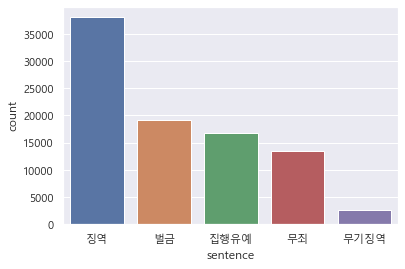

In [26]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
sns.countplot(preData["sentence"], order = preData["sentence"].value_counts().index)
plt.show()

In [109]:
data['crime'].value_counts().nlargest()

유죄    6441
살인    4664
사기    4603
횡령    4584
범죄    4316
Name: crime, dtype: int64

In [110]:
data['crime'] = data['crime'].replace('유죄', None)
data['crime'] = data['crime'].replace('범죄', None)

In [111]:
data['crime'].value_counts().nlargest(30)

사기        5300
횡령        5248
살인        5178
성폭행       4117
폭행        3709
상해        2976
성추행       2555
특정범죄      2287
명예훼손      2248
협박        1554
강도        1476
강간        1363
신용        1355
배임        1001
아동학대       914
탈세         905
위반죄        897
공갈         887
추행         818
방화         747
절도         731
학대         624
특정경제범죄     598
감금         482
뇌물죄        292
사죄         283
성착취        262
성폭력범죄      260
업무방해죄      238
성범죄        223
Name: crime, dtype: int64

C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


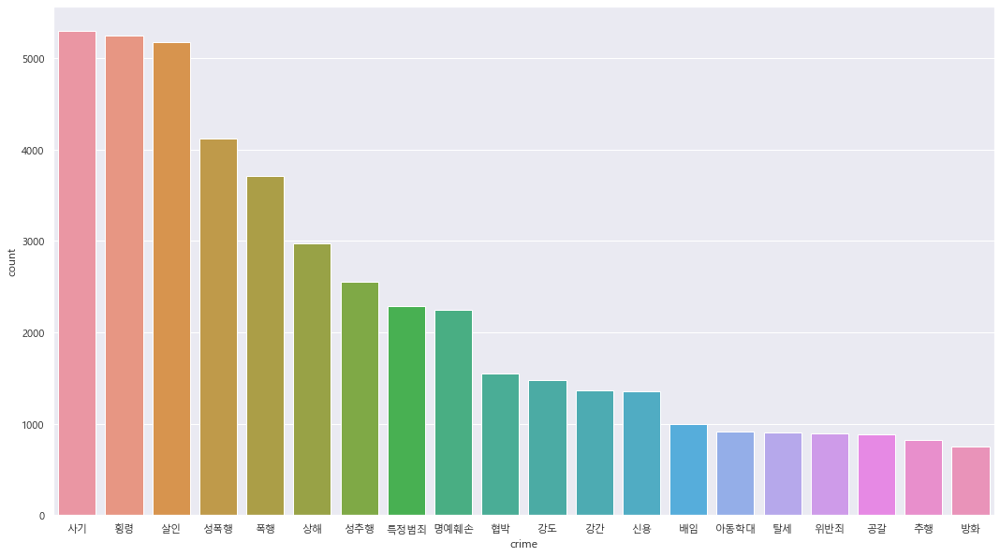

In [114]:
plt.figure(figsize = (18, 10))
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
sns.countplot(data["crime"], order = data["crime"].value_counts().nlargest(20).index)
plt.show()

C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


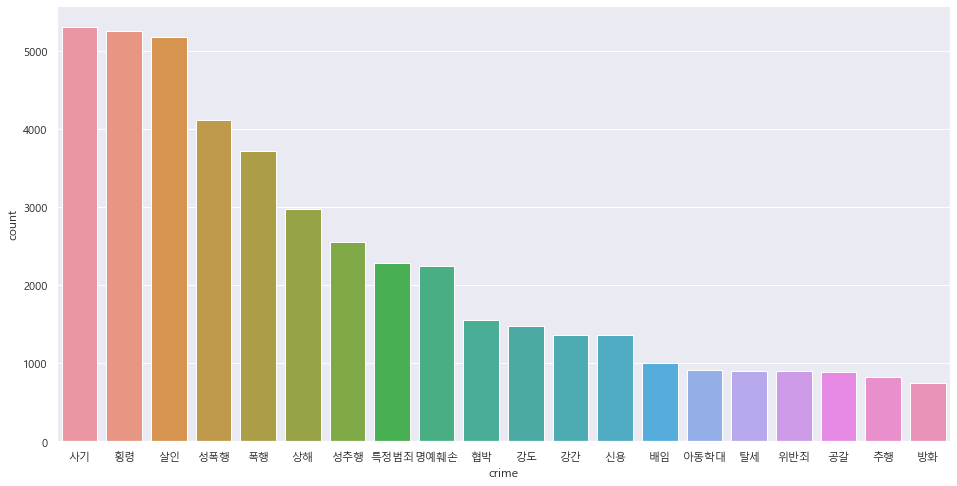

In [329]:
plt.figure(figsize = (16, 8))
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
sns.countplot(data["crime"], order = data["crime"].value_counts().nlargest(20).index)
plt.show()

In [254]:
data.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄/벌금/집행유예,무죄,범죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄/벌금/집행유예,무죄,None


In [271]:
data1 = data.copy()

In [272]:
data2 = data1[data1.crime.isin(['사기'])]
data2.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
9,법대교수다 속이고 조국 사퇴 허위서명 1심 무죄,2020-10-01,직업 교수라 속여 서명운동 참여 업무방해 혐의로 기소 1심 허위서명 가능성 알 수...,무죄,무죄,무죄/벌금/집행유예,무죄,사기
18,서울대 무림사건 고문 당한 피해자들 40년만에 무죄,2020-09-25,서울대 무림사건 영장 없이 경찰에 연행돼 고문 2번째 재심 반공법 위반 재판부...,무죄,무죄,무죄/벌금/집행유예,무죄,사기
19,김기식 셀프후원 2심서 벌금형 상고할것 무죄 주장,2020-09-24,정치자금법 위반 혐의 항소심 선고 공판 1심 형 에서 형 감형 재판부 5000만원 ...,벌금,벌금,무죄/벌금/집행유예,유죄,사기
20,여경 능욕 가해 경찰관 2심서 난 무죄다 태도 돌변,2020-09-24,여경 연락처 알아내 음란문구 덧붙여 유포 고통스러워 하는 피해자 장난감으로 여겨 피...,무죄,무죄,무죄/벌금/집행유예,무죄,사기
23,검찰 수사기밀 유출 혐의 전 법원장 무죄에 불복 항소,2020-09-21,직권남용 권리행사방해 등 혐의 기소 이태종 전 서부지법원장 1심서 검찰 21일 1...,무죄,무죄,무죄/벌금/집행유예,무죄,사기


In [273]:
data3 = data1[data1.crime.isin(['횡령'])]
data3.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
48,교비 유용 혐의 황선혜 전 숙명여대 총장 1심서 무죄,2020-08-29,학교 교비 약 9000만원 유용한 혐의 숙대 전 교수 2차례 고발 1차는 무혐의 재...,무죄,무죄,무죄/벌금/집행유예,무죄,횡령
84,후원금 의혹 장시호 김종 파기환송심 감형 강요 무죄 종합,2020-07-24,기업에 영재센터 후원 강요 혐의 등 대법 일부 협박 아니라며 파기환송 장시호 김...,무죄,무죄,무죄/벌금/집행유예,무죄,횡령
85,무등록 상조 혐의 전직 서울교총 회장들 2심서 무죄,2020-07-24,고수익 보장하며 받은 혐의 인허가 등록 신고 없이 자금 조달 1심 2500만원 ...,무죄,무죄,무죄/벌금/집행유예,무죄,횡령
98,뒷조사 관여 전 국세청 차장 2심도 국고손실 무죄,2020-07-16,김대중 해외 비자금 풍문 추적한 혐의 1심 외부자 기소 적절한지 의문 2심 검사...,무죄,무죄,무죄/벌금/집행유예,무죄,횡령
110,엘엠에스 전 현직 경영진 횡령 무죄 최종 판결 공시,2020-07-10,엘엠에스는 10일 전 현직 경영진이 횡령 혐의 등에 대해 판결을 받았다고 공시했...,무죄,무죄,무죄/벌금/집행유예,무죄,횡령


In [276]:
data4 = data1[data1.crime.isin(['살인'])]
data4.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
46,슬로바키아 기자겨냥 첫 살해 지시 사업가 무죄에 분노,2020-09-04,전 부정 파헤친 와 약혼녀 살해 주도 혐의 지시받았다 총격범 증언에도 증거없다 ...,무죄,무죄,무죄/벌금/집행유예,무죄,살인
69,보험금 95억 노리고 만삭 외국인아내 살해 혐의 무죄,2020-08-10,캄보디아인 만삭 아내 명의의 고액 보험금을 받기 위해 일부러 교통사고를 내 아내를...,무죄,무죄,무죄/벌금/집행유예,무죄,살인
70,삼성 노조와해 이상훈 2심서 무죄 위법한 압수수색 종합,2020-08-10,삼성 노조와해 공작에 기획한 혐의 1심 이상훈 강경훈 각 2심 증거능력 없어 이...,무죄,무죄,무죄/벌금/집행유예,무죄,살인
71,삼성 노조와해 이상훈 전 의장 2심 무죄 증거 위법,2020-08-10,삼성 노조와해 공작에 기획한 혐의 1심 이상훈 강경훈 각 2심 문건 증거능력 없...,무죄,무죄,무죄/벌금/집행유예,무죄,살인
81,태국 유전무죄 비난에 레드불 3세 뺑소니 뒷북 재조사,2020-07-27,자료사진으로 3일 태국의 금수저 중 금수저인 보라유스 요오비디아가 경찰관 살인 뺑...,무죄,무죄,무죄/벌금/집행유예,무죄,살인


In [277]:
data5 = data1[data1.crime.isin(['성폭행'])]
data5.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행
33,교수가 성폭행 무고 사건 대법선 무죄로 뒤집혔다,2020-09-17,지도교수 성폭행 혐의로 고소했다 무고 1 2심 피해자가 보인 태도 아냐 유죄 대법 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행
62,네 성 바꿔 불렀으니 성희롱한거네 학생 성적학대 교사 무죄,2020-08-14,생리로 조퇴하려면 확인증 받아와라 발언도 성적 굴욕감 혐오감 인정하기는 어려워 법...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행
108,무죄로 뒤집혔던 채팅만남 강간 사건 대법서 또 반전,2020-07-13,소개팅앱으로 만나 감금 성폭행 혐의 사건 1심 유죄 2심 피해자 진술 의심돼 대법...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행
113,피해자 진술 오락가락 성폭행 혐의 20대 무죄,2020-07-09,법원 검사가 제출한 증거만으로 입증 어려워 모텔에서 평소 알고 지내던 여성을 성폭행...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행


In [279]:
data6 = data1[data1.crime.isin(['폭행'])]
data6.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
32,긴급조치 위반 고지학순 주교 46년만의 재심서 무죄,2020-09-17,긴급조치 위반으로 구속 유신헌법 무효 라며 양신선언문 법원 긴급조치 위반 위헌 ...,무죄,무죄,무죄/벌금/집행유예,무죄,폭행
35,촬영안돼 이유로 지하철 보안관 폭행 1심 무죄 왜,2020-09-16,촬영 말리는 지하철 직원에 욕설 폭행 법원 촬영 말린 것은 정당 직무 아냐 질서 반...,무죄,무죄,무죄/벌금/집행유예,무죄,폭행
63,유성기업 파업공장 들어간 금속노조 간부 무죄 확정,2020-08-14,유성기업 법률 위반 증거 찾으려 공장 들어가 1 2심 업무 방해하거나 폭력 쓰지 않...,무죄,무죄,무죄/벌금/집행유예,무죄,폭행
91,법원 서행 중 차량 손을 뗄 수 있는 상황이라면 무죄,2020-07-21,불법주차 차량 사진 찍은 60대에 대법원 확정 경북 김천 혁신도시에 있는 대한법률...,무죄,무죄,무죄/벌금/집행유예,무죄,폭행
116,말다툼 촬영 싫다며 손으로 밀쳤다면 폭행아냐 무죄,2020-07-08,자신 촬영하자 손잡아 밀쳐 폭행 혐의 법원 정당행위로 위법성 조각 주차 문제로 다...,무죄,무죄,무죄/벌금/집행유예,무죄,폭행


In [281]:
data7 = data1[data1.crime.isin(['상해'])]
data7.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
8,뇌전증 의한 일시적 기억소실로 뺑소니 1심 무죄,2020-10-05,도로교통법 위반 혐의 등 1심 교통사고처리특례법 위반 공소기각 뇌전증의한 의식소실...,무죄,무죄,무죄/벌금/집행유예,무죄,상해
105,갑질 의혹 이명희 상해 혐의 일부 무죄 1심 집행유예,2020-07-14,경비원 운전기사 상습 폭행 폭언 혐의 검 구형 추가고소 영향 집유 사회봉사...,무죄,무죄,무죄/벌금/집행유예,무죄,상해
106,나도 속았다 보이스피싱 피해금 인출 전달한 40대 무죄,2020-07-13,법원 보이스피싱 가담 미필적 인식 없었다 보이스피싱 전화금융사기 일당에 속아 자신의...,무죄,무죄,무죄/벌금/집행유예,무죄,상해
121,피해자 반신마비인데 가해자 무죄 체면 구긴 제주지검,2020-07-06,피해자는 있지만 가해자는 없는 상황 이 자주 발생 검찰의 무성의한 공소유지 때문 ...,무죄,무죄,무죄/벌금/집행유예,무죄,상해
180,강간범 혀 절단은 정당방위 이미 무죄 판례 있다,2020-05-07,성폭력 저항하며 가해자 혀 깨물어 중상해죄 인정돼 수사과정에 옥살이 하기도 억울함...,무죄,무죄,무죄/벌금/집행유예,무죄,상해


In [282]:
data8 = data1[data1.crime.isin(['성추행'])]
data8.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
11,서지현 인사 불이익 혐의 안태근 파기환송심도 무죄 종합,2020-09-29,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
12,서지현 인사 불이익 혐의 안태근 파기환송심도 무죄,2020-09-29,서지현 인사에 불이익 준 혐의 1심 인사상 불이익 2심 엄벌 불가피해 항소기각 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
14,서지현 인사 불이익 안태근 4번째 선고 대법선 무죄,2020-09-29,서지현 인사에 불이익 준 혐의 1심 인사상 불이익 2심 엄벌 불가피해 항소기각 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행


In [283]:
data9 = data1[data1.crime.isin(['특정범죄'])]
data9.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
92,법대로 시동 꺼진채 100m 후진한 차 교통사고 무죄,2020-07-18,시동 꺼진 차 내리막길에서 미끄러져 택시 충돌 검찰 제동등 반복적으로 꺼졌다 켜져 ...,무죄,무죄,무죄/벌금/집행유예,무죄,특정범죄
154,김수영 양천구청장 배우자 무죄로 의혹 해소 구정에 전념,2020-06-05,김수영 구청장 주변까지 엄격하게 단속할 것 코로나19 방역 및 일자리 대책에 앞장설...,무죄,무죄,무죄/벌금/집행유예,무죄,특정범죄
155,전 양천구청장 3천만원 수수 무죄 법원 청탁 아냐 종합,2020-06-05,지역사업가에 3000만원 받은 혐의 법원 알선수재 혐의 알기 어려워 사업가가 보험금...,무죄,무죄,무죄/벌금/집행유예,무죄,특정범죄
156,이제학 전 양천구청장 알선수재 무죄 법원 증거부족,2020-06-05,지역사업가에 3000만원 받은 혐의 법원 알선수재 혐의 알기 어려워 결심공판 때 검...,무죄,무죄,무죄/벌금/집행유예,무죄,특정범죄
186,버닝썬 경찰총장 1심 무죄 법원 검찰 비위입증 못해 종합2보,2020-04-24,주식 받고 수사 무마해준 혐의로 기소 검찰 에 700만원 구형 법원 사건 영향 ...,무죄,무죄,무죄/벌금/집행유예,무죄,특정범죄


C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  

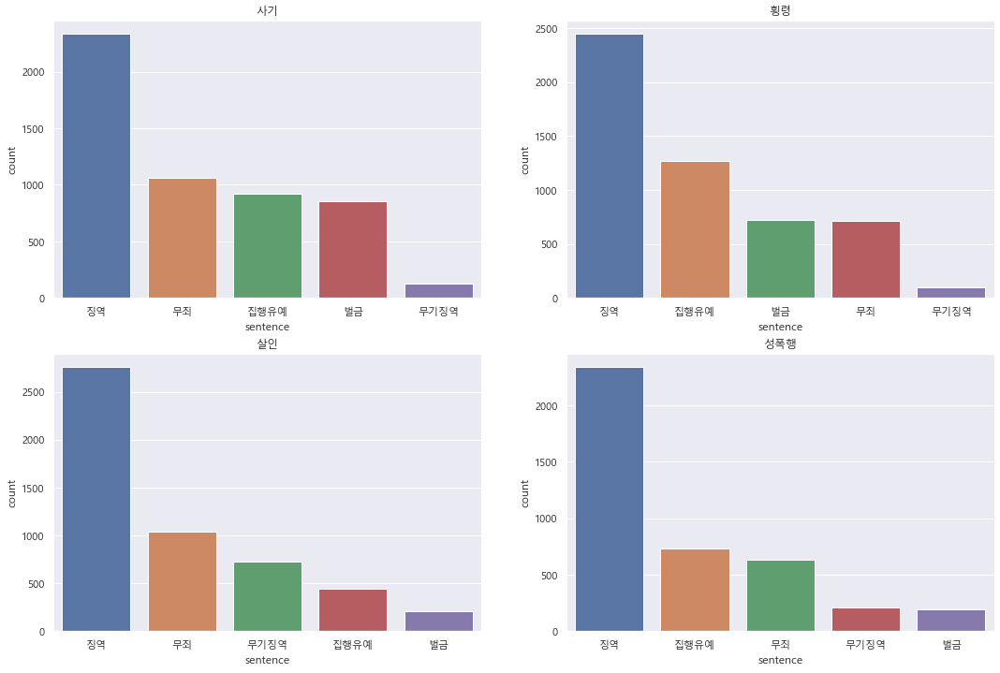

In [319]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
plt.figure(figsize = (18, 12))
plt.subplot(2, 2, 1)
plt.gca().set_title('사기')
sns.countplot(data2["sentence"], order = data2["sentence"].value_counts().index)
plt.subplot(2, 2, 2)
plt.gca().set_title('횡령')
sns.countplot(data3['sentence'], order = data3['sentence'].value_counts().index)
plt.subplot(2, 2, 3)
plt.gca().set_title('살인')
sns.countplot(data4['sentence'], order = data4['sentence'].value_counts().index)
plt.subplot(2, 2, 4)
plt.gca().set_title('성폭행')
sns.countplot(data5['sentence'], order = data5['sentence'].value_counts().index)

plt.show()

C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  

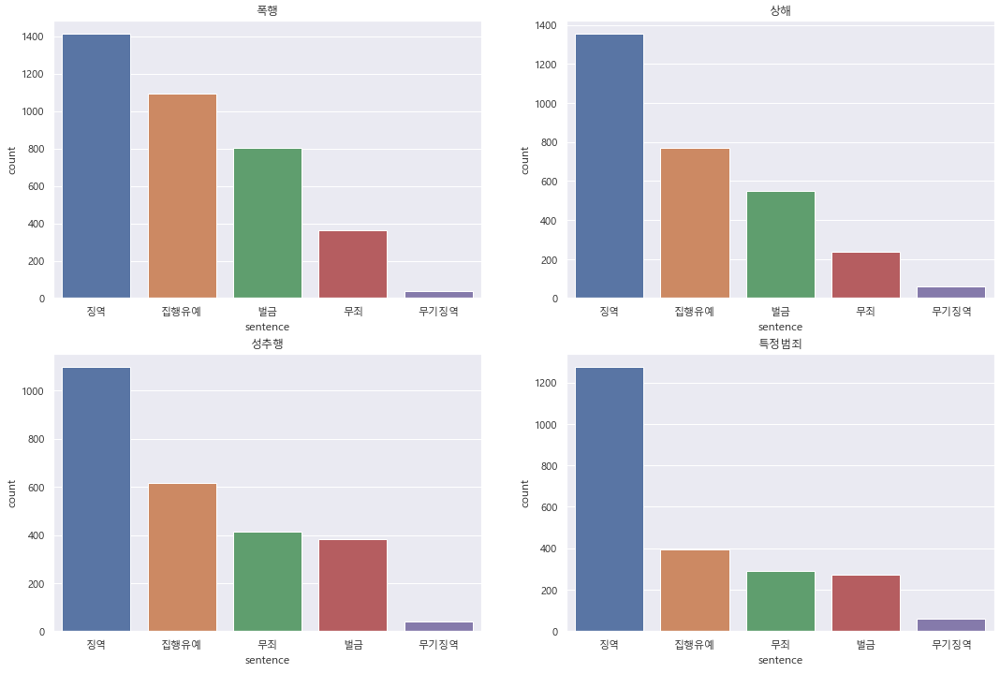

In [320]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
plt.figure(figsize = (18, 12))
plt.subplot(2, 2, 1)
plt.gca().set_title('폭행')
sns.countplot(data6["sentence"], order = data6["sentence"].value_counts().index)
plt.subplot(2, 2, 2)
plt.gca().set_title('상해')
sns.countplot(data7['sentence'], order = data7['sentence'].value_counts().index)
plt.subplot(2, 2, 3)
plt.gca().set_title('성추행')
sns.countplot(data8['sentence'], order = data8['sentence'].value_counts().index)
plt.subplot(2, 2, 4)
plt.gca().set_title('특정범죄')
sns.countplot(data9['sentence'], order = data9['sentence'].value_counts().index)
plt.show()

In [353]:
data1.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄/벌금/집행유예,무죄,범죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄/벌금/집행유예,무죄,None


In [355]:
df1 = data1[data1.sentence.isin(['징역'])]
df1.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
3958,검찰 음주운전 종근당 장남 항소심서 징역 2년 구형,2020-10-08,음주운전 혐의 차에서 졸다 적발 1심 재범 않겠다 다짐 검찰 선처하면 또 음주운전...,징역,2년,징역/무기징역,유죄,협박
3959,거짓말로 인천에 코로나 퍼뜨린 학원강사 징역 6월,2020-10-08,서울 용산구 이태원의 클럽에 갔다가 신종 코로나바이러스 감염증 코로나19 양성 확...,징역,6월,징역/무기징역,유죄,사죄
3960,음주 후 사고 친다고 나무라자 집에 불 지른 50대 징역형,2020-10-08,대구지방법원 전경 동거인이 술을 마시고 사고 친다고 나무라자 이에 격분해 집에 불...,징역,1년6개월,징역/무기징역,유죄,방화
3962,검찰 하나은행 채용 의혹 인사담당자들 징역형 구형,2020-10-07,전 부장 2명에 실형 팀장 2명 형 집유 고위급 추천 특정대학 출신 부정채용 혐의 ...,징역,1년6개월,징역/무기징역,유죄,사기
3963,상대후보 허위사실 유포 혐의 이인기 전의원 징역2년 구형,2020-10-07,검찰 공직선거법 위반 혐의 적용 30일 선고 이인기 전 국회의원 지난 국회의원 선거...,징역,2년,징역/무기징역,유죄,None


C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


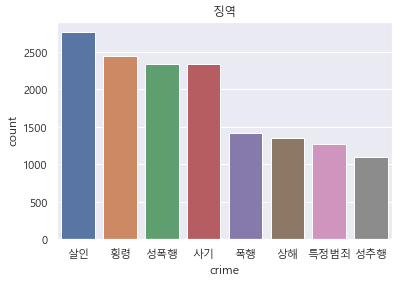

In [358]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
plt.gca().set_title('징역')
sns.countplot(df1["crime"], order = df1["crime"].value_counts().nlargest(10).index)
plt.show()

In [360]:
df2 = data1[data1.sentence.isin(['무죄'])]
df2.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄/벌금/집행유예,무죄,범죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄/벌금/집행유예,무죄,None


C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


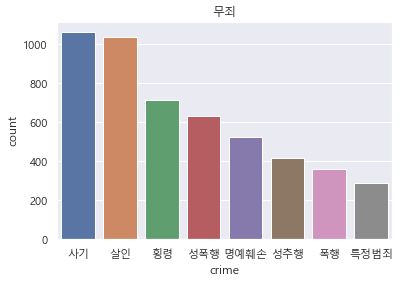

In [364]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
plt.gca().set_title('무죄')
sns.countplot(df2["crime"], order = df2["crime"].value_counts().nlargest(8).index)
plt.show()

In [367]:
df3 = data1[data1.sentence.isin(['집행유예'])]
df3.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
111,집회서 태극기 훼손 2심도 집행유예 국기모독은 무죄,2020-07-10,집회서 태극기 태운 혐의 등 1심 모욕 목적 아냐 집유 2심 증명 안돼 항소 기각 ...,집행유예,집행유예,무죄/벌금/집행유예,유죄,None
599,속보 세월호 조사 방해 이병기 조윤선 집행유예 안종범 무죄,2019-06-25,왼쪽부터 차례대로 안종범 전 경제수석 조윤선 전 정무수석 이병기 전 비서실장 사진...,집행유예,집행유예,무죄/벌금/집행유예,유죄,None
725,금고지기 이영배 2심도 집행유예 배임은 무죄,2019-02-14,인척에게 허위 급여 지급한 혐의 1 2심 에 선고 검찰은 1심 이어 2심도 ...,집행유예,집행유예,무죄/벌금/집행유예,유죄,횡령
1090,이재용 1년만에 집행유예 석방 2심서 혐의 대부분 무죄,2018-02-05,이재용 삼성전자 부회장이 항소심 선고 재판에 출석하기 위해 5일 서울 서초동 서울...,집행유예,집행유예,무죄/벌금/집행유예,유죄,None
1994,중국서 금괴 564 밀수 50대 항소심도 집행유예 벌금 245억,2020-10-04,금괴 원 상당의 금괴를 중국에서 몰래 들여온 뒤 시중에 유통한 50대가 항소심에서도...,집행유예,집행유예,무죄/벌금/집행유예,유죄,상해


In [366]:
df4 = data1[data1.sentence.isin(['벌금'])]
df4.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
19,김기식 셀프후원 2심서 벌금형 상고할것 무죄 주장,2020-09-24,정치자금법 위반 혐의 항소심 선고 공판 1심 형 에서 형 감형 재판부 5000만원 ...,벌금,벌금,무죄/벌금/집행유예,유죄,사기
27,회식때 도우미 불러 폭로해 벌금형 2심서 무죄 주장,2020-09-18,1심 판결에서도 중요한 내용 다수 사실로 인정 서 산 경험 탓 가라오케 룸살롱 구...,벌금,벌금,무죄/벌금/집행유예,유죄,명예훼손
271,최태원 동거인 비방 악플러 2심도 벌금형 일부 무죄,2020-02-11,150만원 선고 1심과 금액은 동일 2심 일부 사실오인 주장은 이유있어 최태원 그...,벌금,벌금,무죄/벌금/집행유예,유죄,명예훼손
373,교비로 소송 세종대 전 총장 1심 벌금형 일부 무죄,2019-12-13,교직원 해임무효 소송 등 민 형사에 교비 사용 사학법에 따른 지출 횡령 아니다 주...,벌금,벌금,무죄/벌금/집행유예,유죄,횡령
383,여직원 성추행해 벌금형 받은 공단 간부 2심서 무죄,2019-12-11,노래방에서 부하 여직원을 성추행했다가 1심에서 형을 선고받았던 울주군시설관리공단 ...,벌금,벌금,무죄/벌금/집행유예,유죄,성추행


In [365]:
df5 = data1[data1.sentence.isin(['무기징역'])]
df5.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
103,속보 고유정 2심도 무기징역 의붓아들 살해혐의는 무죄,2020-07-15,신상공개가 결정된 전 남편 살해 피의자 고유정 36 여 이 7일 오후 제주 동부경...,무기징역,무기징역,징역/무기징역,유죄,None
1735,상주 농약사이다 검 무기징역 구형 변호인단 무죄 주장,2016-04-26,농약이 섞인 사이다를 마시고 할머니 2명이 숨지고 4명이 중태에 빠진 경북 상주 ...,무기징역,무기징역,징역/무기징역,유죄,살인
3967,주거침입후 성추행 범죄땐 최대 무기징역 헌재 합헌,2020-10-07,주거침입 준강제추행죄 관련 헌법소원 헌재 피해 심각 강간죄와 차이 없어 유남석 헌법...,무기징역,무기징역,징역/무기징역,유죄,강간
3983,터키 카슈끄지 암살 사우디 영사관 직원에 무기징역 구형,2020-09-29,사진은 바레인 마나마의 한 컨퍼런스에서 발언 중인 자말 카슈끄지의 모습 터키 ...,무기징역,무기징역,징역/무기징역,유죄,상해
3986,무기징역 김다운 1심 돌아가 국민참여재판받나,2020-09-27,당시 변호인 재판부가 추가기소건에 국참 의사 묻지 않아 청담동 주식 부자로 불렸던 ...,무기징역,무기징역,징역/무기징역,유죄,강도


C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


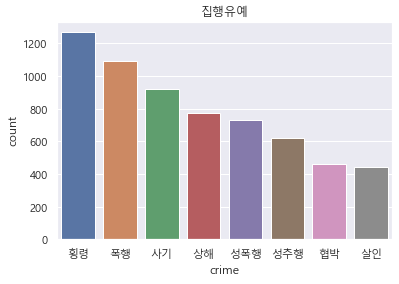

In [368]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
plt.gca().set_title('집행유예')
sns.countplot(df3["crime"], order = df3["crime"].value_counts().nlargest(8).index)
plt.show()

C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


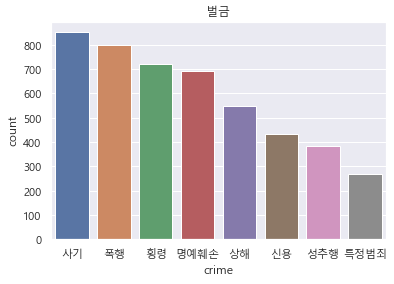

In [369]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
plt.gca().set_title('벌금')
sns.countplot(df4["crime"], order = df4["crime"].value_counts().nlargest(8).index)
plt.show()

C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


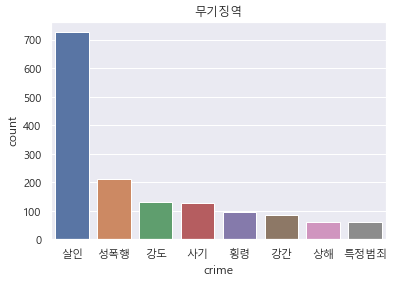

In [370]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
plt.gca().set_title('무기징역')
sns.countplot(df5["crime"], order = df5["crime"].value_counts().nlargest(8).index)
plt.show()

In [288]:
data2['sentence'].value_counts().index

Index(['징역', '무죄', '집행유예', '벌금', '무기징역'], dtype='object')

In [289]:
data2['sentence'].value_counts()

징역      2334
무죄      1063
집행유예     924
벌금       852
무기징역     127
Name: sentence, dtype: int64

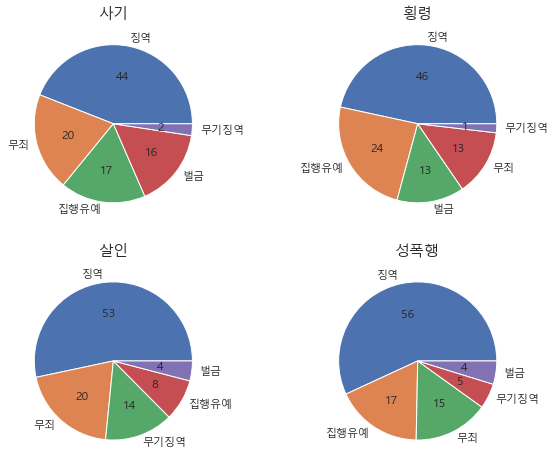

In [306]:
plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.pie(data2['sentence'].value_counts(), labels=data2['sentence'].value_counts().index, autopct='%d')
plt.title('사기', fontsize=15)
plt.subplot(2, 2, 2)
plt.pie(data3['sentence'].value_counts(), labels=data3['sentence'].value_counts().index, autopct='%d')
plt.title('횡령', fontsize=15)
plt.subplot(2, 2, 3)
plt.pie(data4['sentence'].value_counts(), labels=data4['sentence'].value_counts().index, autopct='%d')
plt.title('살인', fontsize=15)
plt.subplot(2, 2, 4)
plt.pie(data5['sentence'].value_counts(), labels=data5['sentence'].value_counts().index, autopct='%d')
plt.title('성폭행', fontsize=15)
plt.show()

In [155]:
# 특정 범죄 기사 개수 feature 추가해서 data frame 리턴
def CountCrime(crimeName, df):
    count = []
    for crime in df['crime']:
        if crime == crimeName:
            count.append(1)
        else:
            count.append(0)
    df[crimeName] = count
    return df

In [170]:
tmp = data.copy()
crimeList = tmp['crime'].value_counts().nlargest(20)
crimeList = crimeList.index
crimeList

Index(['사기', '횡령', '살인', '성폭행', '폭행', '상해', '성추행', '특정범죄', '명예훼손', '협박', '강도',
       '강간', '신용', '배임', '아동학대', '탈세', '위반죄', '공갈', '추행', '방화'],
      dtype='object')

In [173]:
tmp.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime,사기,횡령,...,강도,강간,신용,배임,아동학대,탈세,위반죄,공갈,추행,방화
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄/벌금/집행유예,무죄,범죄,0,0,...,0,0,0,0,0,0,0,0,0,0
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행,0,0,...,0,0,0,0,0,0,0,0,0,0
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행,0,0,...,0,0,0,0,0,0,0,0,0,0
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄/벌금/집행유예,무죄,None,0,0,...,0,0,0,0,0,0,0,0,0,0


In [178]:
tmp['datetime'] = tmp['date'].apply(lambda x: pd.to_datetime(str(x), format = '%Y-%m-%d'))

In [180]:
tmp.set_index(tmp['datetime'], inplace = True, drop = True)
tmp.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime,사기,횡령,...,강간,신용,배임,아동학대,탈세,위반죄,공갈,추행,방화,datetime
datetime,,,,,,,,,,,,,,,,,,,,,
2020-10-08,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄/벌금/집행유예,무죄,범죄,0,0,...,0,0,0,0,0,0,0,0,0,2020-10-08
2020-10-08,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행,0,0,...,0,0,0,0,0,0,0,0,0,2020-10-08
2020-10-08,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행,0,0,...,0,0,0,0,0,0,0,0,0,2020-10-08
2020-10-07,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행,0,0,...,0,0,0,0,0,0,0,0,0,2020-10-07
2020-10-07,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄/벌금/집행유예,무죄,None,0,0,...,0,0,0,0,0,0,0,0,0,2020-10-07


In [193]:
ohlc_dict = {'사기':np.sum}
weekly_df = tmp.resample('M').agg(ohlc_dict).fillna(0)

In [194]:
weekly_df

,사기
datetime,
1970-01-31,0
1970-02-28,0
1970-03-31,0
1970-04-30,0
1970-05-31,0
...,...
2020-07-31,35
2020-08-31,30
2020-09-30,55


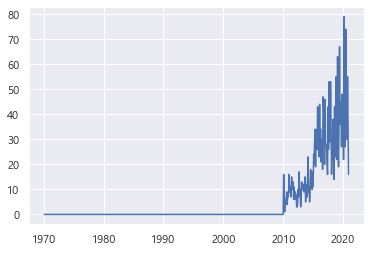

In [186]:
plt.plot(weekly_df)
plt.show()

In [191]:
for i, j in enumerate(weekly_df['사기']):
    if j != 0:
        print(i)
        break
        

480


In [196]:
weekly_df = weekly_df.iloc[480:, :]

In [198]:
w = weekly_df.copy()
w

,사기
datetime,
2010-01-31,16
2010-02-28,10
2010-03-31,1
2010-04-30,5
2010-05-31,6
...,...
2020-07-31,35
2020-08-31,30
2020-09-30,55


In [240]:
tmp.to_excel('preprocessing.xlsx')

# 범죄 유형별 워드 클라우드

In [242]:
data.head()

,title,date,text,sentence,sentence2,sentence3,sentence4,crime
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄/벌금/집행유예,무죄,범죄
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예,무죄,성폭행
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예,무죄,성추행
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄/벌금/집행유예,무죄,None


In [246]:
tmp = data.copy()
crimeList = tmp['crime'].value_counts().nlargest(20)
crimeList = crimeList.index
crimeList

Index(['사기', '횡령', '살인', '성폭행', '폭행', '상해', '성추행', '특정범죄', '명예훼손', '협박', '강도',
       '강간', '신용', '배임', '아동학대', '탈세', '위반죄', '공갈', '추행', '방화'],
      dtype='object')

In [244]:
hanTokenText = preData['Hannanum']
crimes = data['crime']

(-0.5, 799.5, 599.5, -0.5)

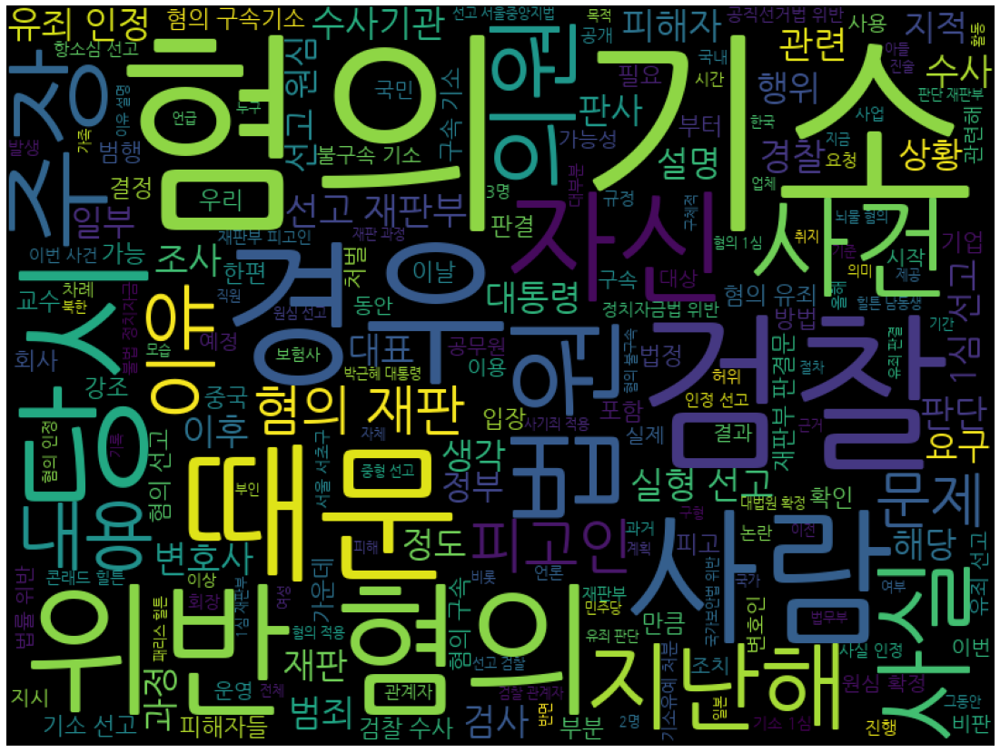

In [245]:
tmpList = [text for crime, text in zip(crimes, hanTokenText) if crime == "사기"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

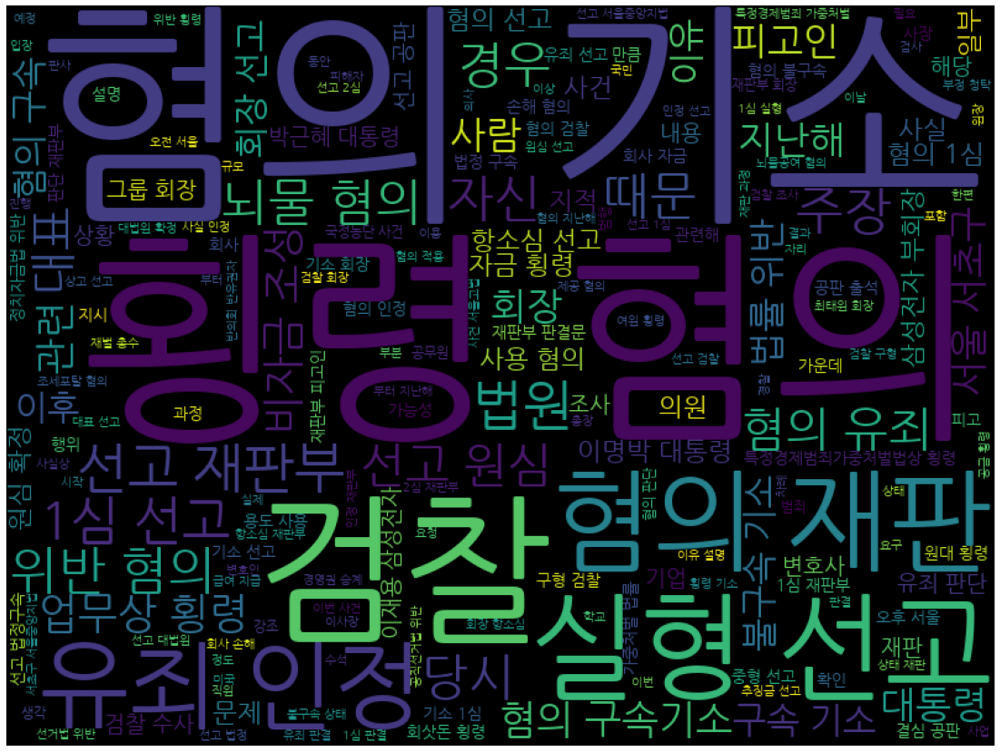

In [247]:
tmpList = [text for crime, text in zip(crimes, hanTokenText) if crime == "횡령"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

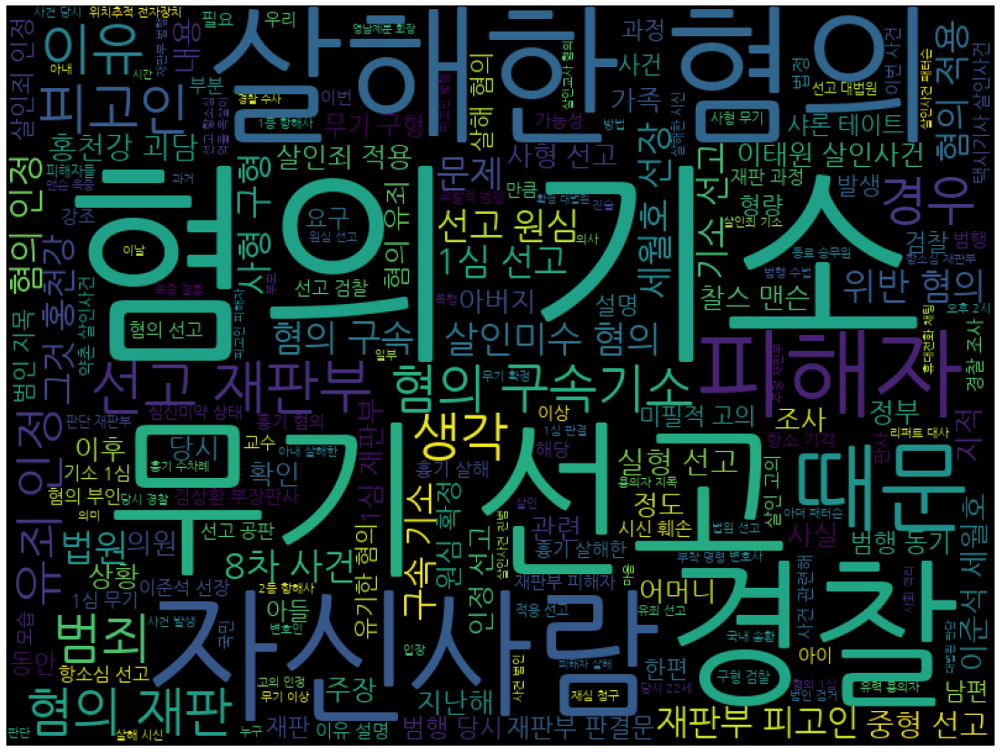

In [249]:
tmpList = [text for crime, text in zip(crimes, hanTokenText) if crime == "살인"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

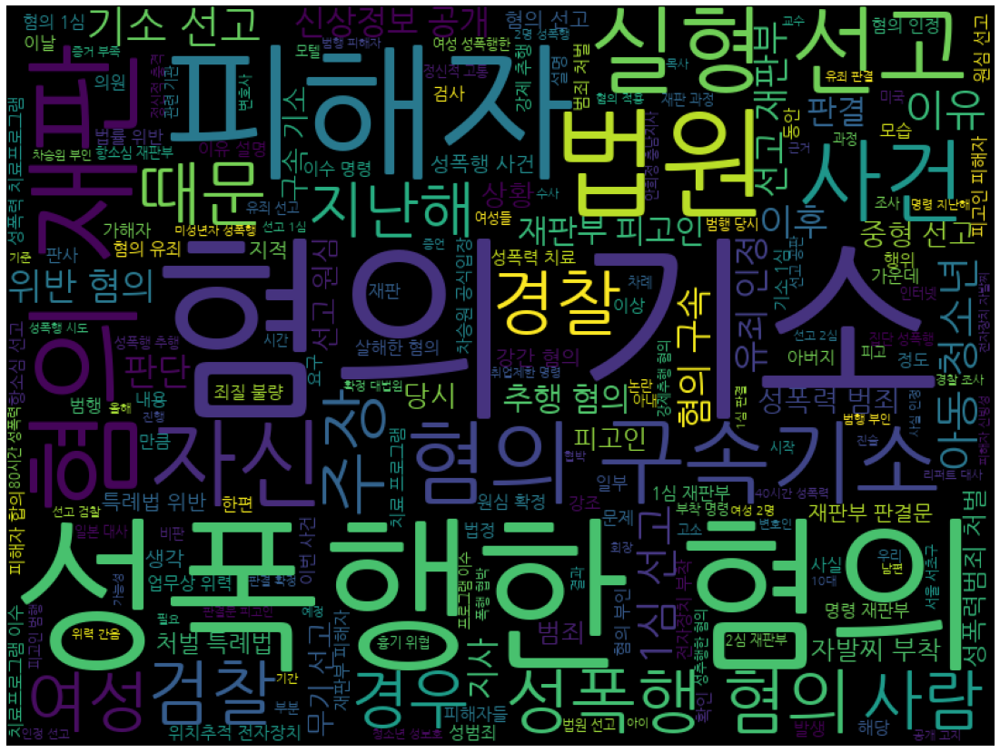

In [250]:
tmpList = [text for crime, text in zip(crimes, hanTokenText) if crime == "성폭행"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

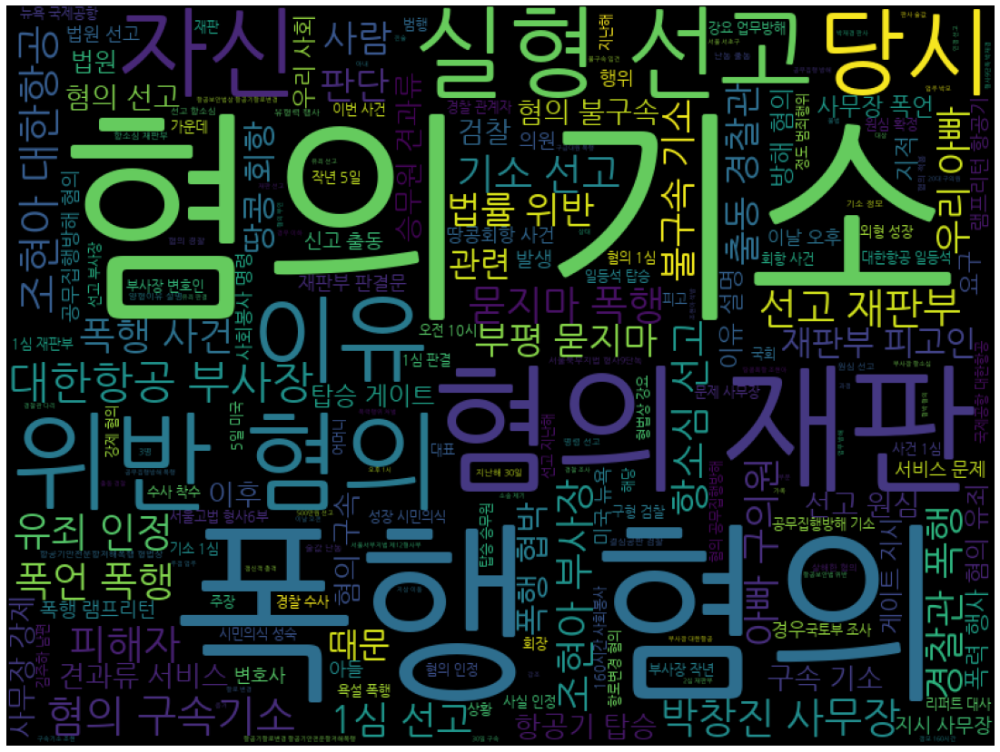

In [251]:
tmpList = [text for crime, text in zip(crimes, hanTokenText) if crime == "폭행"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

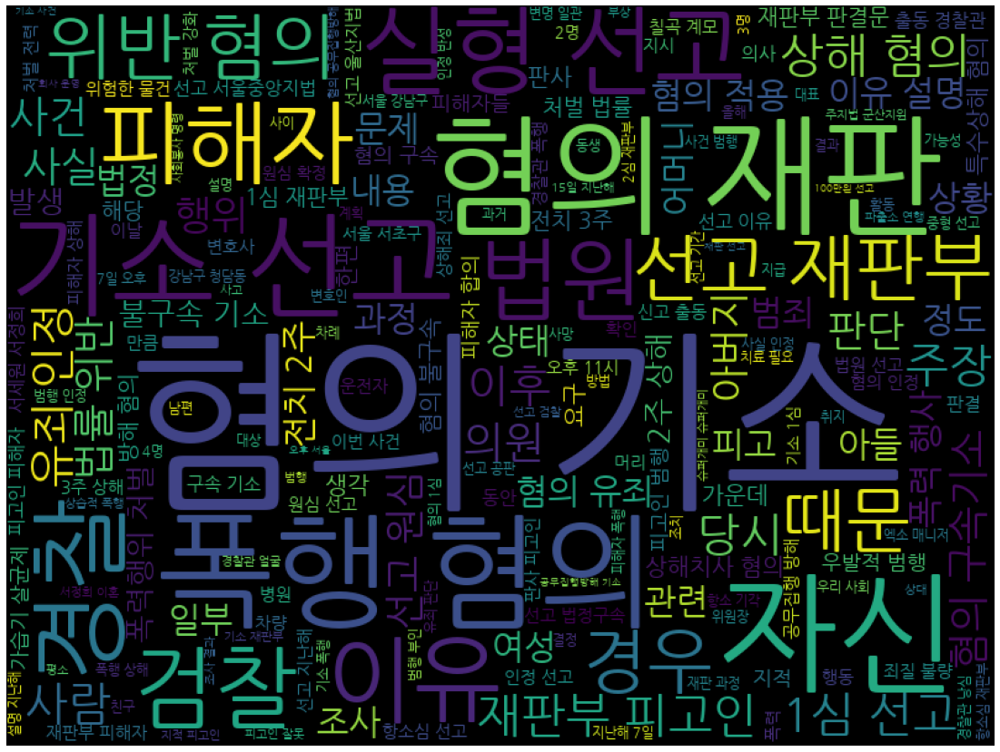

In [252]:
tmpList = [text for crime, text in zip(crimes, hanTokenText) if crime == "상해"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

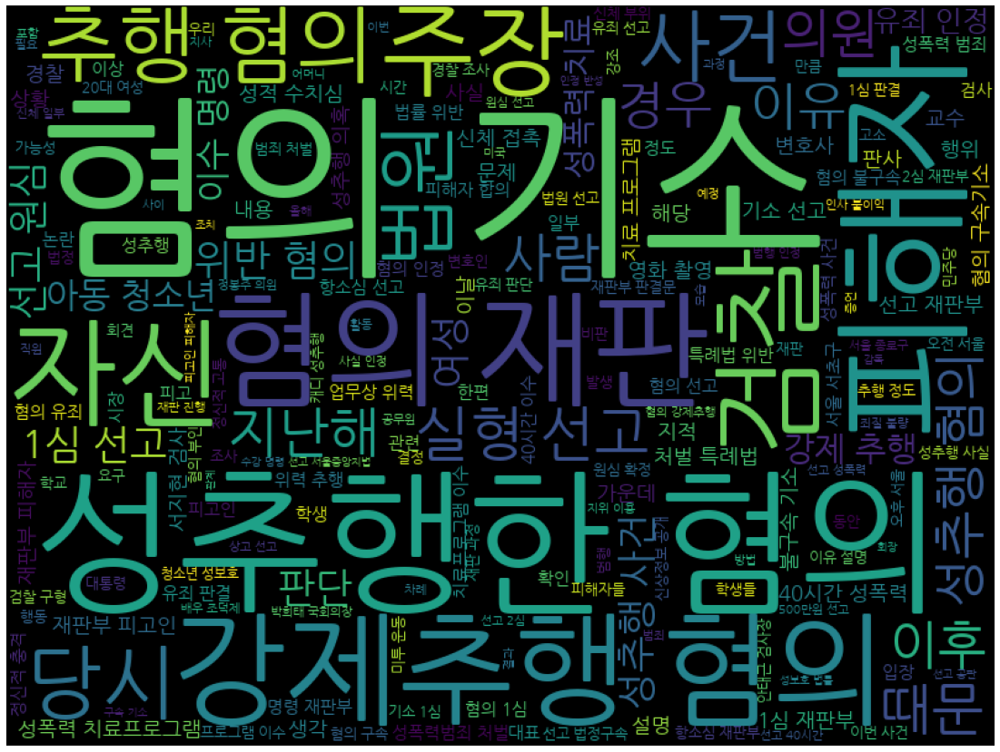

In [253]:
tmpList = [text for crime, text in zip(crimes, hanTokenText) if crime == "성추행"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

# wordcloud: 징역

In [29]:
sentences = preData['sentence']

(-0.5, 799.5, 599.5, -0.5)

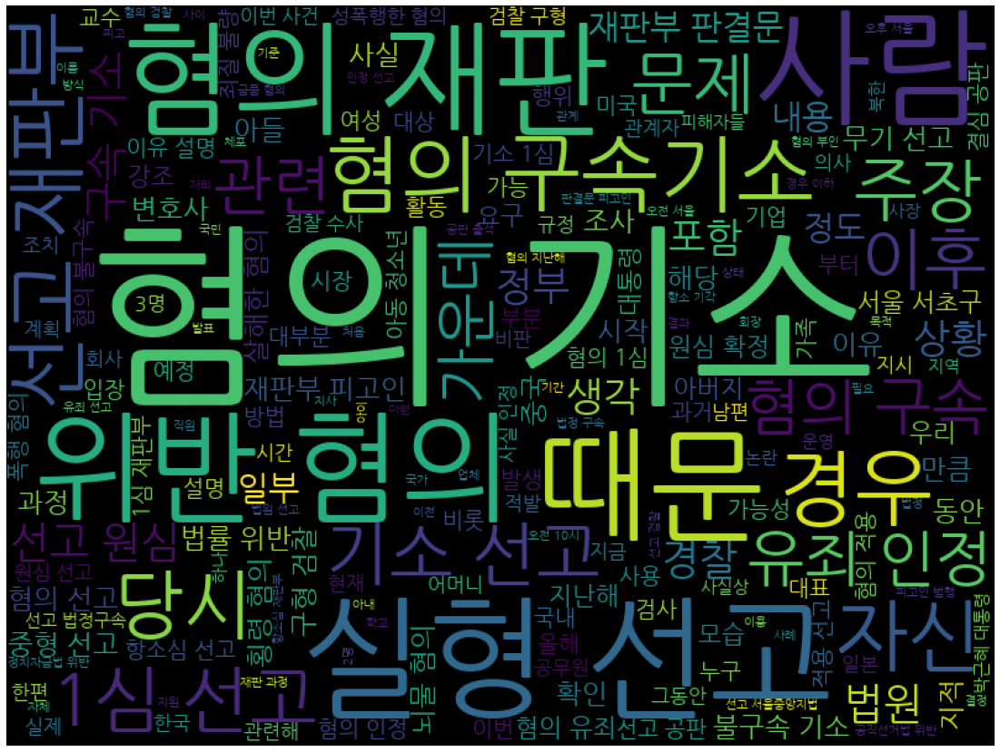

In [34]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "징역"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

# wordcloud: 벌금

(-0.5, 799.5, 599.5, -0.5)

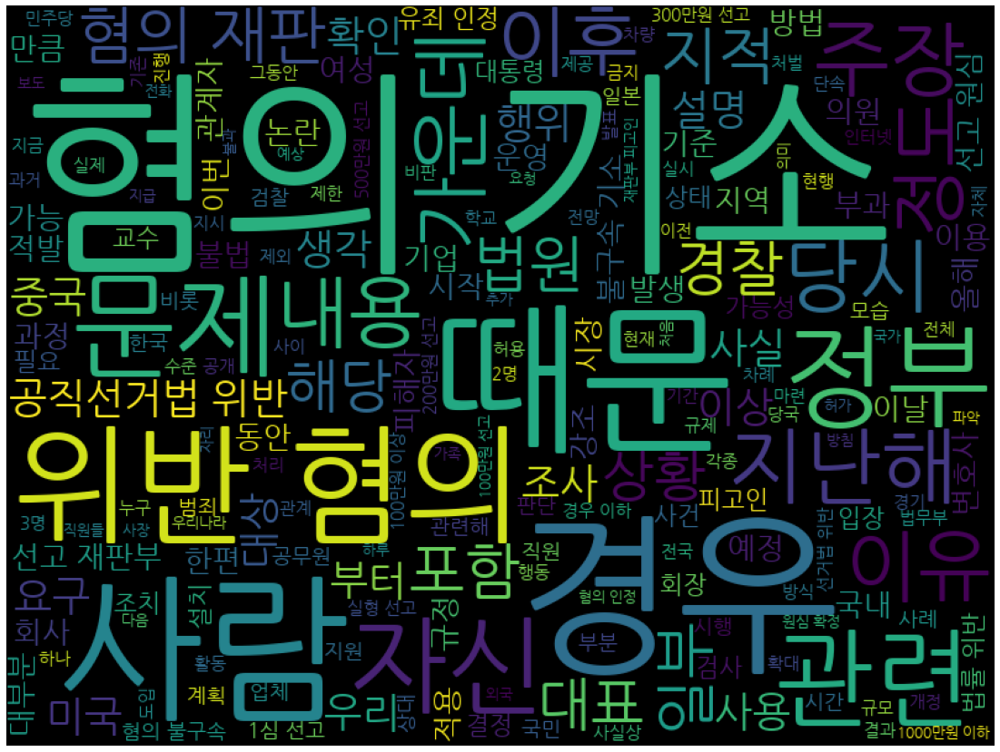

In [35]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "벌금"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

# wordcloud: 무죄

(-0.5, 799.5, 599.5, -0.5)

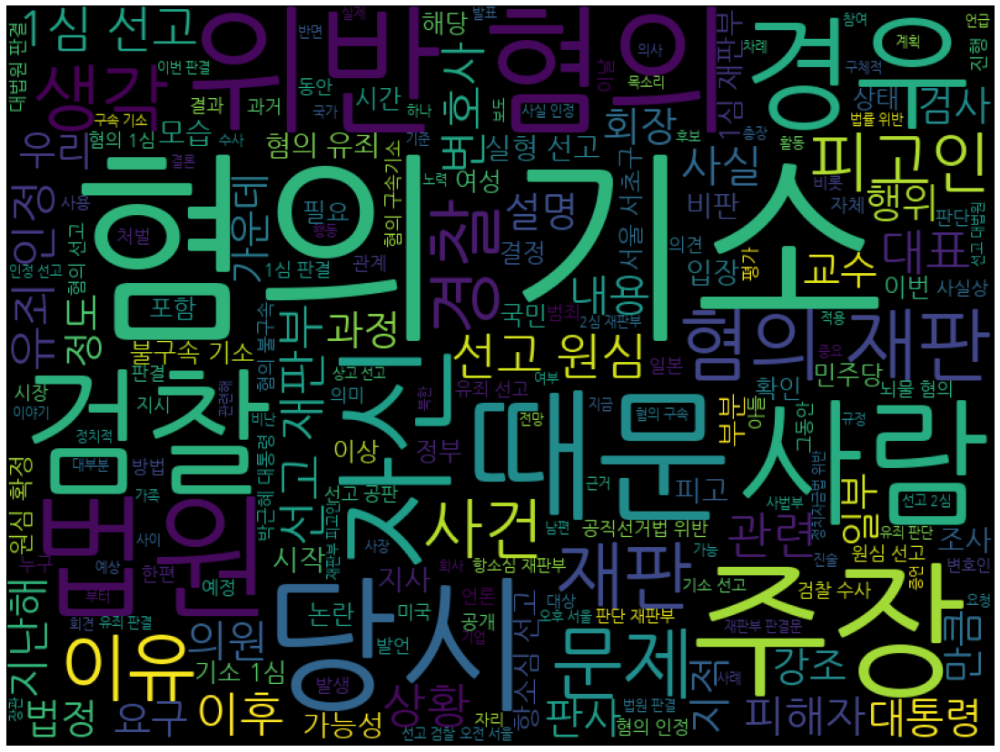

In [36]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "무죄"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

# wordcloud: 집행유예

(-0.5, 799.5, 599.5, -0.5)

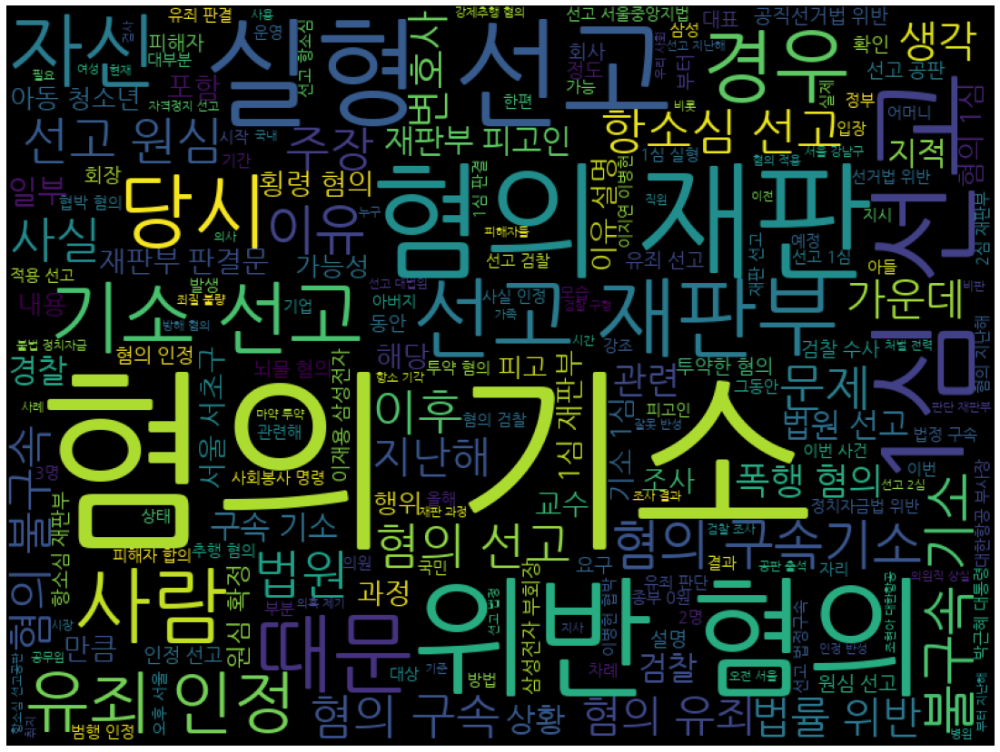

In [37]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "집행유예"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

# wordcloud: 무기징역

(-0.5, 799.5, 599.5, -0.5)

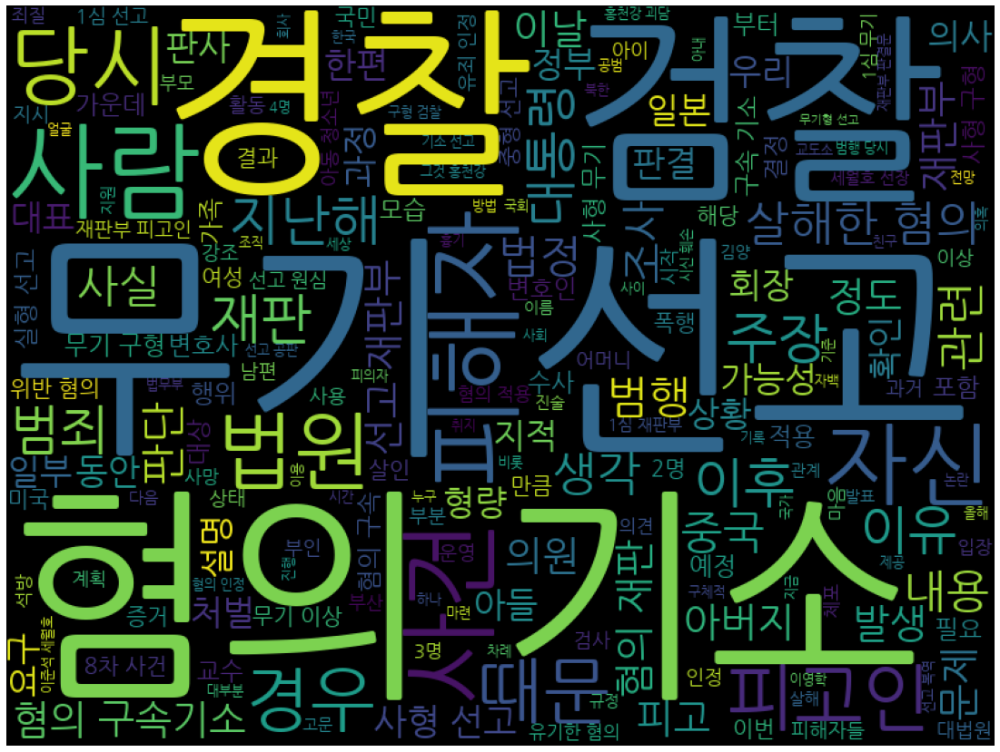

In [38]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "무기징역"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

# y값 변환

# 0: 무죄  1: 벌금  2: 집행유예  3: 징역  4: 무기징역

In [15]:
sentenceNews = preData['sentence']
y = []
for sentence in list(sentenceNews):
    if sentence == '무죄':
        y.append(0)
    elif sentence == '벌금':
        y.append(1)
    elif sentence == '집행유예':
        y.append(2)
    elif sentence == '징역':
        y.append(3)
    else:
        y.append(4)
preData['y'] = y
preData.head()

,title,date,text,sentence,sentence2,y
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌 ...,무죄,무죄,0
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 후...,무죄,무죄,0
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은행...,무죄,무죄,0
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 징역 2심 항소기각 대법...,무죄,무죄,0
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 서울...,무죄,무죄,0


In [16]:
preData.to_excel("preprocessing_data_af_rm_kw.xlsx")

# text preprocess

In [60]:
def TextPreprocess2(textNews):
    textList = textNews.copy()
    for idx, text in enumerate(textList):
        try:
            text = re.sub("무기", '', str(text))
            text = re.sub("혐의", '', text)   
            text = re.sub("기소", '', text)                                   
            text = re.sub("선고", '', text)
            text = re.sub("때문", '', text)
            text = re.sub("당시", '', text)
            text = re.sub('유죄', '', text)
            text = re.sub('재판', '', text)
            text = re.sub('지난해', '', text)
            text = re.sub('인정', '', text)
            text = re.sub('경우', '', text)
            text = re.sub('가운데', '', text)
            text = re.sub('실형', '', text)
            text = re.sub('정도', '', text)
            text = re.sub('구속', '', text)
            text = re.sub('정도', '', text)
            text = re.sub('선고', '', text)
            text = re.sub('이후', '', text)
            text = re.sub('실제', '', text)
            text = re.sub('일부', '', text)
            text = re.sub('모습', '', text)
            text = re.sub('사람', '', text)
            text = re.sub('관련', '', text)
            text = re.sub('문제', '', text)
            text = re.sub('자신', '', text)
            text = re.sub('과정', '', text)
            text = re.sub('부터', '', text)
            textList[idx] = re.sub("사실", '', text)                                    
        except TypeError as error:
            print(error)
        
    return textList

In [43]:
preData = pd.read_excel('preprocessing_data_af_rm_kw.xlsx', index_col = 0)
preText = preData['text']

In [61]:
preText2 = TextPreprocess2(preText)

In [62]:
preData2 = preData.copy()
preData2['text'] = preText2

In [63]:
preData2.to_excel('preprocessing_data_af_rm_kw2.xlsx')

In [64]:
hannanum = Hannanum()
hanTokenText = []
for text in tqdm(preData2['text'], total = len(preData2['text'])):
    token = hannanum.nouns(str(text))
    hanTokenText.append(' '.join(token))

100%|██████████| 90141/90141 [1:30:31<00:00, 16.60it/s]  


In [65]:
dfToken = pd.DataFrame(np.array(hanTokenText).T, columns = ['Hannanum'])
dfToken.to_excel('tokenization2.xlsx')
dfToken.head()

,Hannanum
0,대법원 문건 무단 유출 등 1심 증거 범죄고의 검찰 1심 임종헌 번복 술 수용 대법...
1,검찰 내 나 폭 검찰 세상 고통 후배 검사 성추행 인사 불이익 로 안태근 전 법무부...
2,회식 후 술 정규직 여직원 성폭행한 로 30대 전 은행원 대법원 을 확정 대법원 3...
3,직권남용 서지현 인사 불이익 1심 인사 불이익 2심 항소기각 대법 취지 환송 파기환...
4,1심 판결 후 항소심 등 윤한홍 국민의힘 의원 7일 오후 서울 여의 국회 법제사법위...


(-0.5, 799.5, 599.5, -0.5)

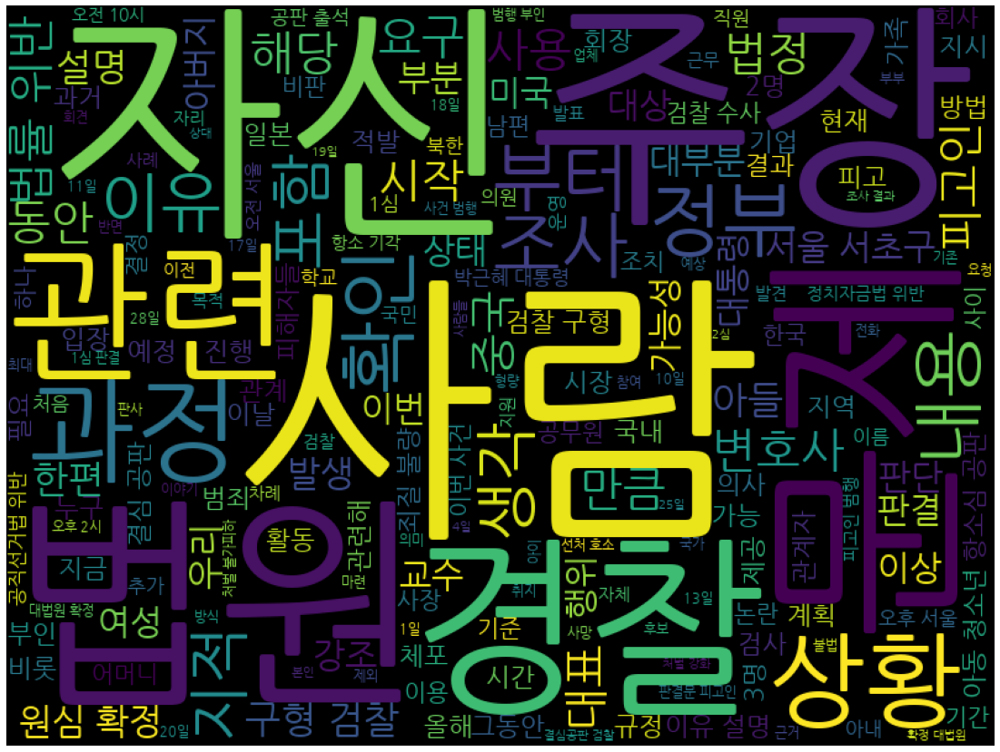

In [55]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "징역"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

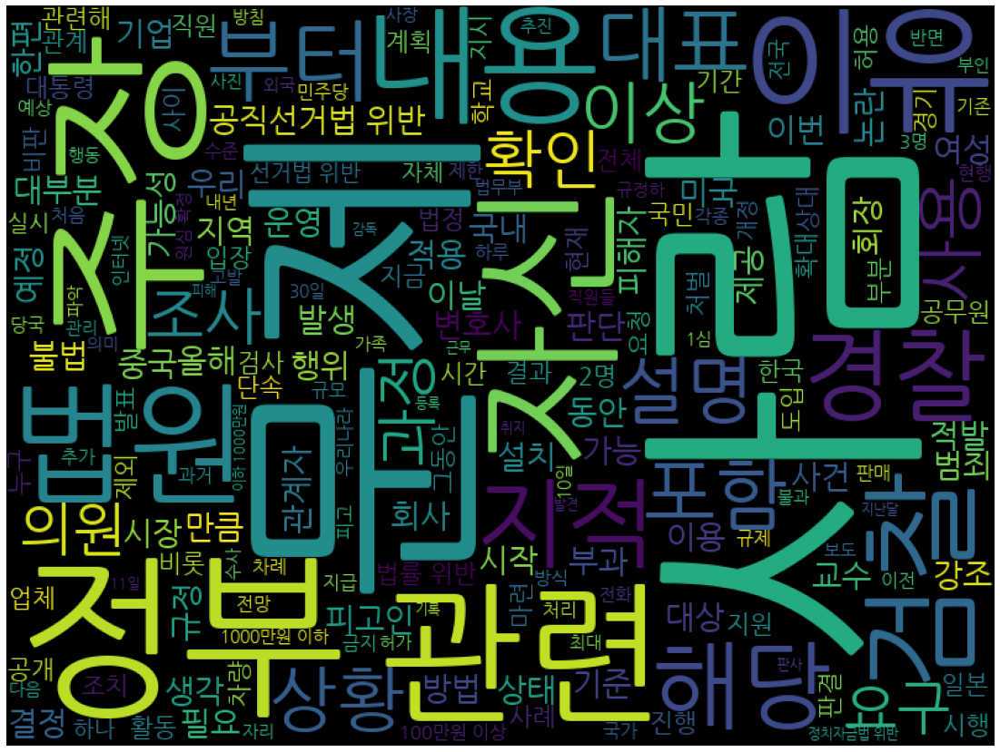

In [56]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "벌금"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

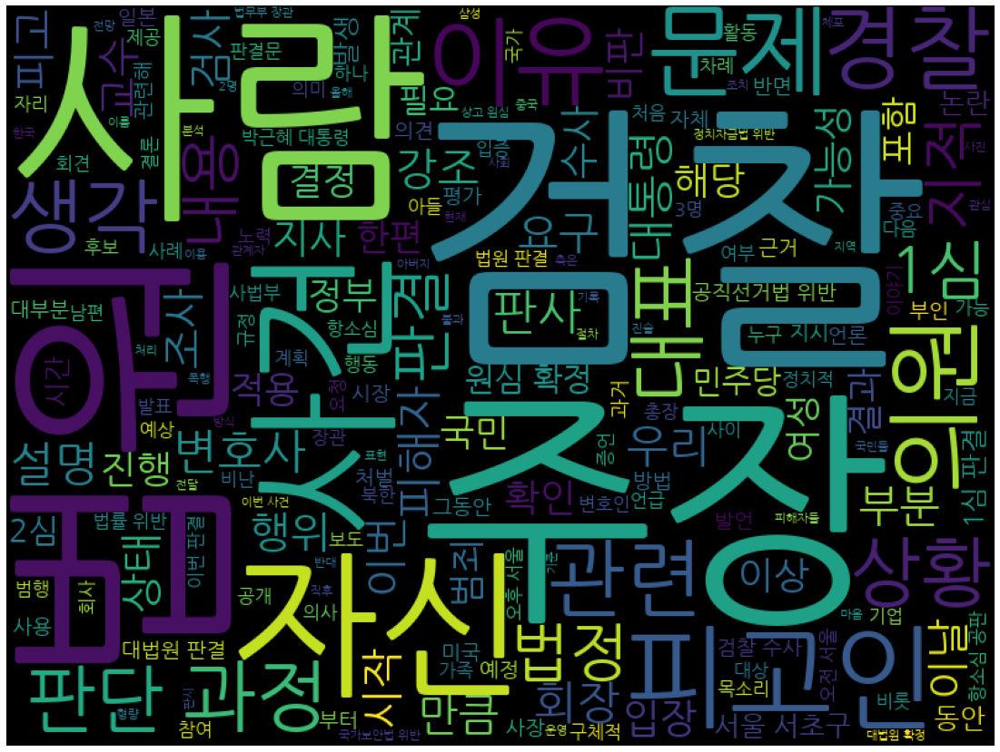

In [57]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "무죄"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

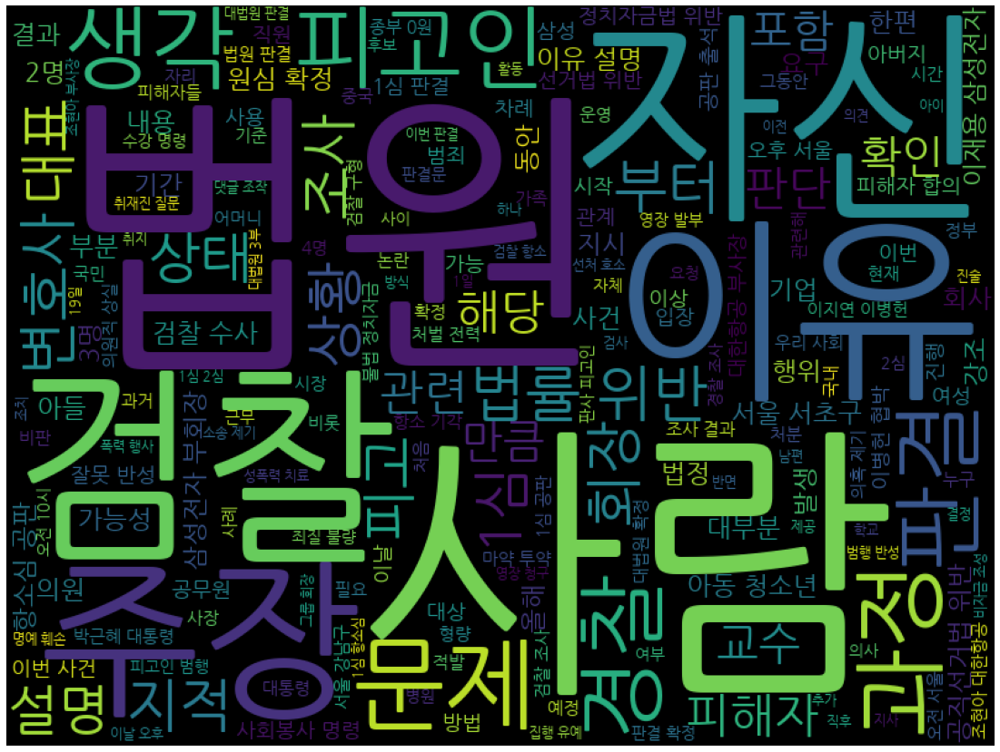

In [58]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "집행유예"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

(-0.5, 799.5, 599.5, -0.5)

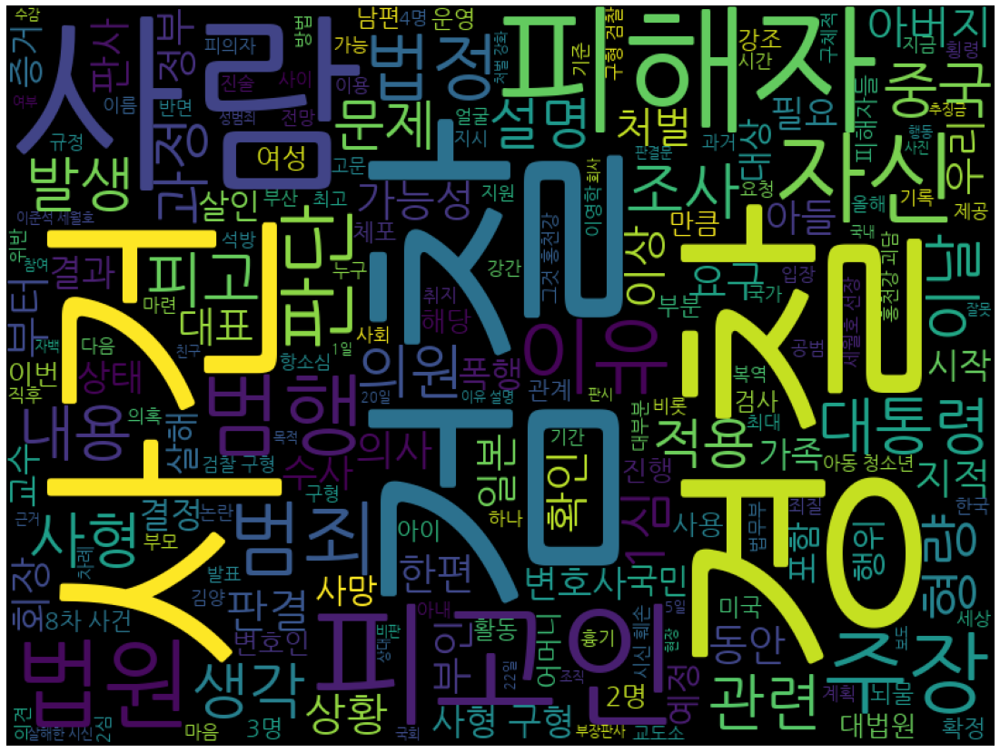

In [59]:
tmpList = [text for sentence, text in zip(sentences, hanTokenText) if sentence == "무기징역"]
cloud = WordCloud(width = 800, height = 600, font_path = font_path).generate(' '.join(tmpList))
plt.figure(figsize = (20, 15))
plt.imshow(cloud)
plt.axis("off")

# Kkma

In [67]:
kkma = Kkma()
kkmaTokenText = []
for text in tqdm(preData['text'], total = len(preData['text'])):
    token = kkma.nouns(str(text))
    kkmaTokenText.append(' '.join(token))

100%|██████████| 90141/90141 [21:30:00<00:00,  1.16it/s]    


In [69]:
dfToken = pd.read_excel('tokenization.xlsx', index_col = 0)

In [70]:
dfToken.head()

,Okt,Hannanum
0,대법원 문건 무단 유출 혐의 등 심 인정 증거 범죄 고의 검찰 심 임종헌 번복 진술...,대법원 문건 무단 유출 혐의 등 1심 인정증거 범죄고의 검찰 1심 임종헌 번복 술 ...
1,검찰 나 모습 위해 폭로 검찰 세상 후배 검사 성추행 인사 불이익 준 혐의 재판 안...,검찰 내 나 모습 폭 검찰 세상 고통 후배 검사 성추행 인사 불이익 혐의 재판 안태...
2,회식 후 술 취한 비정규직 여직원 성폭행 혐의 재판 전 은행원 대법원 실형 확정 대...,회식 후 술 정규직 여직원 성폭행한 혐의 재판 30대 전 은행원 대법원 실형 확정 ...
3,직권남용 서지현 인사 불이익 준 혐의 심 인사 불이익 심 항소 기각 대법 취지 환송...,직권남용 서지현 인사 불이익 혐의 1심 인사 불이익 2심 항소기각 대법 취지 환송 ...
4,심 판결 난 후 항소심 등 윤한 홍 국민 힘 의원 오후 서울 여의도 국회 법제사 법...,1심 판결 후 항소심 등 윤한홍 국민의힘 의원 7일 오후 서울 여의 국회 법제사법위...


In [71]:
dfToken['Kkma'] = kkmaTokenText

In [73]:
dfToken.to_excel('tokenization.xlsx')

In [2]:
preData = pd.read_excel('preprocessing_data_af_rm_kw.xlsx', index_col = 0)
preData.head()

,title,date,text,sentence,sentence2,sentence3
0,검찰 유해용 사법행정권 이탈해 1심 무죄 작심 비판,2020-10-08,대법원 문건 무단으로 유출 혐의 등 1심 인정증거 범죄고의 없다 검찰 1심 임종헌...,무죄,무죄,무죄/벌금/집행유예
1,안태근 무죄 확정 서지현 검사 검찰 변하질 않는구나,2020-10-08,검찰 썩은내 나는 모습 알리기 위해 폭로 변하지 않는 검찰과 세상에 고통스러웠다 ...,무죄,무죄,무죄/벌금/집행유예
2,만취 비정규직 성폭행 은행원 징역형 1심에서는 무죄,2020-10-08,회식 후 술에 취한 비정규직 여직원을 성폭행한 혐의로 재판에 넘겨진 30대 전 은...,무죄,무죄,무죄/벌금/집행유예
3,4번 재판 끝에 안태근 서지현 불이익 혐의 무죄 확정,2020-10-07,직권남용해 서지현 인사에 불이익 준 혐의 1심 인사 불이익 2심 항소기각 대법 취...,무죄,무죄,무죄/벌금/집행유예
4,윤한홍 국정농단 사건 재판의 무죄율 일반보다 5배 높아,2020-10-07,1심에서 판결 난 후 항소심 등 열지 않기도 윤한홍 국민의힘 의원이 7일 오후 ...,무죄,무죄,무죄/벌금/집행유예


C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


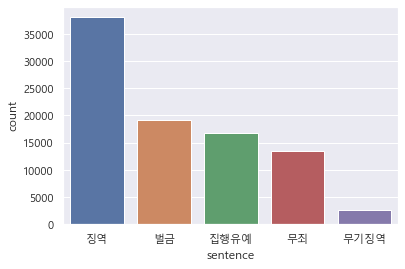

In [75]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
sns.countplot(preData["sentence"], order = preData["sentence"].value_counts().index)
plt.show()

In [ ]:
# class: 징역/무기징역, 무죄/벌금/집행유예
sentences = []
for sentence in preData['sentence']:
    if sentence == '징역':
        sentences.append('징역/무기징역')
    elif sentence == '무기징역':
        sentences.append('징역/무기징역')
    else:
        sentences.append('무죄/벌금/집행유예')
print(len(preData['sentence']))
print(len(sentences))

In [ ]:
preData['sentence3'] = sentences

C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


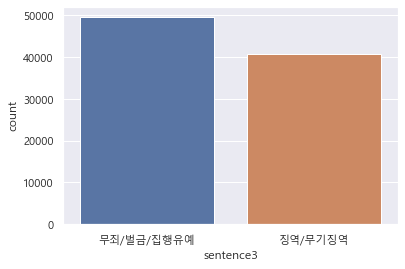

In [76]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
sns.countplot(preData["sentence3"], order = preData["sentence3"].value_counts().index)
plt.show()

In [3]:
# class: 유죄, 무죄
sentences = []
for sentence in preData['sentence']:
    if sentence == '무죄':
        sentences.append('무죄')
    else:
        sentences.append('유죄')
print(len(preData['sentence']))
print(len(sentences))

90141
90141


In [4]:
preData['sentence4'] = sentences

C:\Users\tjswn\anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


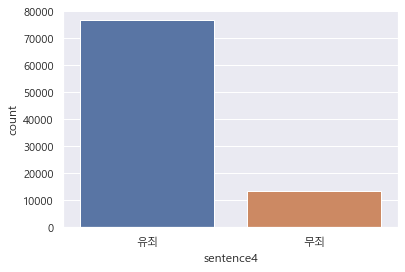

In [8]:
sns.set(font = 'Malgun Gothic', rc = {'axes.unicode_minus':False})    # 한글 폰트 설정
sns.countplot(preData["sentence4"], order = preData["sentence4"].value_counts().index)
plt.show()

In [9]:
preData.to_excel('preprocessing_data_af_rm_kw.xlsx')

# resampling

In [77]:
text = dfToken['Hannanum'].copy()
for i, t in enumerate(text):
    text[i] = str(t)

In [79]:
tfidf_vectorizer = TfidfVectorizer(min_df = 0.0, analyzer = 'word', sublinear_tf = True, ngram_range = (1, 3), max_features = 5000)
X = tfidf_vectorizer.fit_transform(text)

In [100]:
sentences = preData['sentence3']
y = np.array(sentences)

RANDOM_SEED = 42
TEST_SPLIT = 0.2

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = TEST_SPLIT, random_state = RANDOM_SEED)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = TEST_SPLIT, random_state = RANDOM_SEED)

In [101]:
scaler = MaxAbsScaler()
scaler.fit_transform(X_train)
X_train = scaler.fit_transform(X_train)

In [105]:
# 모델설정
sm = SMOTE()

# train데이터를 넣어 복제함
X_resampled, y_resampled = sm.fit_sample(X_train,list(y_train))

print('After OverSampling, the shape of train_X: {}'.format(X_resampled.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(X_resampled.shape))

print("After OverSampling, counts of label '1': {}".format(y_resampled.count('무죄/벌금/집행유예')))
print("After OverSampling, counts of label '0': {}".format(y_resampled.count('징역/무기징역')))

After OverSampling, the shape of train_X: (63492, 5000)
After OverSampling, the shape of train_y: (63492, 5000) 



TypeError: 'bool' object is not iterable

In [108]:
print(y_resampled.count('무죄/벌금/집행유예'))
print(y_resampled.count('징역/무기징역'))

31746
31746


In [10]:
import pandas as pd
import numpy as np
from functools import partial

from sklearn.naive_bayes import MultinomialNB
from sklearn import tree
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import NMF
from sklearn.metrics import accuracy_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn.metrics import accuracy_score,precision_score, classification_report
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
import os

from sklearn.preprocessing import MaxAbsScaler
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification

In [11]:
data = pd.read_excel('tokenization.xlsx', index_col = 0)
text = data['Hannanum'].copy()

In [12]:
preData =pd.read_excel('preprocessing_data_af_rm_kw.xlsx', index_col = 0)
sentences = preData['sentence4']

In [13]:
for i, t in enumerate(text):
    text[i] = str(t)

In [14]:
tfidf_vectorizer = TfidfVectorizer(min_df = 0.0, analyzer = 'word', sublinear_tf = True, ngram_range = (1, 3), max_features = 5000)
X = tfidf_vectorizer.fit_transform(text)

In [15]:
sentences = preData['sentence4']
y = np.array(sentences)

RANDOM_SEED = 42
TEST_SPLIT = 0.2

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X, y, test_size = TEST_SPLIT, random_state = RANDOM_SEED)
X_train_2, X_val_2, y_train_2, y_val_2 = train_test_split(X_train_2, y_train_2, test_size = TEST_SPLIT, random_state = RANDOM_SEED)

In [20]:
mnbModel = MultinomialNB(alpha = 1)
mnbModel.fit(X_train_2, y_train_2)
print("\ntrainingset accuracy : {:.3f}".format(mnbModel.score(X_train_2, y_train_2) * 100))
print("\ntestset accuracy : {:.3f}".format(mnbModel.score(X_val_2, y_val_2) * 100))


trainingset accuracy : 85.938

testset accuracy : 86.126


In [22]:
tree_model = tree.DecisionTreeClassifier(criterion='entropy', max_depth = 20, random_state=0)
tree_model.fit(X_train_2, y_train_2)

DecisionTreeClassifier(criterion='entropy', max_depth=20, random_state=0)

In [18]:
# criterion='entropy', max_depth = 10, random_state=0
y_pred_tr = tree_model.predict(X_val_2)
print("trainingset accuracy: : %.3f" % tree_model.score(X_train_2, y_train_2))
print('Accuracy: %.3f' % accuracy_score(y_val_2, y_pred_tr))

trainingset accuracy: : 0.870
Accuracy: 0.852


In [23]:
# criterion='entropy', max_depth = 20, random_state=0
y_pred_tr = tree_model.predict(X_val_2)
print("trainingset accuracy: : %.3f" % tree_model.score(X_train_2, y_train_2))
print('Accuracy: %.3f' % accuracy_score(y_val_2, y_pred_tr))

trainingset accuracy: : 0.910
Accuracy: 0.849


In [26]:
params = { 'n_estimators' : [10, 10],
           'max_depth' : [60, 80, 100],
           'min_samples_leaf' : [2, 4, 6],
           'min_samples_split' : [10, 20, 30]
            }

# RandomForestClassifier 객체 생성 후 GridSearchCV 수행
rf_model = RandomForestClassifier(random_state = 0, n_jobs = -1)
grid_cv = GridSearchCV(rf_model, param_grid = params, cv = 3, n_jobs = -1)
grid_cv.fit(X_train_2, y_train_2)

print('최적 하이퍼 파라미터: ', grid_cv.best_params_)
print('최고 예측 정확도: {:.3f}'.format(grid_cv.best_score_ * 100))

최적 하이퍼 파라미터:  {'max_depth': 80, 'min_samples_leaf': 4, 'min_samples_split': 20, 'n_estimators': 10}
최고 예측 정확도: 85.628


In [27]:
# class: 유죄, 무죄
# Tf-idf max_features = 5000
rf_model = RandomForestClassifier(random_state = 0, 
                                  n_estimators = 10, 
                                  max_depth = 80, 
                                  min_samples_leaf = 4,
                                  min_samples_split = 20)
rf_model.fit(X_train_2, y_train_2)
y_pred = rf_model.predict(X_val_2)
acc = accuracy_score(y_val_2, y_pred)
print('trainingset accuracy: {0:.3f}'.format(rf_model.score(X_train_2, y_train_2) * 100))
print('testset accuracy: {0:.3f}'.format(acc * 100))

trainingset accuracy: 90.295
testset accuracy: 85.745


In [28]:
y_train_lgb = np.zeros(len(y_train_2))
for idx, y in enumerate(y_train_2):
    if y == '무죄':
        y_train_lgb[idx] = 0
    else:
        y_train_lgb[idx] = 1

In [29]:
y_val_lgb = np.zeros(len(y_val_2))
for idx, y in enumerate(y_val_2):
    if y == '무죄':
        y_val_lgb[idx] = 0
    else:
        y_val_lgb[idx] = 1

In [35]:
# 학습 진행 상황 확인
logging.basicConfig(format = '%(asctime)s : %(levelname)s : %(message)s', level = logging.INFO)

In [37]:
train_ds = lgb.Dataset(X_train_2, label = y_train_lgb)
test_ds = lgb.Dataset(X_val_2, label = y_val_lgb)
params = {'learning_rate':0.03,
         'max_depth':16,
         'boosting':'gbdt',
         'metric':'binary_logloss',
         'is_training_metric':True,
         'num_leaves':144,
         'feature_fraction':0.9,
         'bagging_fraction':0.7,
         'bagging_freq':5,
         'seed':2020,
         'objective':'binary'}
lgb_model = lgb.train(params, train_ds, 1000, test_ds, verbose_eval=100, early_stopping_rounds=100)

[LightGBM] [Info] Number of positive: 48969, number of negative: 8720
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 1.294033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 765434
[LightGBM] [Info] Number of data points in the train set: 57689, number of used features: 4997
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.848845 -> initscore=1.725568
[LightGBM] [Info] Start training from score 1.725568
Training until validation scores don't improve for 100 rounds
[100]	valid_0's binary_logloss: 0.281078
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's binary_lo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [38]:
y_pred = lgb_model.predict(X_val_2)
#predictions2 = np.argmax(predictions, axis=1)
#predictedLabels = (predictions2>0.35).astype(int)
print('trainingset accuracy :', accuracy_score(X_train_2, y_train_lgb) * 100)
print("testset accuracy :",accuracy_score(y_val_lgb,y_pred) * 100)
print("classification report :\n",(classification_report(y_val_lgb,y_pred)))

TypeError: len() of unsized object